# On Neural Boltzmann Equation
To introduce one of the papers that received the Best Paper Award in NeurIPS 2018, named *Neural Ordinary Differential Equations*, and explain how it can be related with kinetic theory.

## Relations between differential equations and machine learning?

Basically there are several ways to define a nonlinear transform: 
1. direct modeling: directly writing down the nonlinear function only works if you know the exact functional form that relates the input to the output, e.g. $y=\exp(\tanh(x))$.
2. DE: model the evolutions of correlated variables, quoting *a differential equation is a way to specify an arbitrary nonlinear transform by mathematically encoding prior structural assumptions*.
3. ML: $y=ML(x)$, like trivializers said it is just a nonlinear transformation.

The reason ML is interesting is because its form is basic but adapts to the data itself. For example, a simple neural network (in design matrix form) with sigmoid activation functions is simply matrix multiplications followed by application of sigmoid functions. Specifically,
$$
ML(x)=\sigma(W_{3}\cdot\sigma(W_{2}\cdot\sigma(W_{1}\cdot x)))
$$
with $W=(W_1,W_2,W_3)$ being learnable parameters. You then choose $W$ such that $ML(x)=y$ reasonably fits the function you wanted it to fit. The theory and practice of machine learning confirms that this is a good way to learn nonlinearities. It is known that the *Universal Approximation Theorem* states, for enough layers or enough parameters (i.e. sufficiently large $W$ matrices), $ML(x)$ can approximate any nonlinear function sufficiently close (subject to common constraints).

## From sequences of transformations to neural differential equations

The neural ordinary differential equation is one of many ways to put differential equation and machine learning together. The simplest way of explaining it is that, instead of learning the nonlinear transformation directly, we wish to learn the structures of the nonlinear transformation. Thus instead of doing $y=ML(x)$, we put the machine learning model on the derivative, $y'(x) = ML(x)$, and then solve the ODE. 

But why we would like to do this?

Today, many neural network architectures such as residual networks and recurrent neural
network decoders (RNNs), contain repeating blocks of layers that have the ability to retain sequential information as well as change it in every step through a learned function. Such networks may in general be described by the equation
$$
\mathbf{h}_{t+1}=\mathbf{h}_{t}+f\left(\mathbf{h}_{t}, \theta_{t}\right)
$$
Hereby, $h_t$ is the “hidden” information at timestep $t$, and $f(h_t, \theta_t)$ is the learned function of the current hidden information and parameters $\theta_t$. It's natural to imagine this as gradually increasing the number of residual layers in a residual network. If we do this we will eventually arrive at an infinitesimal (differential) version of the above equation
$$
\frac{d \mathbf{h}(t)}{d t}=f(\mathbf{h}(t), t, \theta)
$$
By solving the above ODE, we arrive at the desired sequence of hidden states.
We will have to solve the equation during each evaluation, beginning with an initial state $h_0$, forming an initial value problem.

## What can the neural ODE be used for?

A possible application of neural ODE may be the function approximator of differential operator with strong nonlinearity.
One possible example goes to the classical Boltzmann equation
$$
\frac{D f}{Dt}=
\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}^{\prime}\right) f\left(\mathbf{u}_{1}^{\prime}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1}
$$
where the LHS is full derivatives of distribution function along particle trajectory, and the RHS is an integral.
We take this equation as an example to show the application of neural ODE, with Julialang implementation.

First, let's load all the packages that to be used in the computation.

In [1]:
using Revise
using Kinetic
using DifferentialEquations, Flux
using DiffEqFlux, Optim
using Plots

┌ Info: Precompiling Kinetic [82403725-3cee-4f7c-b214-1ce71af4a797]
└ @ Base loading.jl:1260
┌ Info: CUDAdrv.jl failed to initialize, GPU functionality unavailable (set JULIA_CUDA_SILENT or JULIA_CUDA_VERBOSE to silence or expand this message)
└ @ CUDAdrv C:\Users\NUC\.juliapro\JuliaPro_v1.4.1-1\packages\CUDAdrv\b1mvw\src\CUDAdrv.jl:67
┌ Info: Precompiling DiffEqFlux [aae7a2af-3d4f-5e19-a356-7da93b79d9d0]
└ @ Base loading.jl:1260


Generate variables from configuration file.

In [3]:
config = "../code/homogeneous/config.txt"
D = read_dict(config)
for key in keys(D)
    s = Symbol(key)
    @eval $s = $(D[key])
end

case = homogeneous
maxTime = 8
tlen = 9
u0 = -5
u1 = 5
nu = 60
nug = 0
v0 = -5
v1 = 5
nv = 60
nvg = 0
w0 = -5
w1 = 5
nw = 60
nwg = 0
vMeshType = rectangle
nm = 5
knudsen = 1
inK = 0
alpha = 1.0
omega = 0.5
nh = 5



Calculate initial values and parameters needed for evaluating collision operator.

In [4]:
tspan = (0.0, maxTime)
tRange = range(tspan[1], tspan[2], length=tlen)

γ = heat_capacity_ratio(inK, 3)
vSpace = VSpace3D(u0, u1, nu, v0, v1, nv, w0, w1, nw, vMeshType)

f0 = Float32.(0.5 * (1/π)^1.5 .* (exp.(-(vSpace.u .- 0.99).^2) .+ exp.(-(vSpace.u .+ 0.99).^2)) .* 
     exp.(-vSpace.v.^2) .* exp.(-vSpace.w.^2)) |> Array
prim0 = conserve_prim(moments_conserve(f0, vSpace.u, vSpace.v, vSpace.w, vSpace.weights), γ)
M0 = Float32.(maxwellian(vSpace.u, vSpace.v, vSpace.w, prim0)) |> Array

mu_ref = ref_vhs_vis(knudsen, alpha, omega)
kn_bzm = hs_boltz_kn(mu_ref, 1.0)
τ = mu_ref * 2. * prim0[end]^(0.5) / prim0[1];

## Fast spectral method for Boltzmann collision operator

In ancient times, some might thought the Boltzmann equation is unsolvable.

With the progress of computing capabilities, there are methods now to calculate nonlinear Boltzmann collision integral.
In 1989, Goldstein, etc. al employed a fixed Eulerian mesh to evaluate discrete collisional dynamics. 
This method is very intuitive, but since particle velocities pre/post collisions need to fall on the grid points, it has a huge requirement on computational resources.
Bobylev etc. proved that the method of computing resources consumption is about $O(N^7)$, where $N$ is the number of discrete velocity grids used in each direction, and this method possesses only half order convergence, similar to that of DSMC method.


Another thought goes to the fast Fourier transformation (FFT) to solve the collision operator in the spectral space.
In 1988,Bobylev made a preliminary attempt to calculate the Boltzmann equation of Maxwell molecules in a homogeneous flow field.
Later, Paraschi and Perthame extended this method to general collision kernel, with a compuational cost $O(N^6)$.
In 2006, Mouhot and Paraschi developed a fast spectral method based on Carleman-type Boltzmann equation, which holds the spectral accuracy and computational cost $O(M^2N^3logN)$.
It's one of the most efficient Boltzmann collision solver by now. 


We briefly introduce it on the basis of Carleman-type Boltzmann equation,
$$
\begin{aligned}
Q(f) &=\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}^{\prime}\right) f\left(\mathbf{u}_{1}^{\prime}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1} \\
&=\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}+\frac{g \Omega-\mathbf{g}}{2}\right) f\left(\mathbf{u}_{1}-\frac{g \Omega-\mathbf{g}}{2}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1} \\
&=2 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta\left(2 \mathbf{y} \cdot \mathbf{g}+\mathbf{y}^{2}\right)\left[f\left(\mathbf{u}+\frac{\mathbf{y}}{2}\right) f\left(\mathbf{u}_{1}-\frac{\mathbf{y}}{2}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \mathbf{y} d \mathbf{u}_{1} \\
&=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta\left(\mathbf{y} \cdot \mathbf{g}+\mathbf{y}^{2}\right)\left[f(\mathbf{u}+\mathbf{y}) f\left(\mathbf{u}_{1}-\mathbf{y}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \mathbf{y} d \mathbf{u}_{1} \\
&=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta(\mathbf{y} \cdot \mathbf{z})[f(\mathbf{u}+\mathbf{y}) f(\mathbf{u}+\mathbf{z})-f(\mathbf{u}) f(\mathbf{u}+\mathbf{y}+\mathbf{z})] d \mathbf{y} d \mathbf{z}
\end{aligned}
$$
with $\Theta=\mathscr{B} / g, \mathbf{y}=(g \Omega-\mathbf{g}) / 2, \mathbf{z}=\mathbf{u}_{1}-\mathbf{u}-\mathbf{y}=-\mathbf{g}-\mathbf{y}$.
In the Boltzmann equation, the collision kernel is $\mathscr{B}(\cos \theta, g)=\Theta g$, and $\Theta$ is the differential cross section.
A generalized collision kernel can be defined as
$$
\mathscr{B}=C_{\alpha, \gamma}^{\prime \prime} \sin ^{\alpha+\gamma-1}\left(\frac{\theta}{2}\right) \cos ^{-\gamma}\left(\frac{\theta}{2}\right) g^{\alpha}
$$
with
$$
C_{\alpha, \gamma}^{\prime \prime}=\frac{\Gamma[(7+\alpha) / 2]}{6 \Gamma[(3+\alpha+\gamma) / 2] \Gamma(2-\gamma / 2)} C_{\alpha}
$$
where $C_\alpha$ is a parameter.


In the fast spectral method, we can periodize the particle distribution function in $D_L=[-L,L]^3$, and expand it into Fourier series
$$
\begin{array}{l}
f(\mathbf{u})=\sum_{k=-N / 2}^{N / 2-1} \hat{f}_{k} \exp \left(i \xi_{k} \cdot \mathbf{u}\right) \\
\hat{f}_{k}=\frac{1}{(2 L)^{3}} \int_{D_{L}} f(\mathbf{u}) \exp \left(-i \xi_{k} \cdot \mathbf{u}\right) d \mathbf{u}
\end{array}
$$
with$x_k = k\pi/L$ being frequency component.
The collision operator can also be expanded as
$$
\hat{Q}_{j}=\sum_{l, m=-N_{k} / 2,(l+m=j)}^{N_{k} / 2-1} \hat{f}_{l} \hat{f}_{m}[\beta(l, m)-\beta(m, m)]
$$
with the kernel mode being
$$
\begin{array}{l}
\beta(l, m)=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \delta(\mathbf{y} \cdot \mathbf{z}) \Theta \exp \left(i \xi_{l} \cdot \mathbf{y}+i \xi_{m} \cdot \mathbf{z}\right) d \mathbf{y} d \mathbf{z} \\
=\iint \delta\left(\mathbf{e} \cdot \mathbf{e}^{\prime}\right) \Theta\left[\int_{-R}^{R} \rho \exp \left(i \rho \xi_{l} \cdot \mathbf{e}\right) d \rho\right]\left[\int_{-R}^{R} \rho^{\prime} \exp \left(i \rho^{\prime} \xi_{m} \cdot \mathbf{e}^{\prime}\right) d \rho^{\prime}\right] d \mathbf{e} d \mathbf{e}^{\prime} \\
=4 \int\left[\int_{0}^{R} \rho \cos \left(\rho \xi_{l} \cdot \mathbf{e}\right) d \rho\right]\left[\int \delta\left(\mathbf{e} \cdot \mathbf{e}^{\prime}\right) \int_{0}^{R} \rho^{\prime} \Theta \cos \left(\rho^{\prime} \xi_{m} \cdot \mathbf{e}^{\prime}\right) d \rho^{\prime} d \mathbf{e}^{\prime}\right] d \mathbf{e}
\end{array}
$$
The separation of mode $l$ and $m$ can be achieved by numerical quadrature.
Hence, the Boltzmann integral can be evaluated by calcuating convolutions with FFT.

**You may also notice the drawbacks of fast spectral method:**
1. NOT intuitive
2. requires high dimensionality of phase space



In [5]:
phi, psi, phipsi = kernel_mode( nm, vSpace.u1, vSpace.v1, vSpace.w1, vSpace.du[1,1,1], vSpace.dv[1,1,1], vSpace.dw[1,1,1],
                                vSpace.nu, vSpace.nv, vSpace.nw, alpha );

Solve the Boltzmann operator with fast spectral method

In [6]:
function boltzmann!(df, f::Array{<:Real,3}, p, t)
    Kn, M, phi, psi, phipsi = p
    df .= boltzmann_fft(f, Kn, M, phi, psi, phipsi) # https://github.com/vavrines/Kinetic.jl
end

function bgk!(df, f::Array{<:Real,3}, p, t)
    g, tau = p
    df .= (g .- f) ./ tau
end

bgk! (generic function with 1 method)

In [7]:
#--- Boltzmann ---#
prob = ODEProblem(boltzmann!, f0, tspan, [kn_bzm, nm, phi, psi, phipsi])
#prob = ODEProblem(bgk!, f0, tspan, [g0, τ])
data_boltz = solve(prob, Tsit5(), saveat=tRange) |> Array;

In [8]:
#--- BGK ---#
prob1 = ODEProblem(bgk!, f0, tspan, [M0, τ])
data_bgk = solve(prob, Tsit5(), saveat=tRange) |> Array;

Let's do a dimension reduction to present clean result in one velocity direction

In [9]:
data_boltz_1D = zeros(Float32, axes(data_boltz, 1), axes(data_boltz, 4))
data_bgk_1D = zeros(Float32, axes(data_bgk, 1), axes(data_bgk, 4))
for j in axes(data_boltz_1D, 2), i in axes(data_boltz_1D, 1)
    data_boltz_1D[i,j] = sum(@. vSpace.weights[i,:,:] * data_boltz[i,:,:,j])
    data_bgk_1D[i,j] = sum(@. vSpace.weights[i,:,:] * data_bgk[i,:,:,j])
end

f0_1D = zeros(Float32, axes(f0, 1))
for i in axes(data_boltz_1D, 1)
    f0_1D[i] = sum(@. vSpace.weights[i,:,:] * f0[i,:,:])
end

M0_1D = zeros(Float32, axes(M0, 1))
for i in axes(M0, 1)
    M0_1D[i] = sum(@. vSpace.weights[i,:,:] * M0[i,:,:])
end

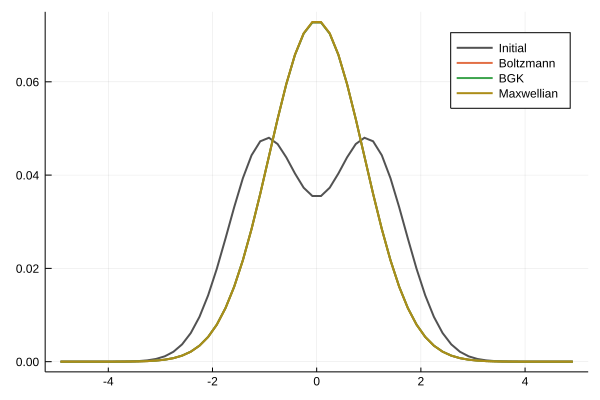

In [16]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,1], lw=2, label="Initial", color=:gray32)
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,end], lw=2, label="Boltzmann")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_bgk_1D[:,end], lw=2, label="BGK")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], M0_1D[:], lw=2, label="Maxwellian", color=5)

Then, let's construct our neural ODE.

In [12]:
#--- neural ode ---#
dudt = FastChain( (x, p) -> x.^2, # initial guess
                   FastDense(vSpace.nu, vSpace.nu*nh, tanh), # our 1-layer network
                   FastDense(vSpace.nu*nh, vSpace.nu) )
n_ode = NeuralODE(dudt, tspan, Tsit5(), saveat=tRange)

function loss_n_ode(p)
    pred = n_ode(f0_1D, p)
    loss = sum(abs2, pred .- data_boltz_1D)
    return loss, pred
end

cb = function (p, l, pred; doplot=true)
    display(l)
    # plot current prediction against dataset
    if doplot
        pl = plot(tRange, data_boltz_1D[vSpace.nu÷2,:], lw=2, label="Exact")
        scatter!(pl, tRange, pred[vSpace.nu÷2,:], lw=2, label="NN prediction")
        display(plot(pl))
    end
    return false
end

#5 (generic function with 1 method)

Do the training with ADAM optimizer

0.07124326f0

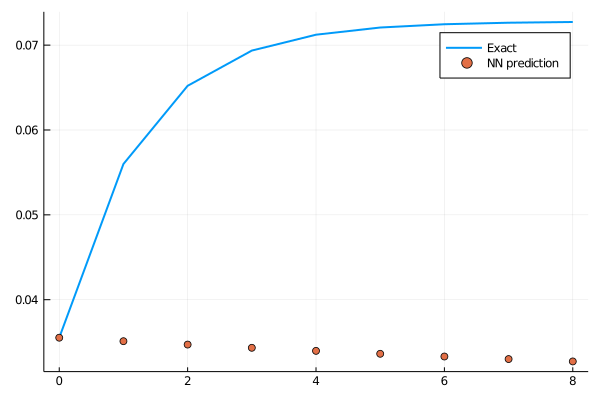

loss: 0.0712:   0%|▏                                        |  ETA: 3:15:50

0.052355062f0

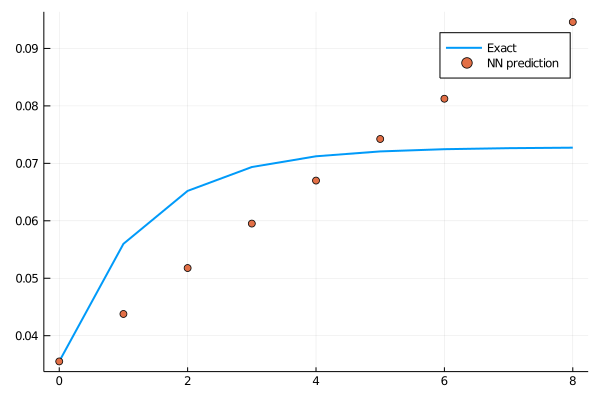

loss: 0.0524:   1%|▎                                        |  ETA: 1:40:26

0.03450407f0

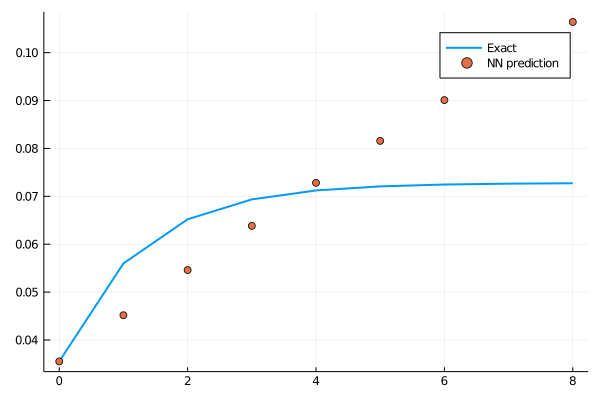

loss: 0.0345:   1%|▍                                        |  ETA: 1:00:15

0.039125666f0

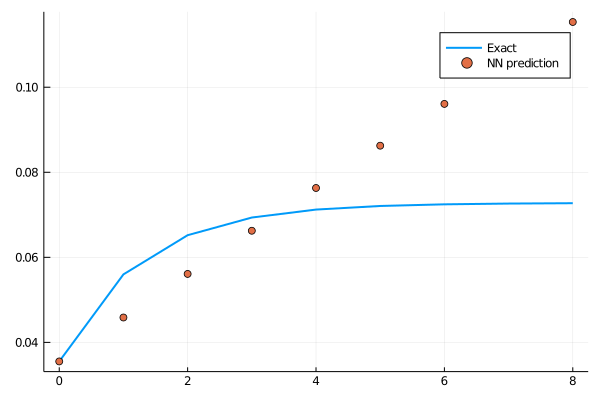

loss: 0.0391:   1%|▌                                        |  ETA: 0:46:24

0.03379035f0

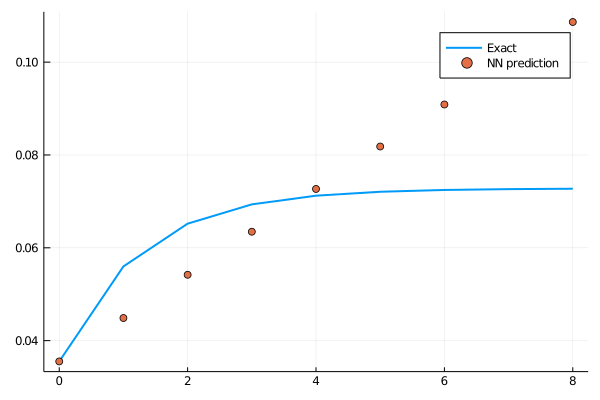

loss: 0.0338:   2%|▋                                        |  ETA: 0:37:44

0.021836665f0

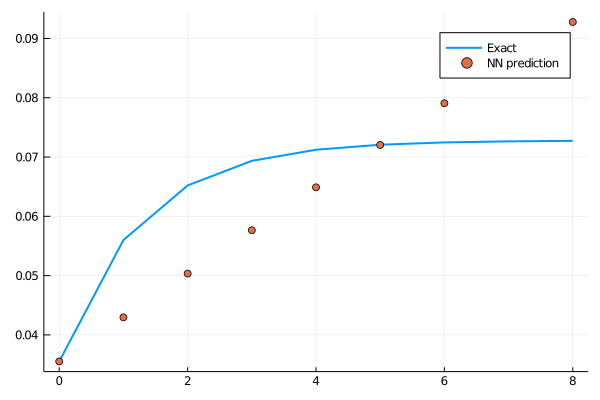

loss: 0.0218:   2%|▉                                        |  ETA: 0:30:13

0.01597861f0

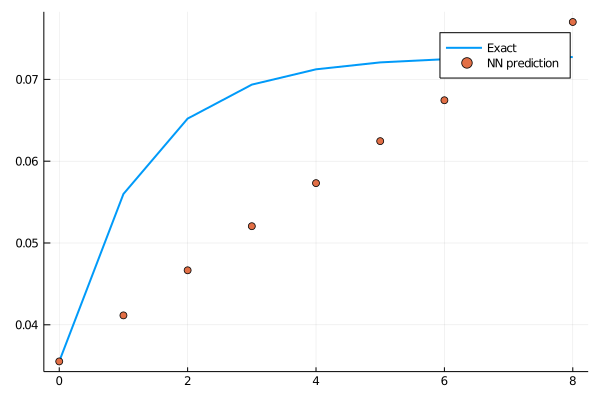

loss: 0.016:   2%|█                                        |  ETA: 0:26:17

0.01634071f0

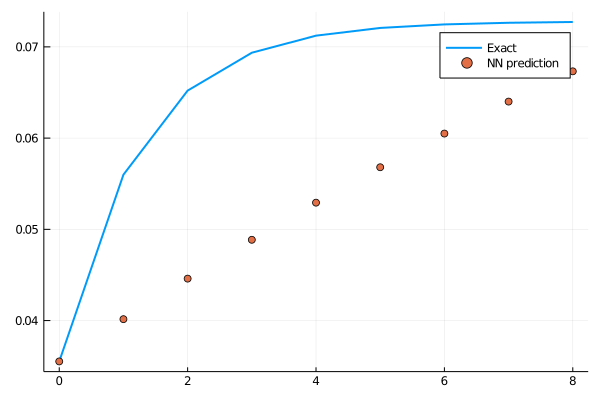

loss: 0.0163:   3%|█▏                                       |  ETA: 0:23:16

0.01867489f0

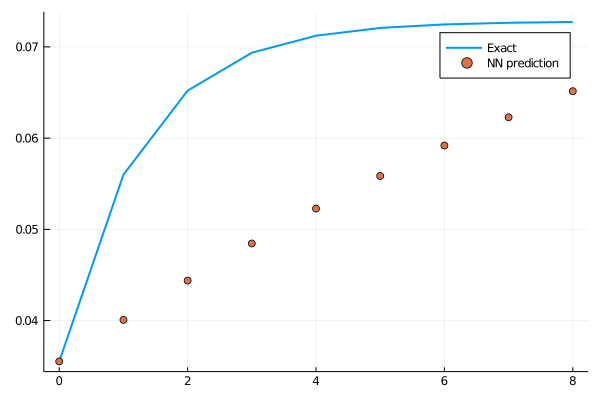

loss: 0.0187:   3%|█▎                                       |  ETA: 0:20:09

0.020711897f0

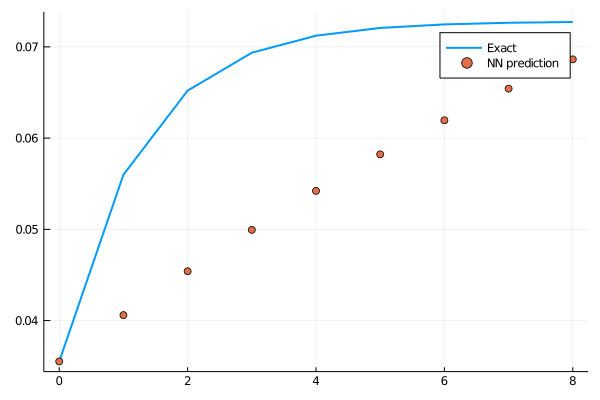

loss: 0.0207:   3%|█▍                                       |  ETA: 0:18:19

0.019686772f0

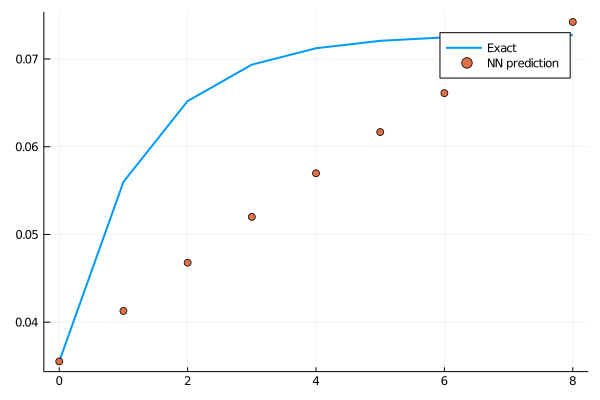

loss: 0.0197:   4%|█▌                                       |  ETA: 0:16:49

0.015244243f0

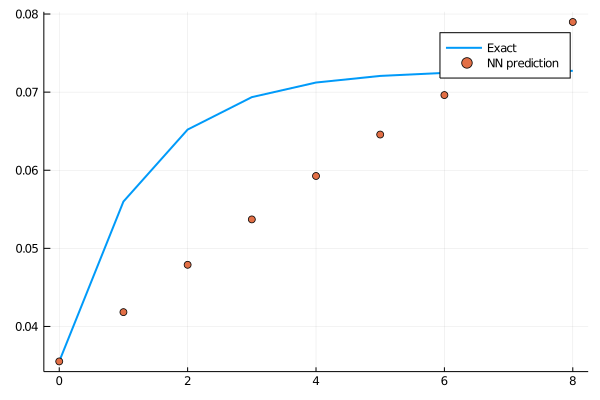

loss: 0.0152:   4%|█▋                                       |  ETA: 0:15:09

0.010601141f0

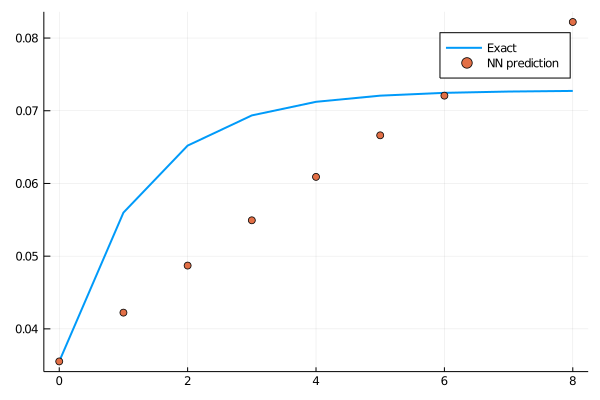

loss: 0.0106:   4%|█▊                                       |  ETA: 0:14:06

0.008687979f0

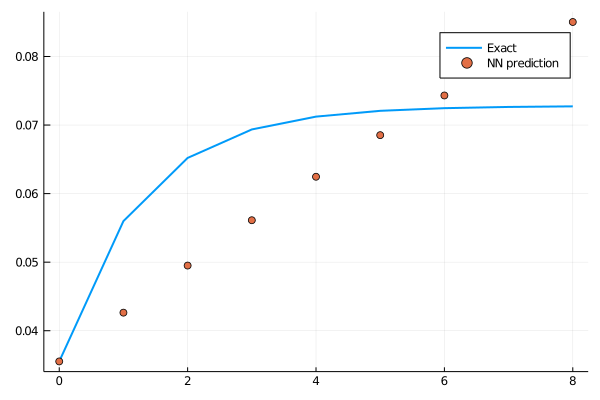

loss: 0.00869:   5%|█▉                                       |  ETA: 0:13:12

0.009793062f0

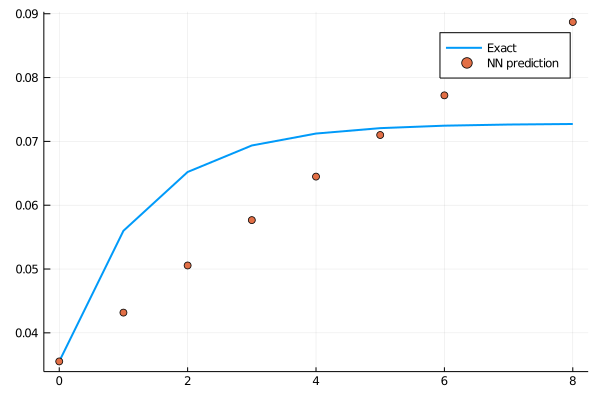

loss: 0.00979:   5%|██                                       |  ETA: 0:12:08

0.012181441f0

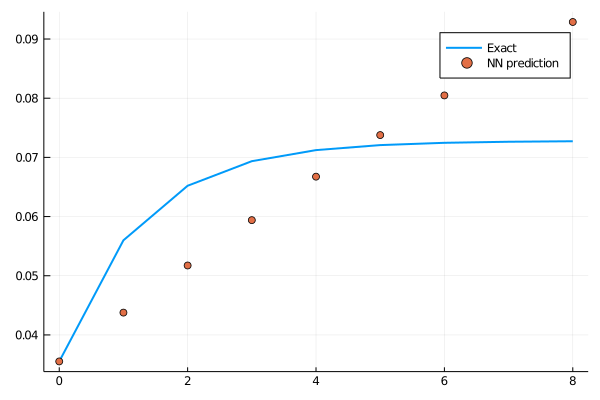

loss: 0.0122:   5%|██▏                                      |  ETA: 0:11:27

0.013408357f0

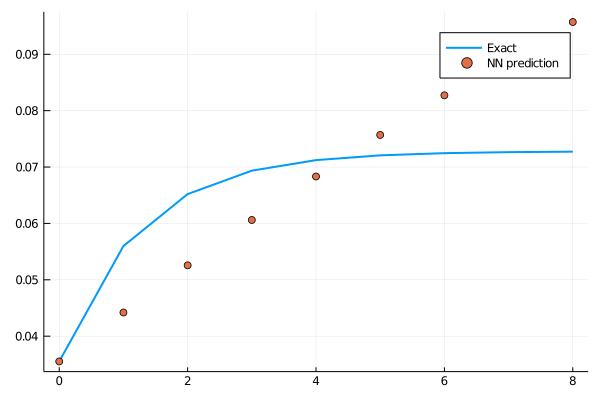

loss: 0.0134:   6%|██▎                                      |  ETA: 0:10:51

0.012349913f0

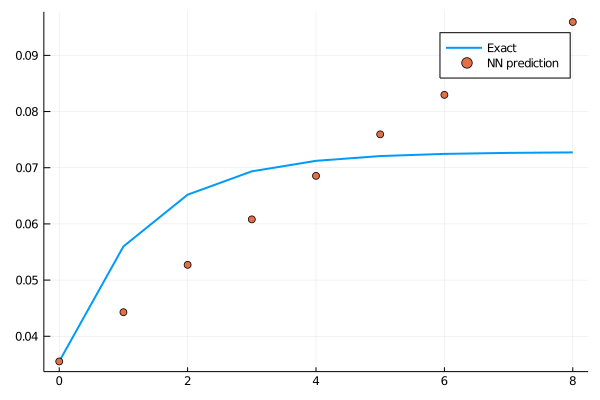

loss: 0.0123:   6%|██▌                                      |  ETA: 0:10:07

0.010022556f0

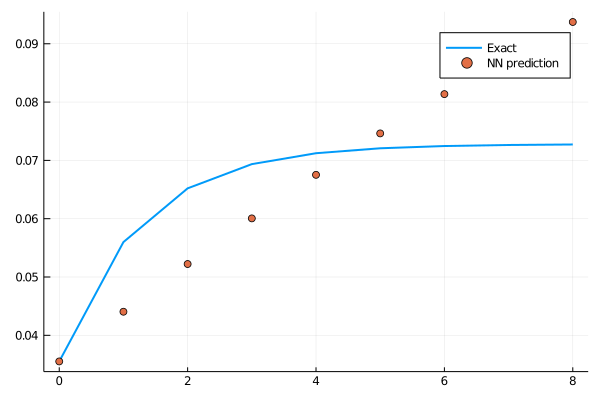

loss: 0.01:   6%|██▋                                      |  ETA: 0:09:38

0.007963803f0

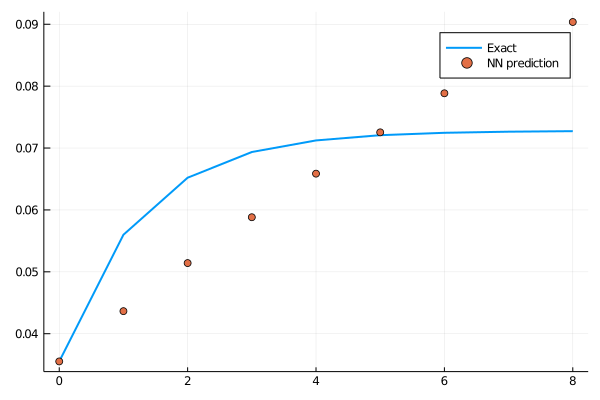

loss: 0.00796:   7%|██▊                                      |  ETA: 0:09:11

0.007080932f0

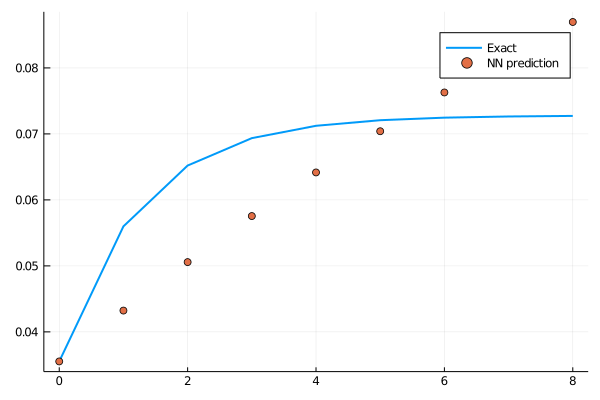

loss: 0.00708:   7%|██▉                                      |  ETA: 0:08:40

0.007494274f0

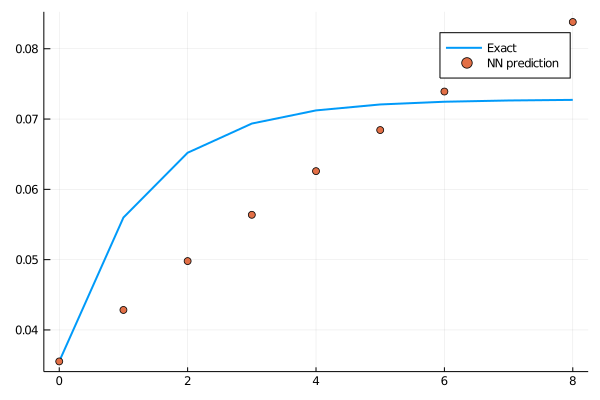

loss: 0.00749:   7%|███                                      |  ETA: 0:08:19

0.008460384f0

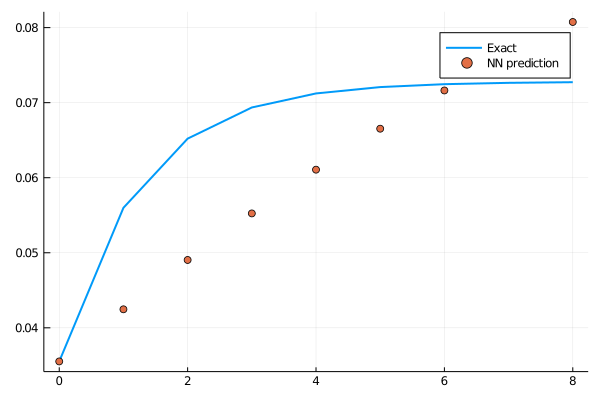

loss: 0.00846:   8%|███▏                                     |  ETA: 0:07:59

0.008976776f0

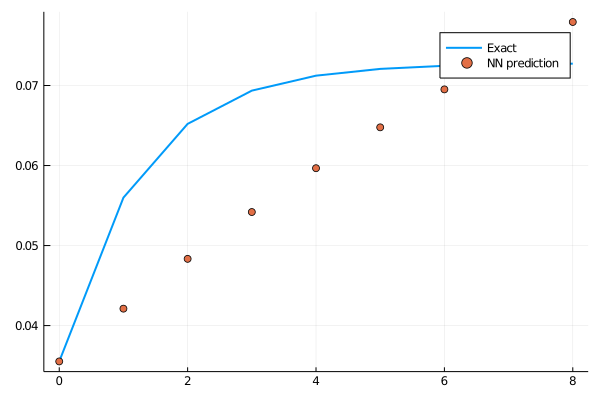

loss: 0.00898:   8%|███▎                                     |  ETA: 0:07:35

0.008692284f0

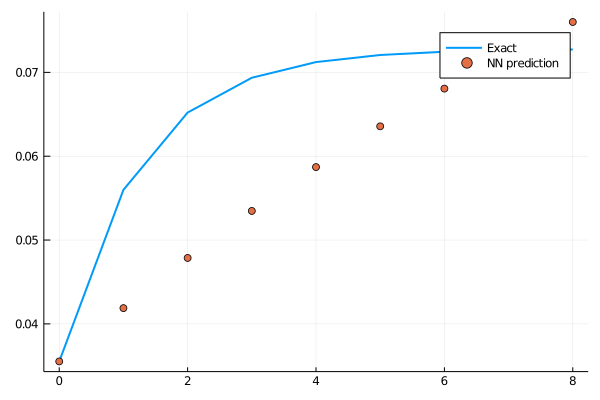

loss: 0.00869:   8%|███▍                                     |  ETA: 0:07:19

0.007924205f0

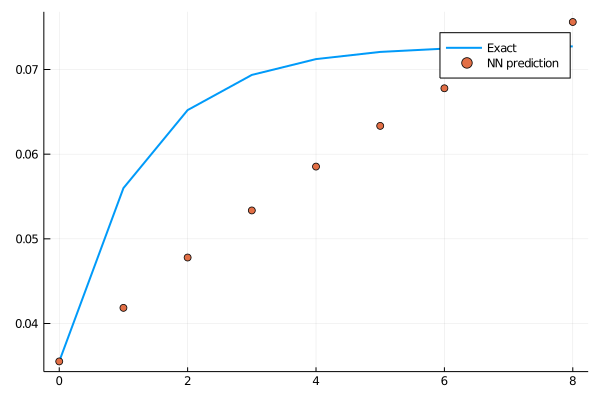

loss: 0.00792:   9%|███▌                                     |  ETA: 0:07:03

0.007136514f0

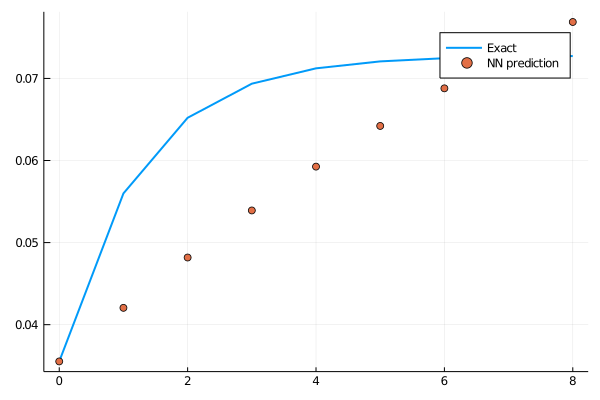

loss: 0.00714:   9%|███▊                                     |  ETA: 0:06:44

0.0066040643f0

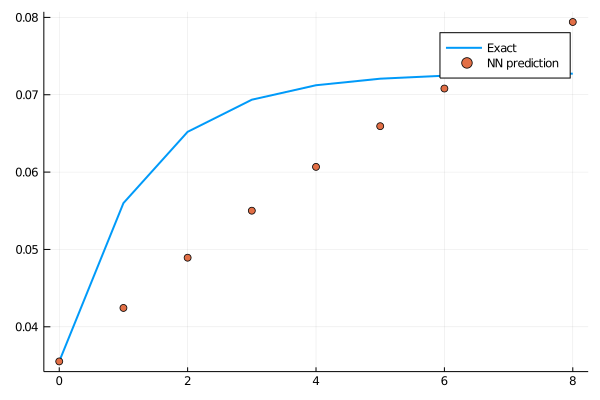

loss: 0.0066:   9%|███▉                                     |  ETA: 0:06:31

0.006376414f0

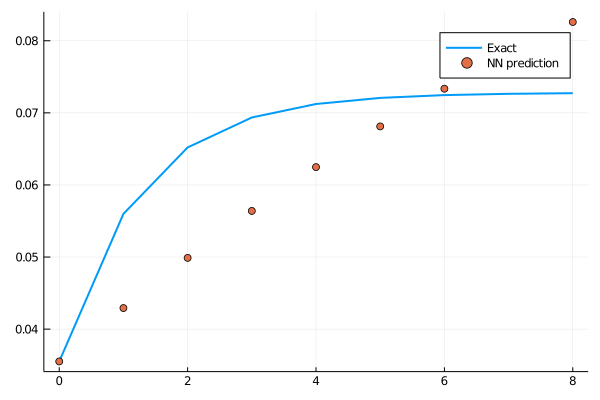

loss: 0.00638:  10%|███▉                                     |  ETA: 0:06:19

0.006408639f0

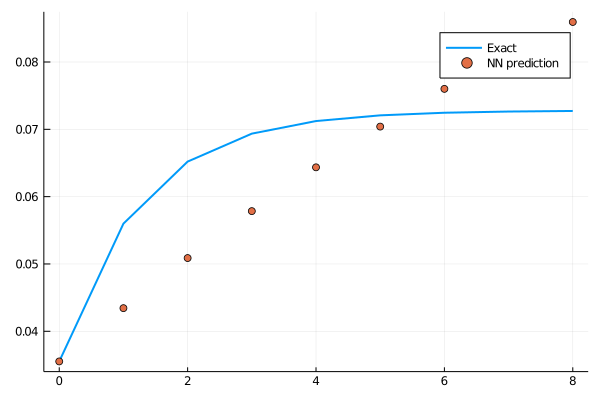

loss: 0.00641:  10%|████▏                                    |  ETA: 0:06:03

0.0066022607f0

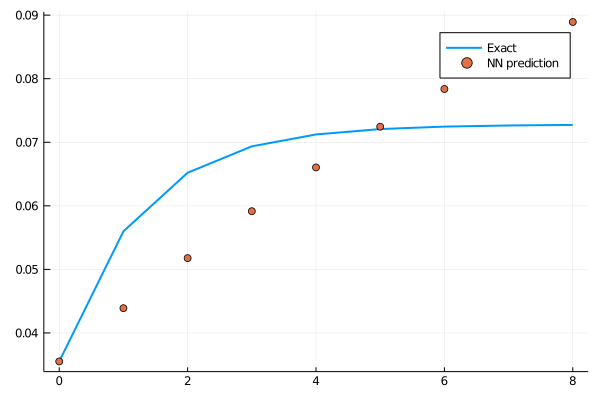

loss: 0.0066:  10%|████▎                                    |  ETA: 0:05:53

0.006729172f0

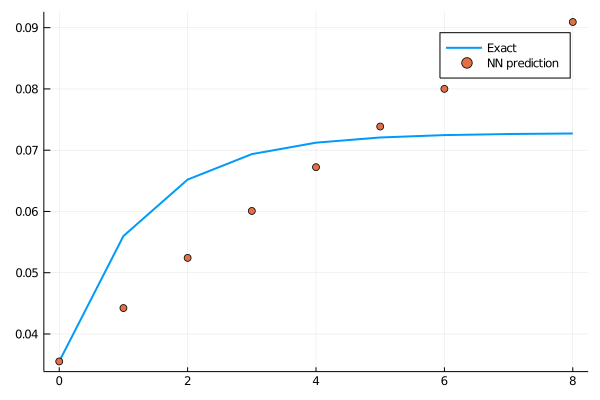

loss: 0.00673:  11%|████▍                                    |  ETA: 0:05:43

0.0066154837f0

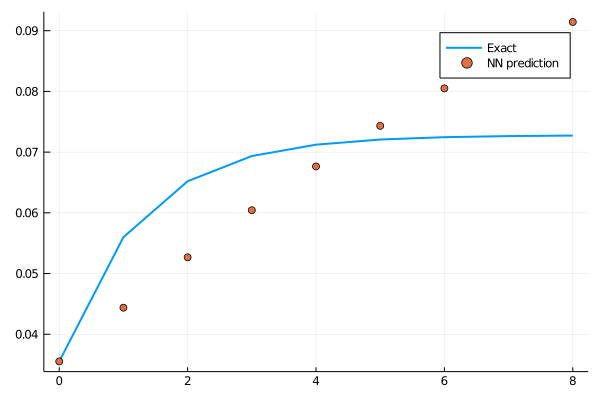

loss: 0.00662:  11%|████▌                                    |  ETA: 0:05:30

0.0063272943f0

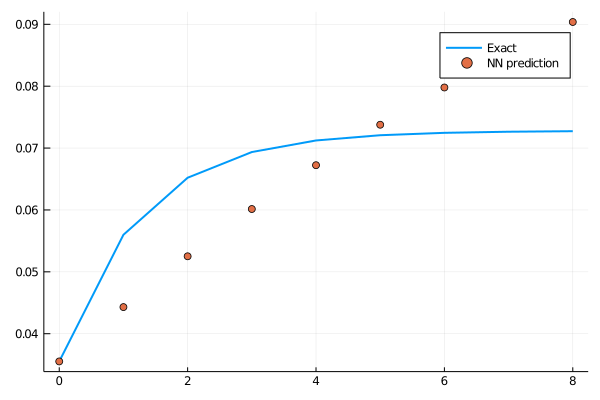

loss: 0.00633:  11%|████▋                                    |  ETA: 0:05:21

0.0059914324f0

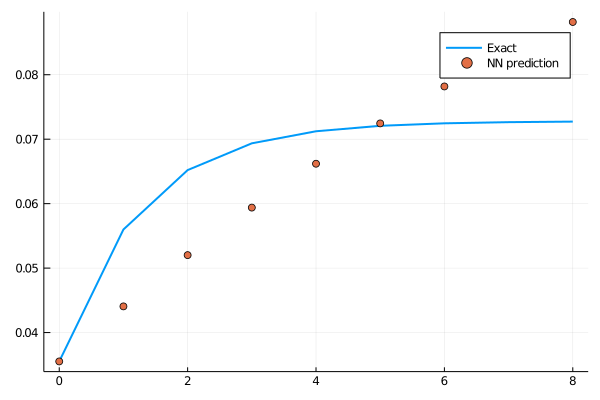

loss: 0.00599:  12%|████▊                                    |  ETA: 0:05:13

0.005668719f0

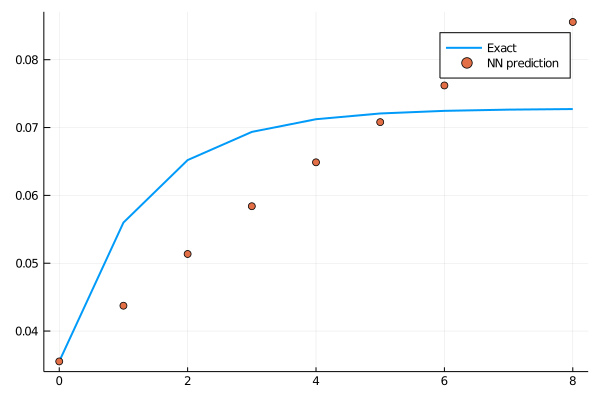

loss: 0.00567:  12%|████▉                                    |  ETA: 0:05:02

0.005457921f0

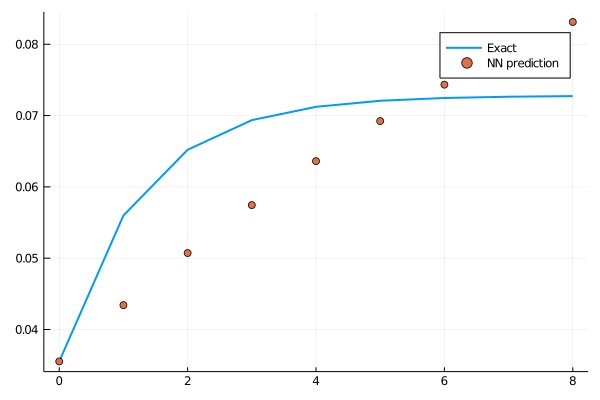

loss: 0.00546:  12%|█████                                    |  ETA: 0:04:55

0.005460376f0

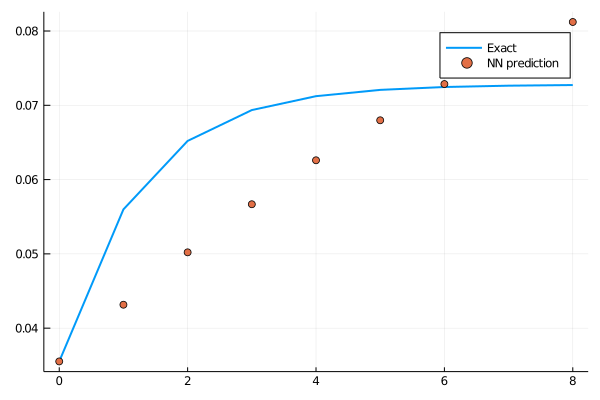

loss: 0.00546:  13%|█████▏                                   |  ETA: 0:04:48

0.005607064f0

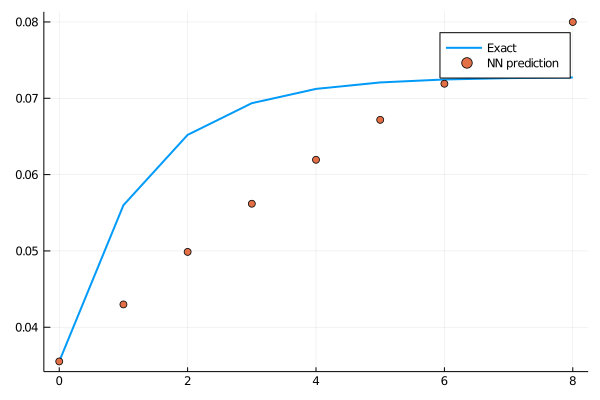

loss: 0.00561:  13%|█████▍                                   |  ETA: 0:04:39

0.005684608f0

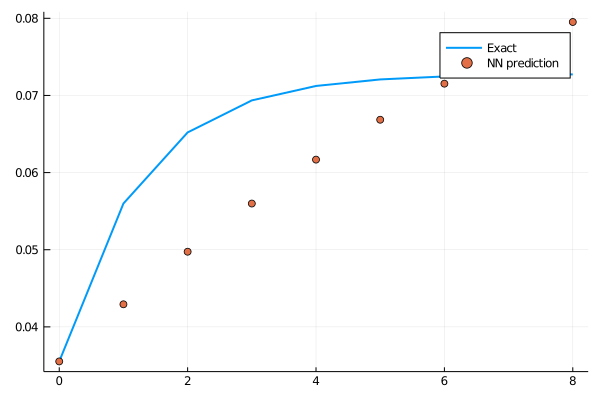

loss: 0.00568:  13%|█████▌                                   |  ETA: 0:04:33

0.0055543175f0

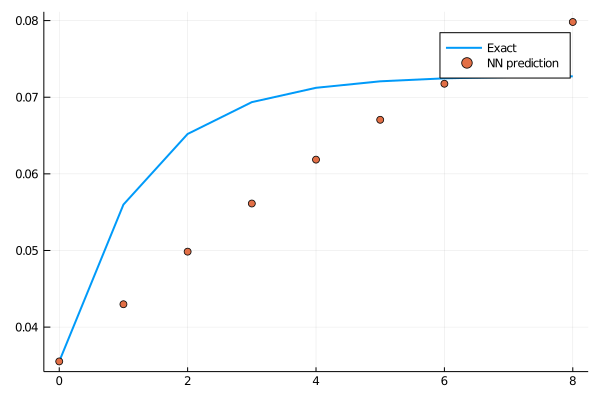

loss: 0.00555:  14%|█████▋                                   |  ETA: 0:04:26

0.005279907f0

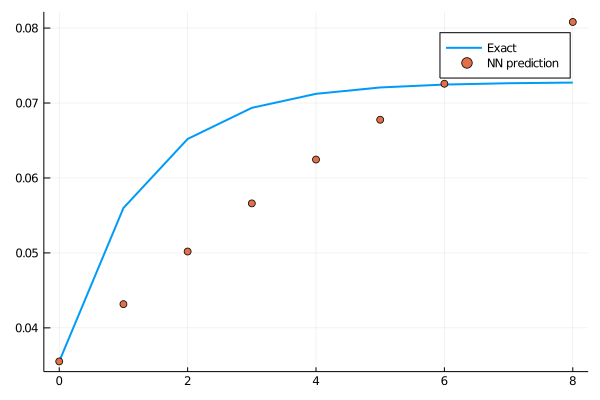

loss: 0.00528:  14%|█████▊                                   |  ETA: 0:04:18

0.005025383f0

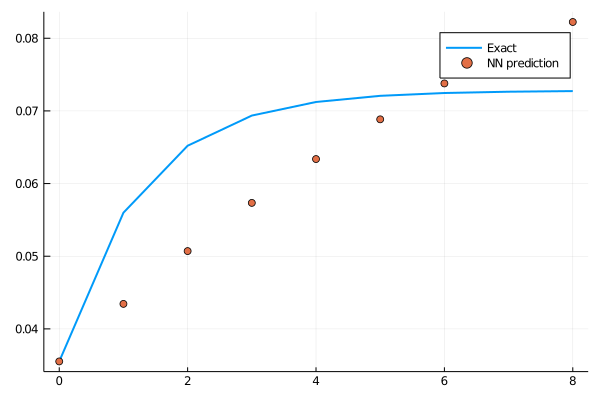

loss: 0.00503:  14%|█████▉                                   |  ETA: 0:04:13

0.004889953f0

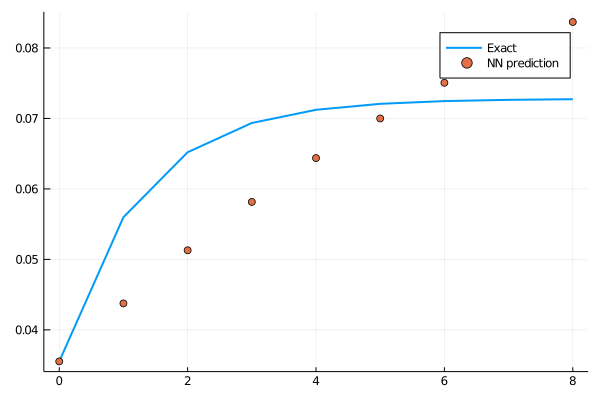

loss: 0.00489:  15%|██████                                   |  ETA: 0:04:08

0.0048705437f0

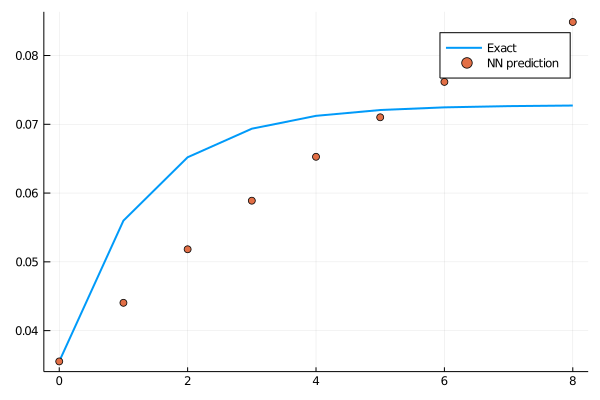

loss: 0.00487:  15%|██████▏                                  |  ETA: 0:04:01

0.0049108476f0

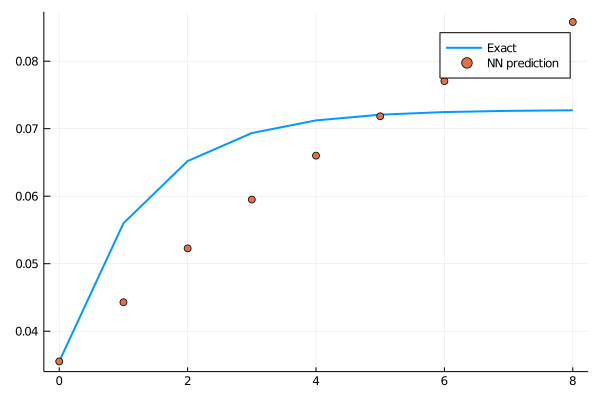

loss: 0.00491:  15%|██████▎                                  |  ETA: 0:03:56

0.0049180775f0

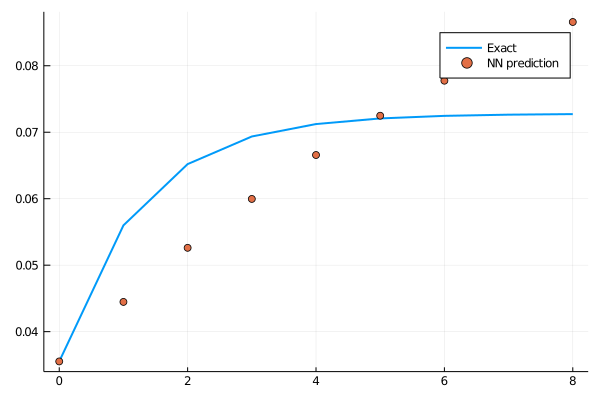

loss: 0.00492:  16%|██████▍                                  |  ETA: 0:03:51

0.0048249876f0

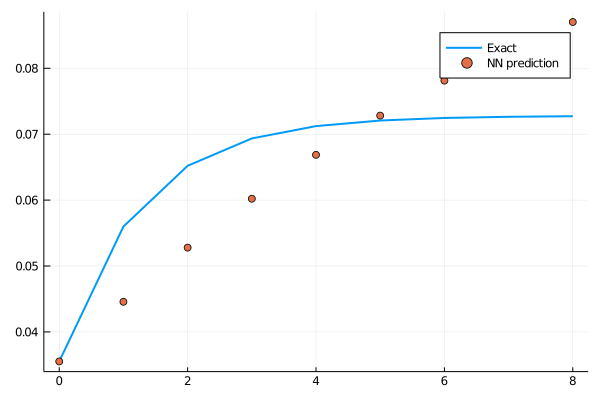

loss: 0.00482:  16%|██████▌                                  |  ETA: 0:03:45

0.004663121f0

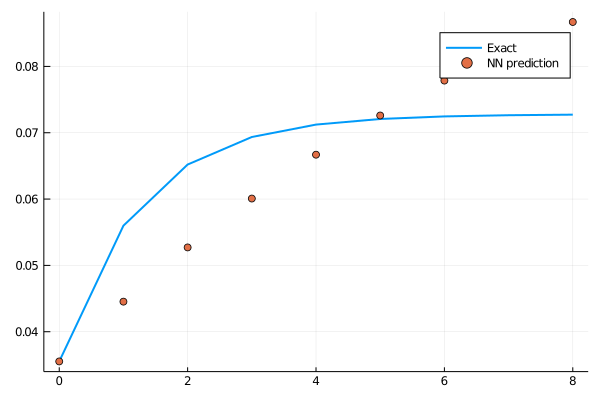

loss: 0.00466:  16%|██████▋                                  |  ETA: 0:03:41

0.004509502f0

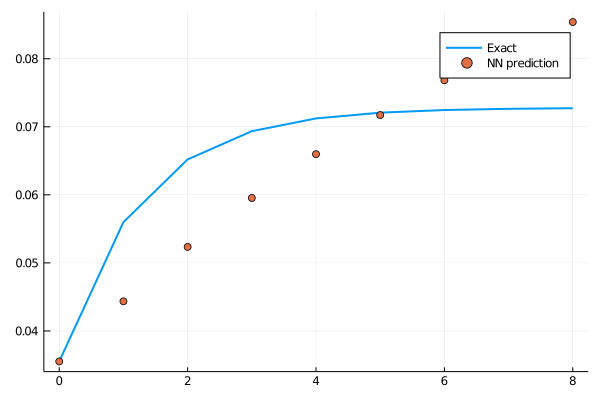

loss: 0.00451:  17%|██████▊                                  |  ETA: 0:03:37

0.004412394f0

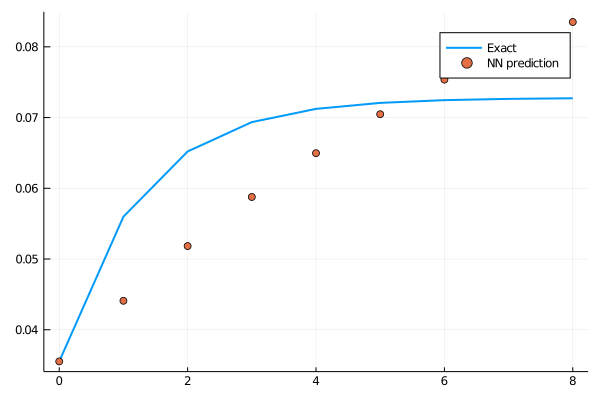

loss: 0.00441:  17%|███████                                  |  ETA: 0:03:31

0.0043770582f0

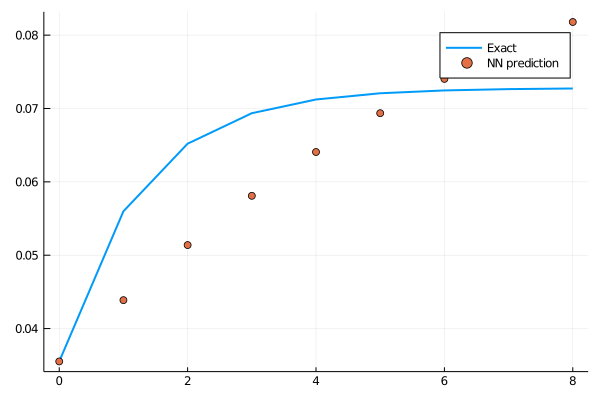

loss: 0.00438:  17%|███████▏                                 |  ETA: 0:03:28

0.004358742f0

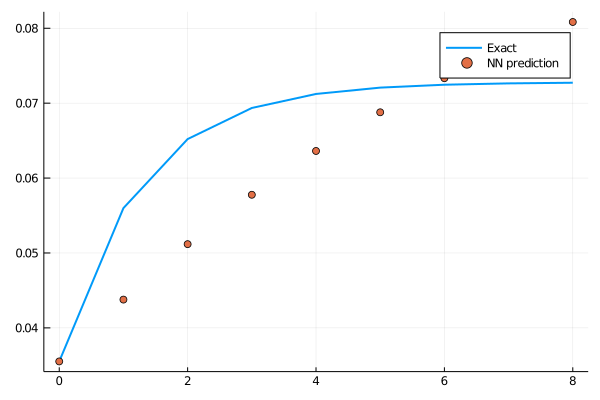

loss: 0.00436:  18%|███████▎                                 |  ETA: 0:03:24

0.0043064794f0

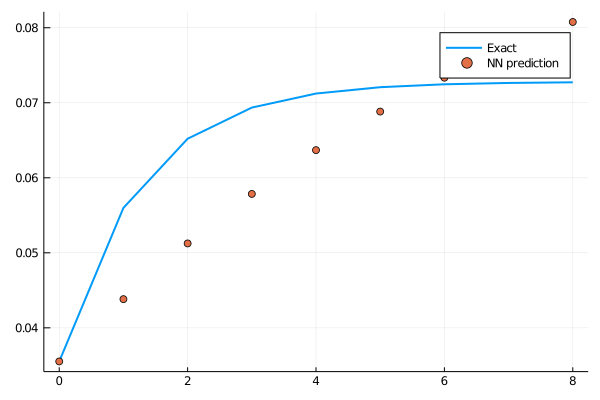

loss: 0.00431:  18%|███████▍                                 |  ETA: 0:03:19

0.004225722f0

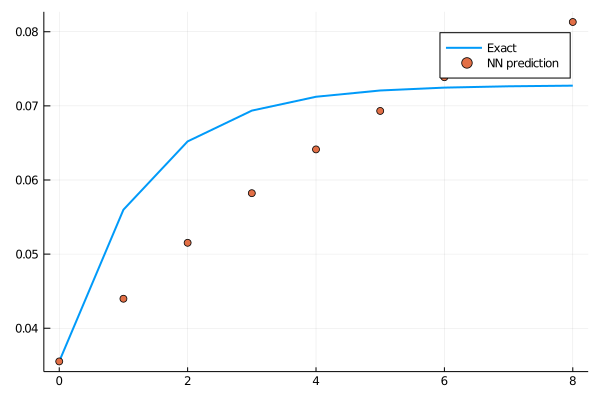

loss: 0.00423:  18%|███████▌                                 |  ETA: 0:03:16

0.00413642f0

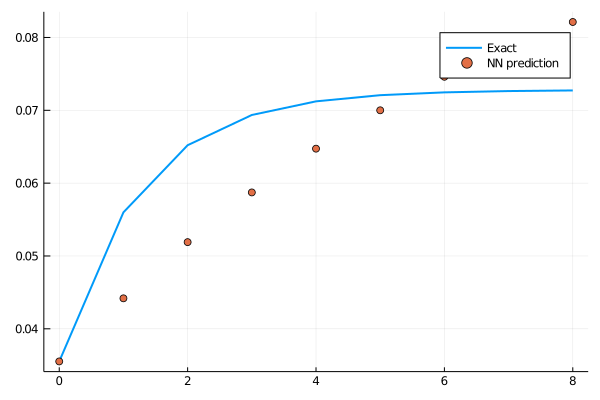

loss: 0.00414:  19%|███████▋                                 |  ETA: 0:03:13

0.0040470054f0

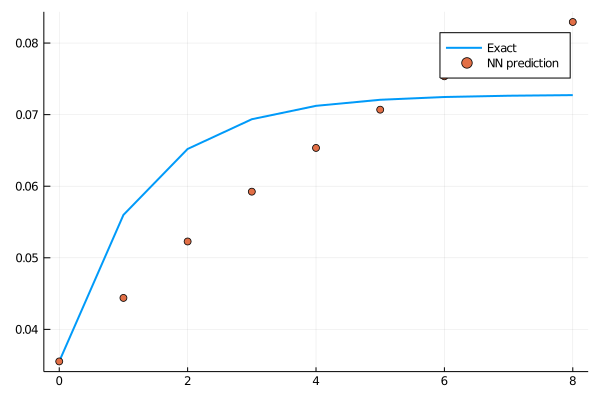

loss: 0.00405:  19%|███████▊                                 |  ETA: 0:03:08

0.0039658546f0

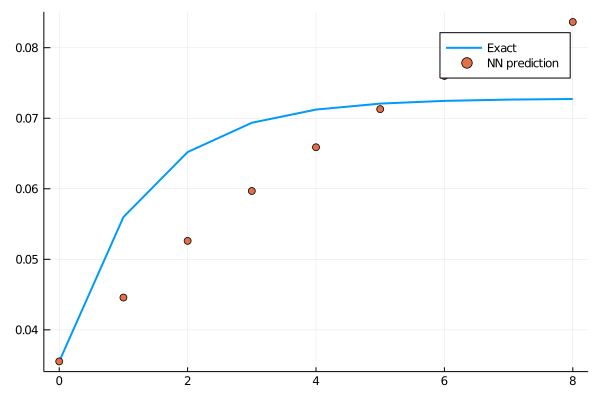

loss: 0.00397:  19%|███████▉                                 |  ETA: 0:03:05

0.0038994509f0

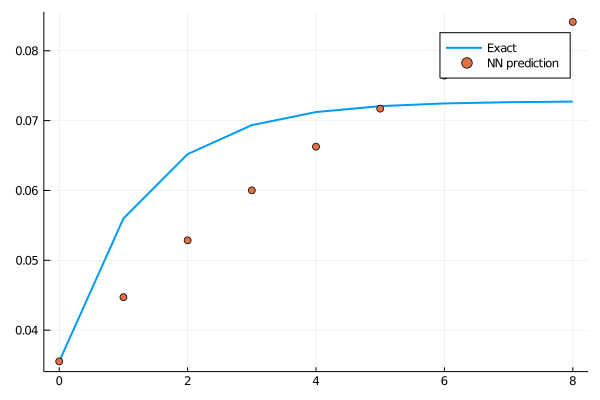

loss: 0.0039:  20%|████████                                 |  ETA: 0:03:02

0.0038493015f0

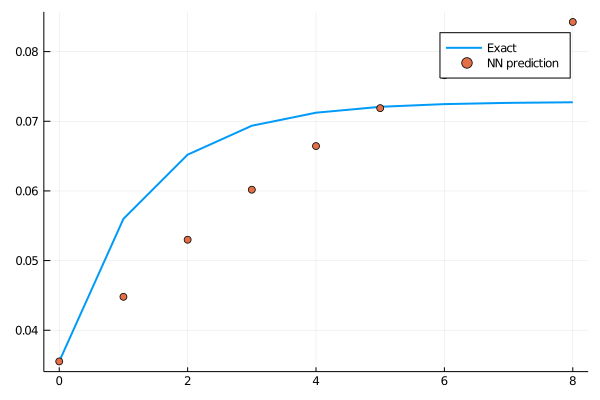

loss: 0.00385:  20%|████████▎                                |  ETA: 0:02:58

0.0038030557f0

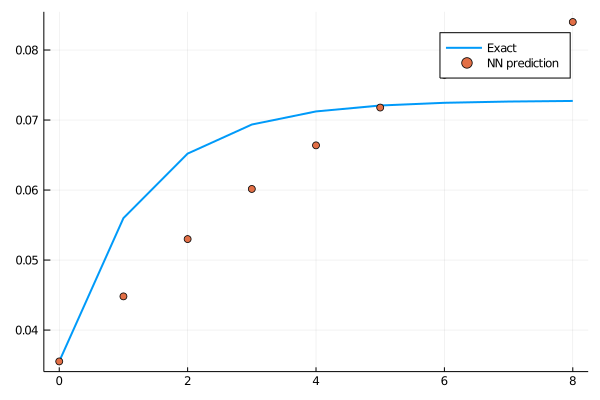

loss: 0.0038:  20%|████████▍                                |  ETA: 0:02:55

0.00374529f0

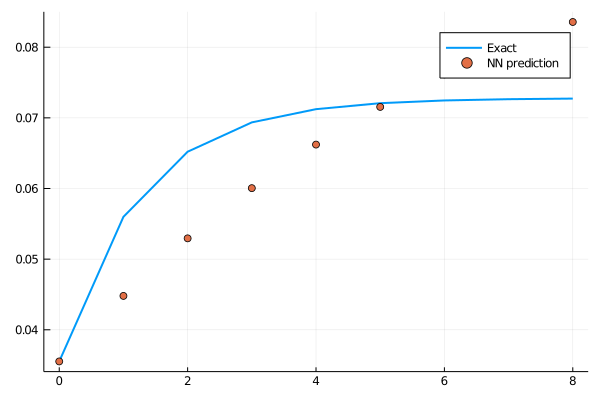

loss: 0.00375:  21%|████████▌                                |  ETA: 0:02:53

0.0036706205f0

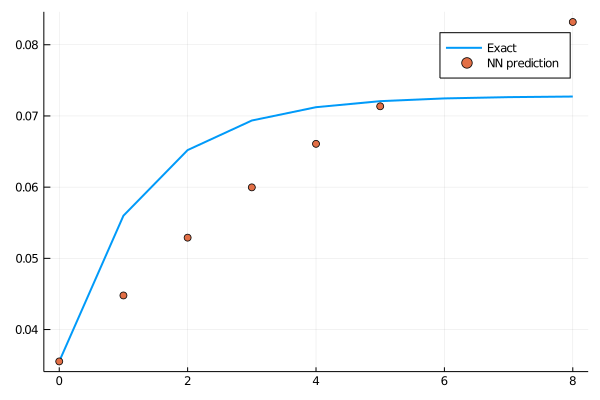

loss: 0.00367:  21%|████████▋                                |  ETA: 0:02:49

0.003587913f0

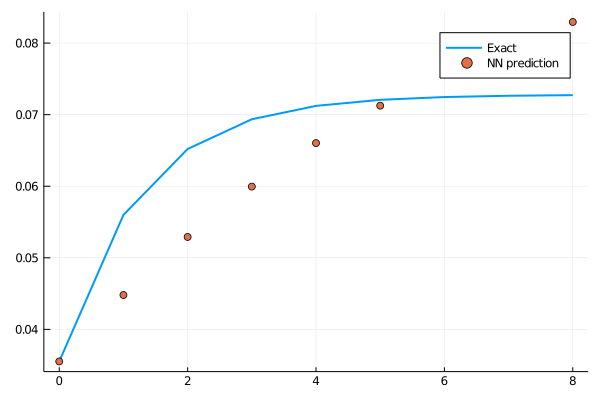

loss: 0.00359:  21%|████████▊                                |  ETA: 0:02:47

0.0035159036f0

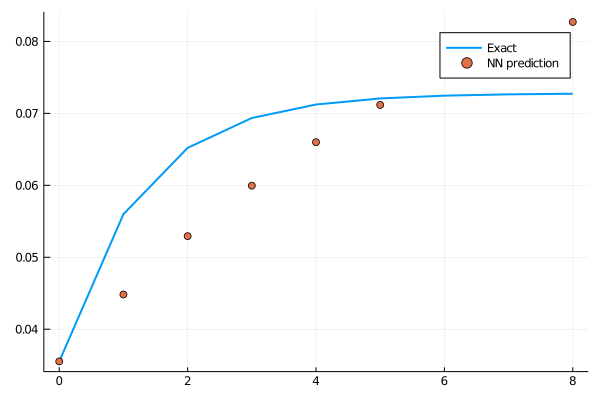

loss: 0.00352:  22%|████████▉                                |  ETA: 0:02:44

0.0034586156f0

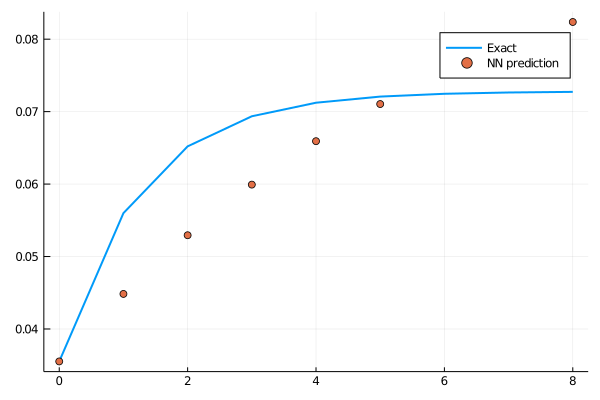

loss: 0.00346:  22%|█████████                                |  ETA: 0:02:41

0.0034100728f0

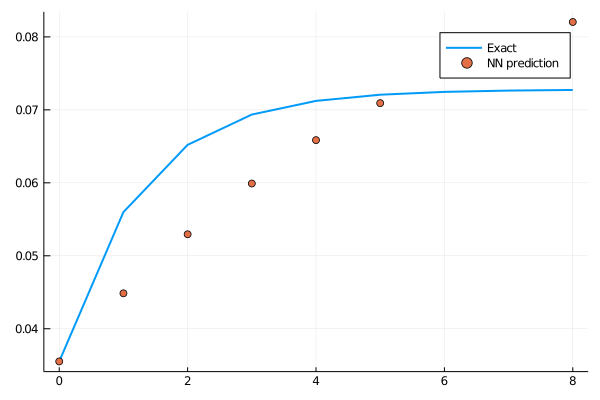

loss: 0.00341:  22%|█████████▏                               |  ETA: 0:02:39

0.0033623104f0

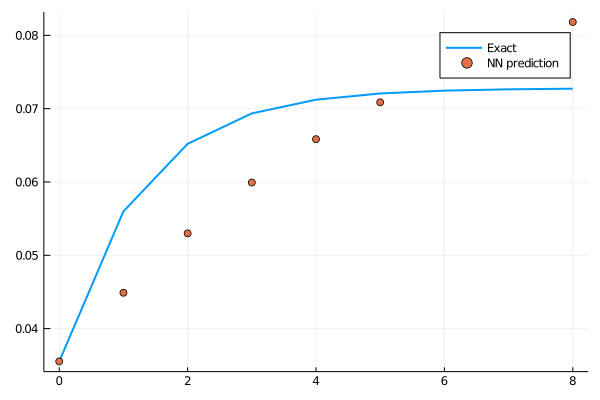

loss: 0.00336:  23%|█████████▎                               |  ETA: 0:02:37

0.003302697f0

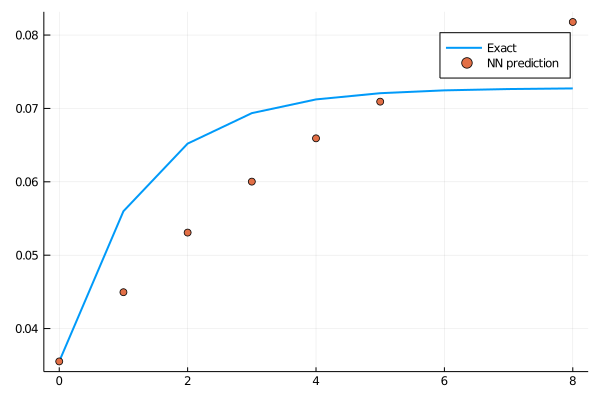

loss: 0.0033:  23%|█████████▍                               |  ETA: 0:02:33

0.0032302844f0

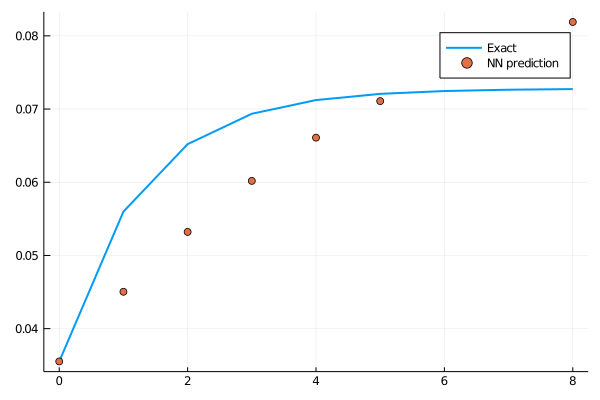

loss: 0.00323:  23%|█████████▌                               |  ETA: 0:02:31

0.003159905f0

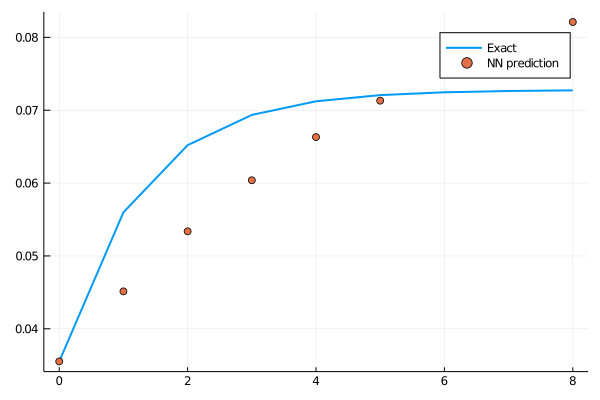

loss: 0.00316:  24%|█████████▋                               |  ETA: 0:02:29

0.0031028292f0

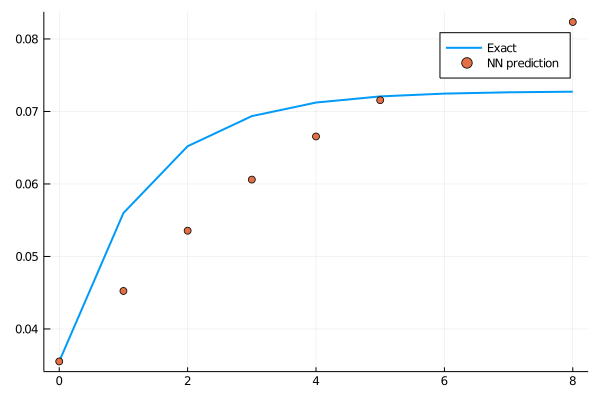

loss: 0.0031:  24%|█████████▉                               |  ETA: 0:02:27

0.0030553292f0

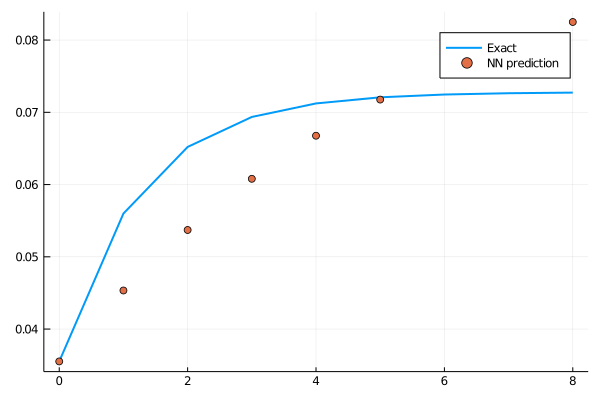

loss: 0.00306:  24%|██████████                               |  ETA: 0:02:25

0.0030066376f0

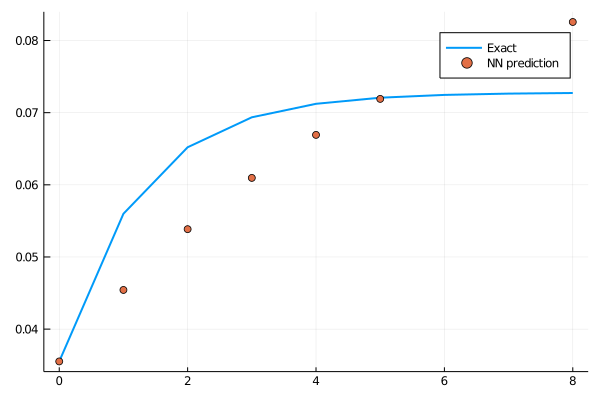

loss: 0.00301:  25%|██████████▏                              |  ETA: 0:02:23

0.0029493633f0

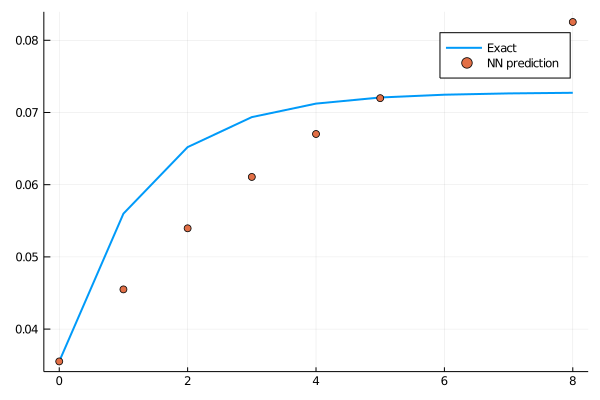

loss: 0.00295:  25%|██████████▎                              |  ETA: 0:02:20

0.0028880143f0

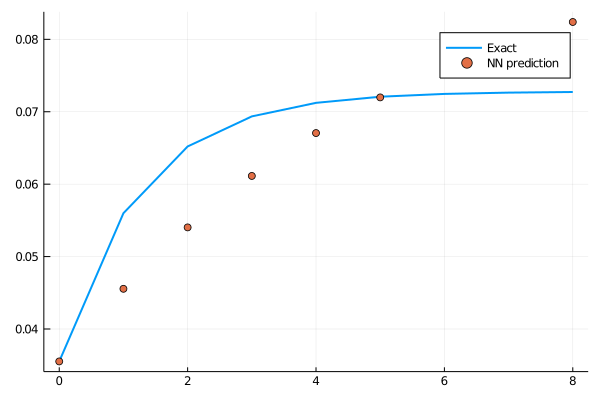

loss: 0.00289:  25%|██████████▍                              |  ETA: 0:02:18

0.0028297997f0

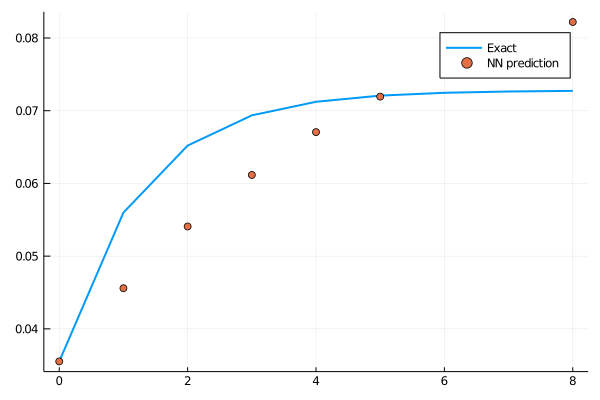

loss: 0.00283:  26%|██████████▌                              |  ETA: 0:02:17

0.0027758216f0

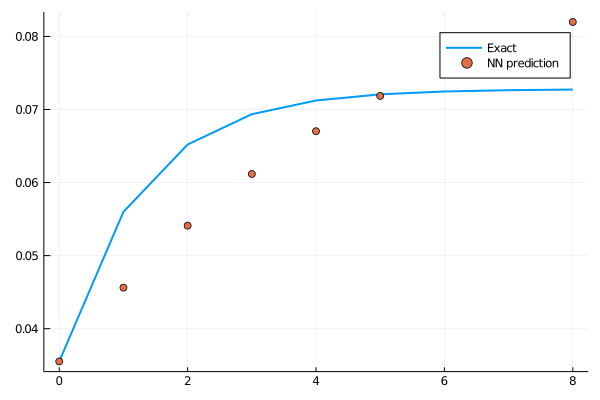

loss: 0.00278:  26%|██████████▋                              |  ETA: 0:02:14

0.0027248373f0

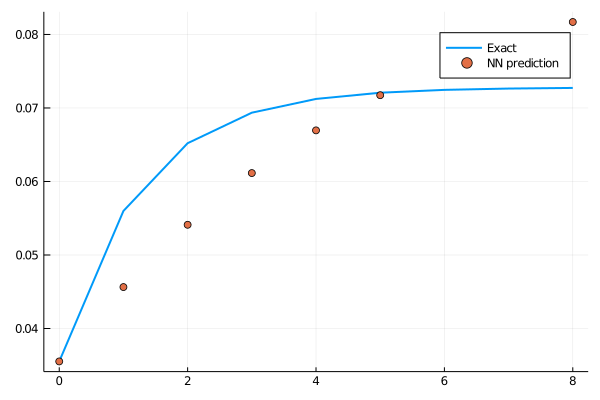

loss: 0.00272:  26%|██████████▊                              |  ETA: 0:02:13

0.0026749936f0

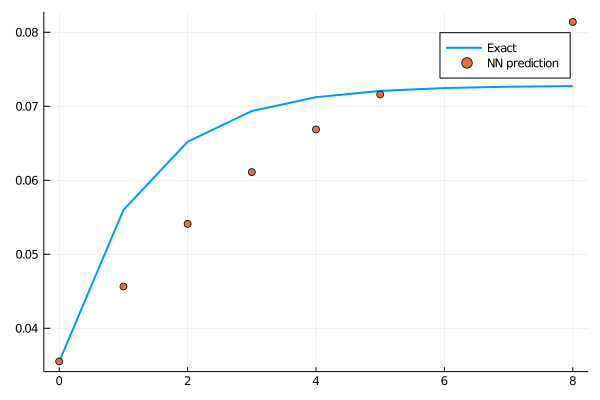

loss: 0.00267:  27%|██████████▉                              |  ETA: 0:02:11

0.0026247913f0

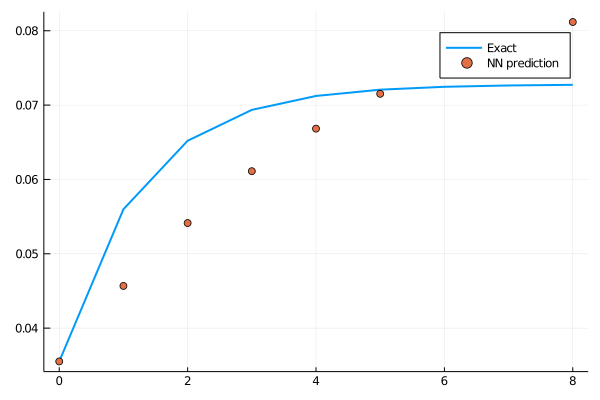

loss: 0.00262:  27%|███████████▏                             |  ETA: 0:02:09

0.0025726426f0

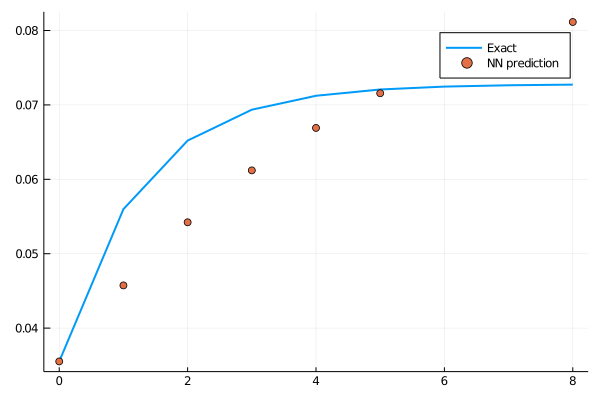

loss: 0.00257:  27%|███████████▎                             |  ETA: 0:02:07

0.0025196027f0

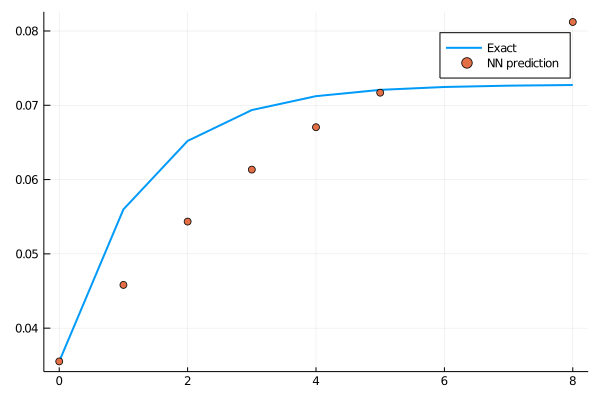

loss: 0.00252:  28%|███████████▍                             |  ETA: 0:02:06

0.0024686428f0

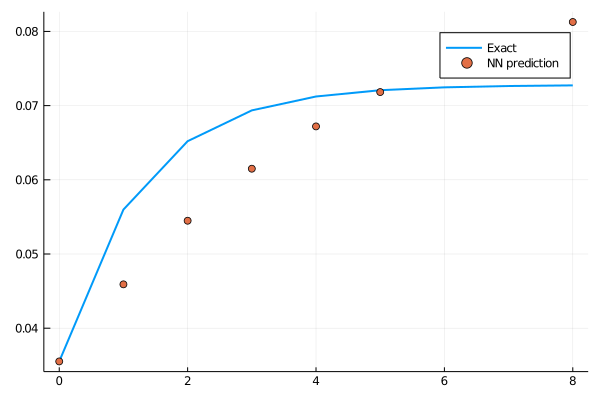

loss: 0.00247:  28%|███████████▌                             |  ETA: 0:02:04

0.002420683f0

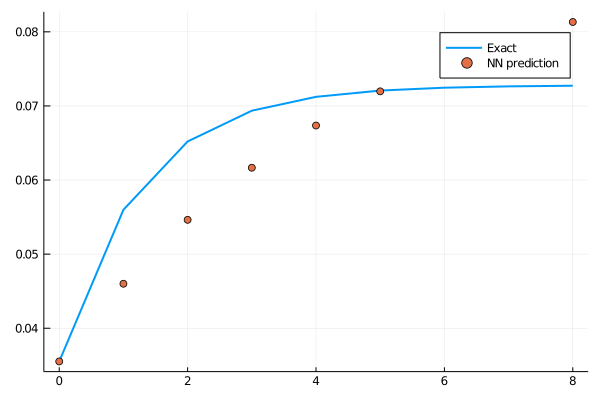

loss: 0.00242:  28%|███████████▋                             |  ETA: 0:02:02

0.0023736232f0

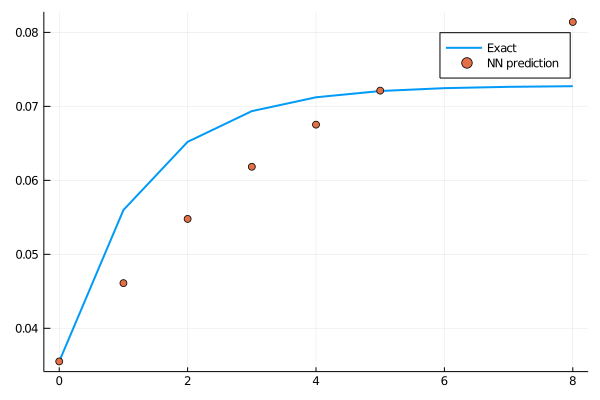

loss: 0.00237:  29%|███████████▊                             |  ETA: 0:02:01

0.0023266457f0

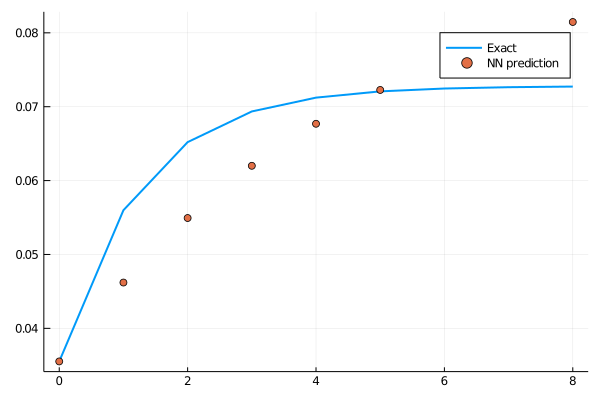

loss: 0.00233:  29%|███████████▉                             |  ETA: 0:01:59

0.0022800607f0

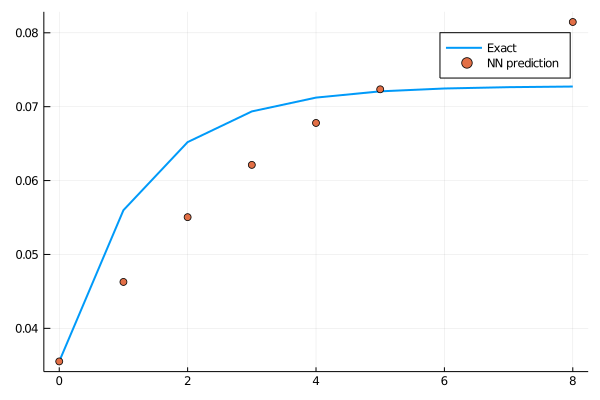

loss: 0.00228:  29%|████████████                             |  ETA: 0:01:57

0.0022333378f0

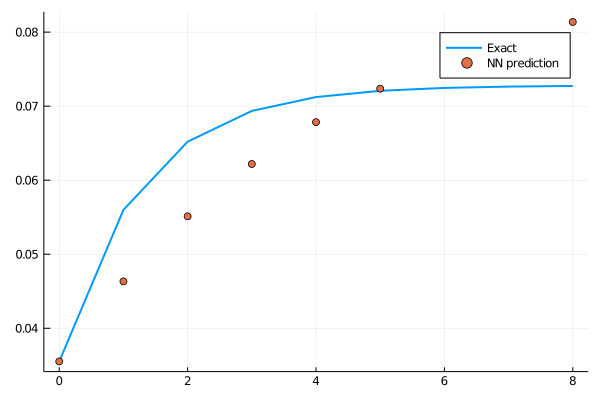

loss: 0.00223:  30%|████████████▏                            |  ETA: 0:01:56

0.002186618f0

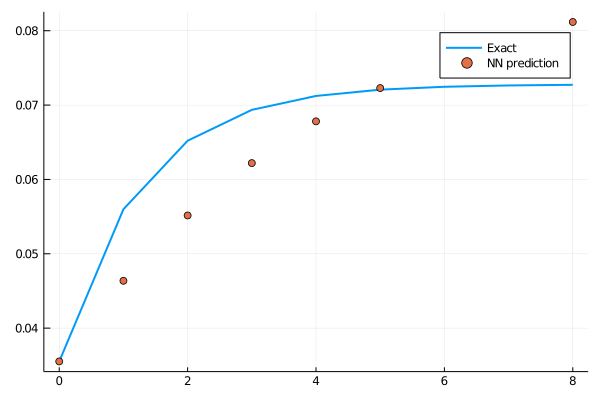

loss: 0.00219:  30%|████████████▎                            |  ETA: 0:01:54

0.0021413334f0

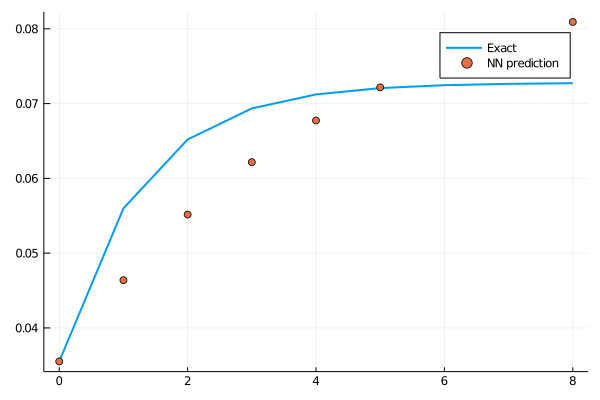

loss: 0.00214:  30%|████████████▍                            |  ETA: 0:01:53

0.0020982248f0

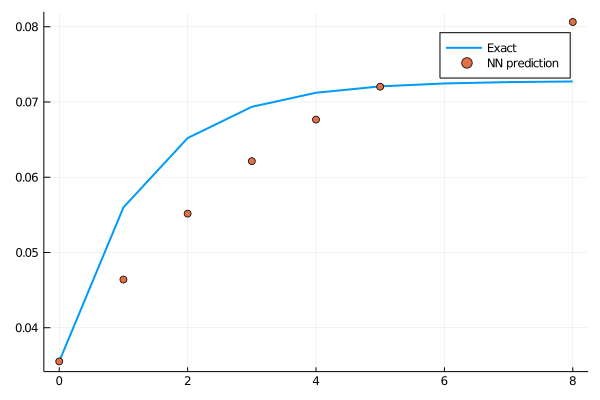

loss: 0.0021:  31%|████████████▌                            |  ETA: 0:01:52

0.0020562822f0

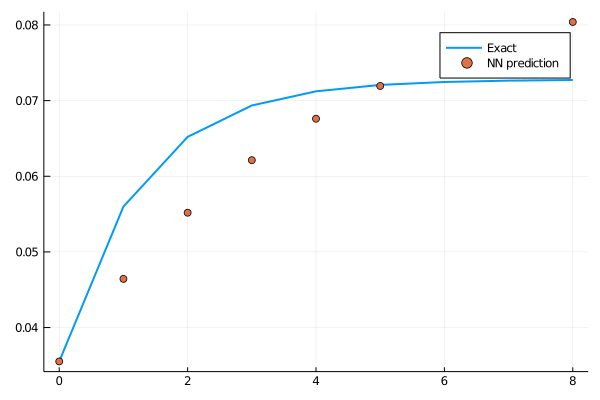

loss: 0.00206:  31%|████████████▊                            |  ETA: 0:01:50

0.0020139958f0

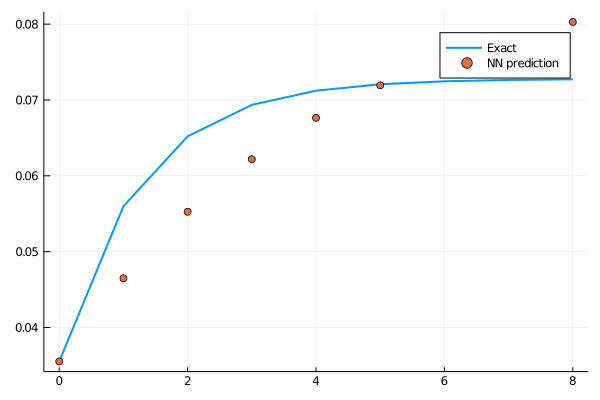

loss: 0.00201:  31%|████████████▉                            |  ETA: 0:01:49

0.0019711195f0

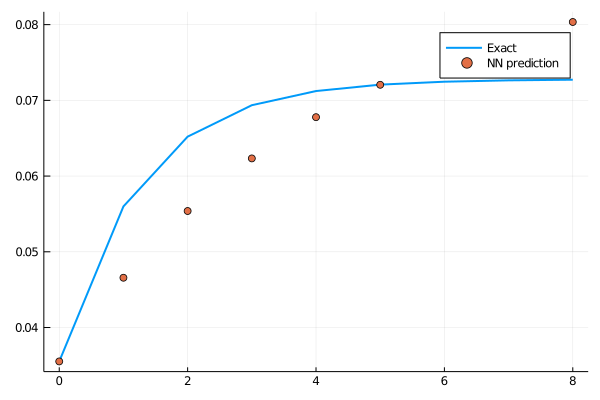

loss: 0.00197:  32%|█████████████                            |  ETA: 0:01:47

0.0019291266f0

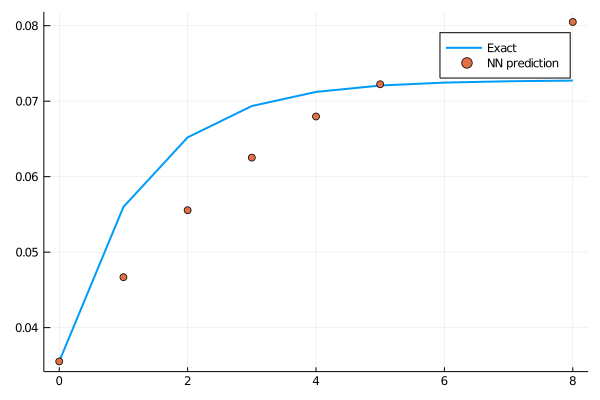

loss: 0.00193:  32%|█████████████▏                           |  ETA: 0:01:46

0.0018887882f0

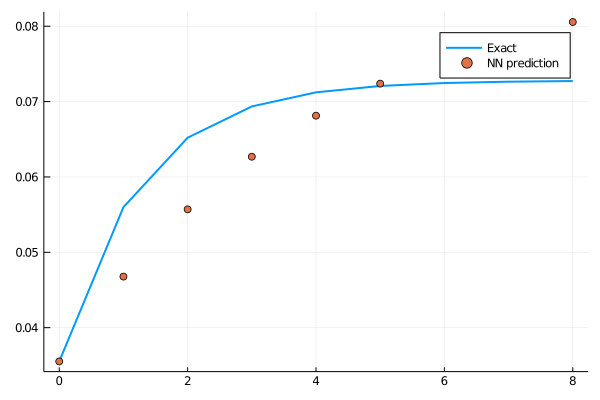

loss: 0.00189:  32%|█████████████▎                           |  ETA: 0:01:45

0.0018496678f0

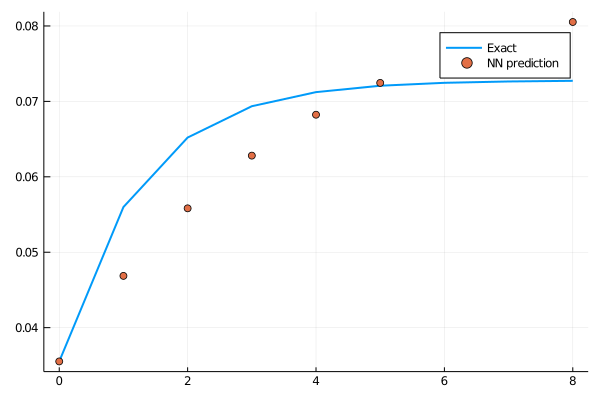

loss: 0.00185:  33%|█████████████▍                           |  ETA: 0:01:44

0.0018112004f0

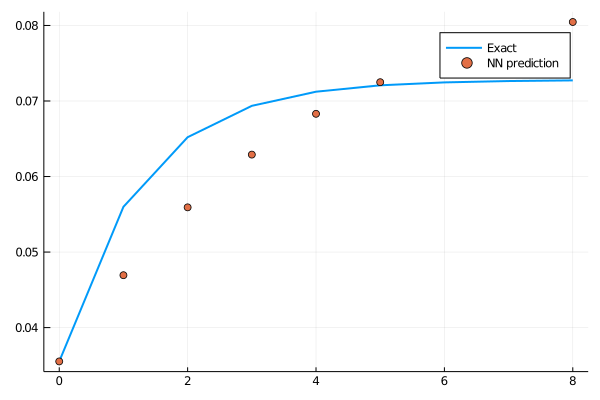

loss: 0.00181:  33%|█████████████▌                           |  ETA: 0:01:42

0.0017729054f0

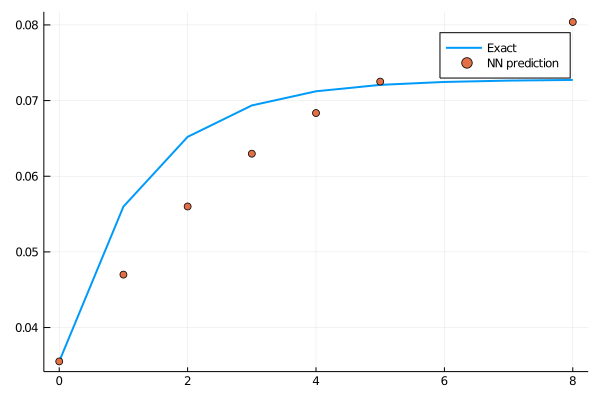

loss: 0.00177:  33%|█████████████▋                           |  ETA: 0:01:41

0.0017348324f0

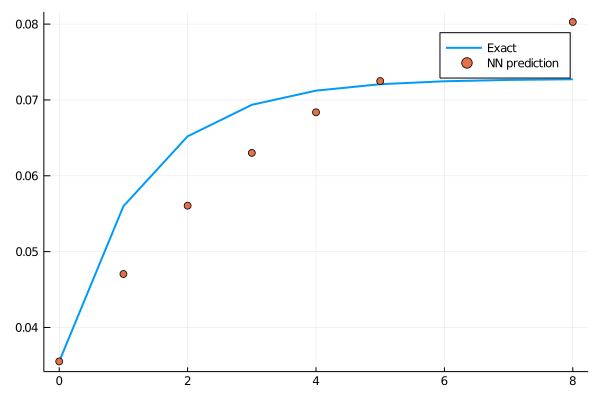

loss: 0.00173:  34%|█████████████▊                           |  ETA: 0:01:40

0.0016974638f0

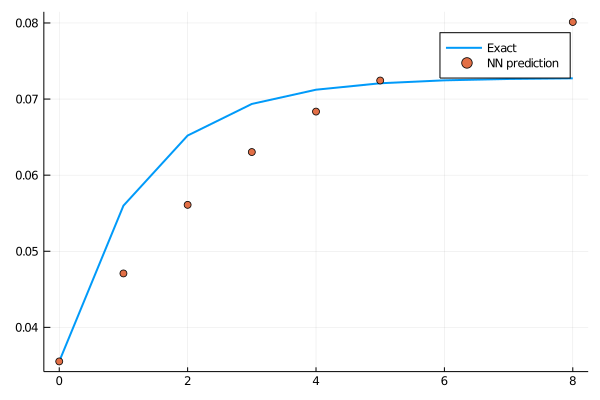

loss: 0.0017:  34%|██████████████                           |  ETA: 0:01:38

0.0016612932f0

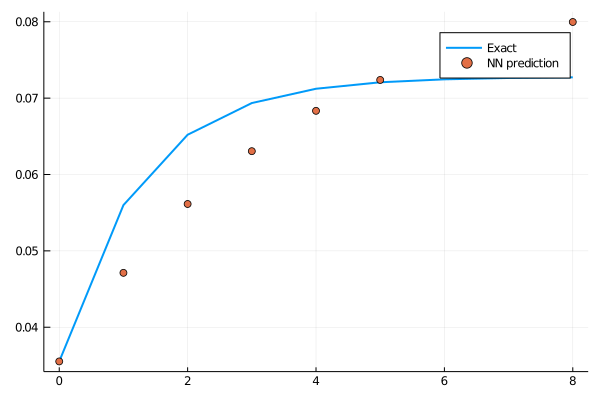

loss: 0.00166:  34%|██████████████▏                          |  ETA: 0:01:37

0.0016262134f0

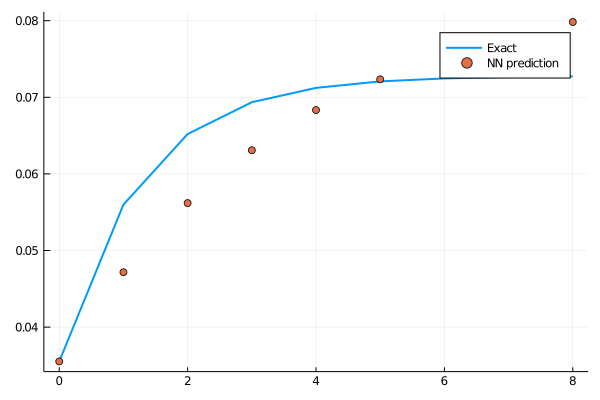

loss: 0.00163:  35%|██████████████▏                          |  ETA: 0:01:36

0.0015915768f0

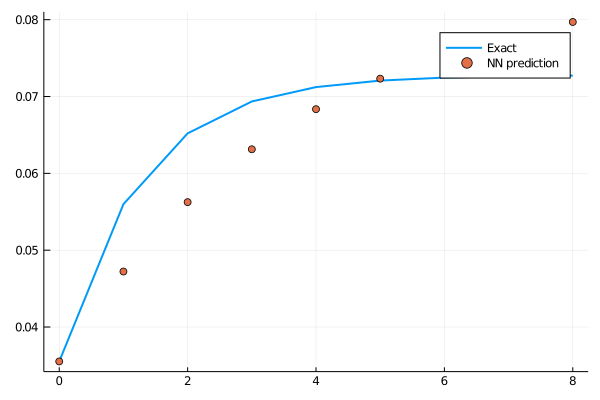

loss: 0.00159:  35%|██████████████▍                          |  ETA: 0:01:35

0.0015572186f0

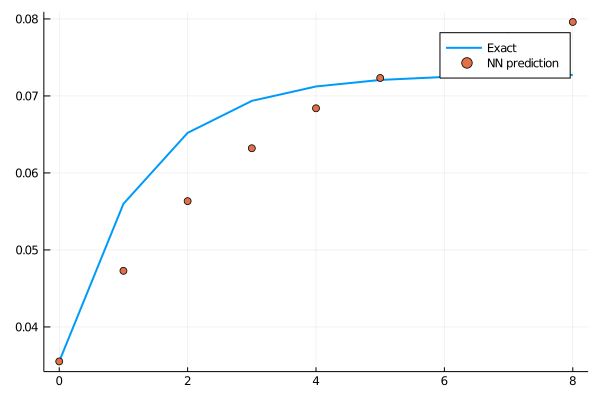

loss: 0.00156:  35%|██████████████▌                          |  ETA: 0:01:34

0.0015234777f0

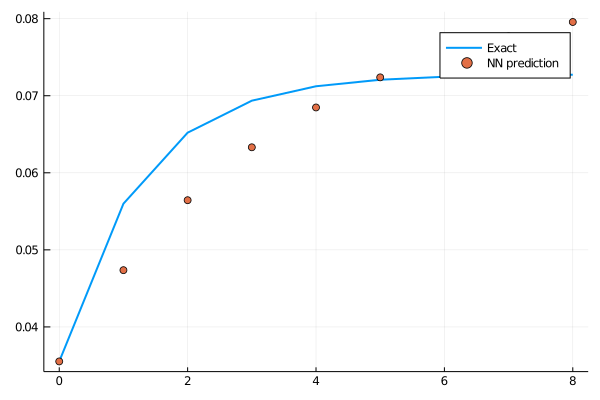

loss: 0.00152:  36%|██████████████▋                          |  ETA: 0:01:33

0.0014905029f0

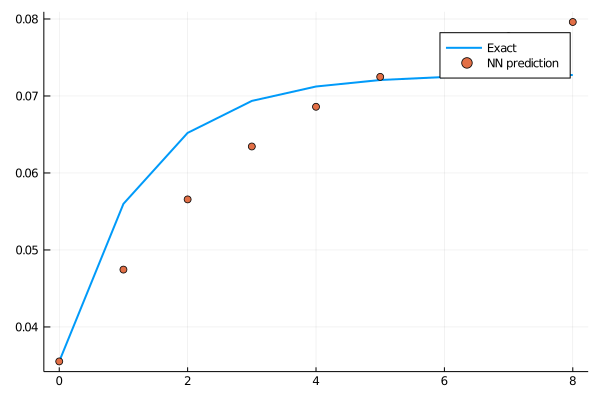

loss: 0.00149:  36%|██████████████▊                          |  ETA: 0:01:32

0.001458316f0

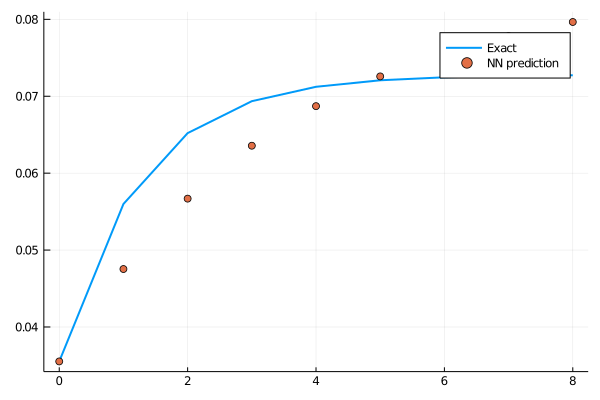

loss: 0.00146:  36%|██████████████▉                          |  ETA: 0:01:31

0.0014268804f0

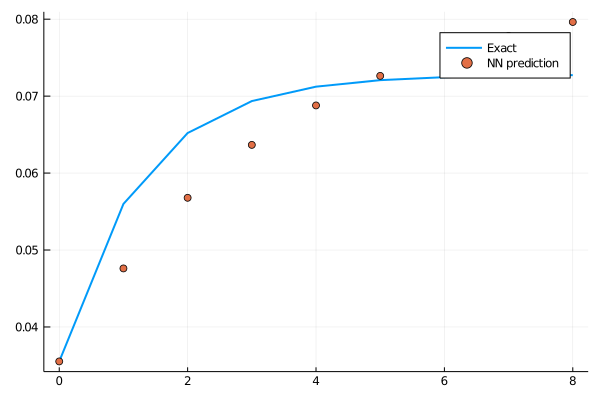

loss: 0.00143:  37%|███████████████                          |  ETA: 0:01:30

0.001396011f0

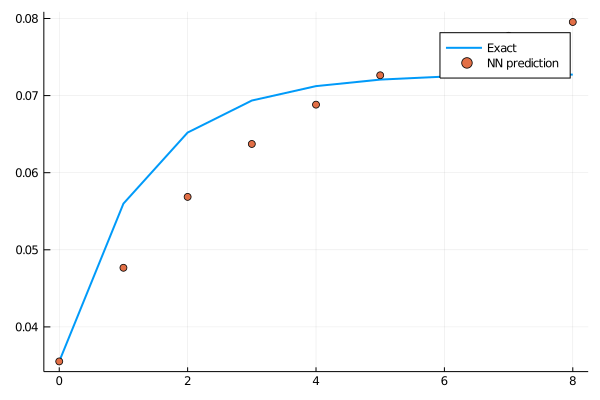

loss: 0.0014:  37%|███████████████▏                         |  ETA: 0:01:29

0.0013656963f0

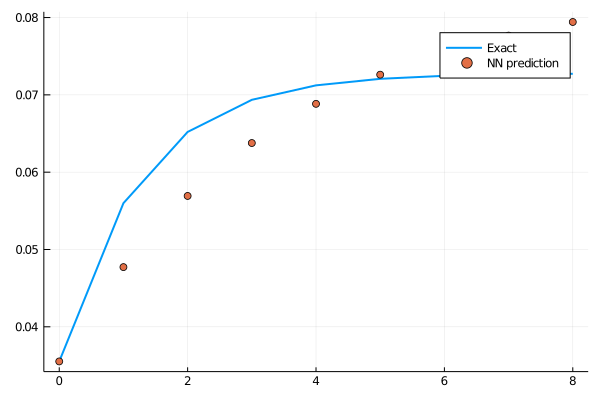

loss: 0.00137:  37%|███████████████▎                         |  ETA: 0:01:28

0.001335926f0

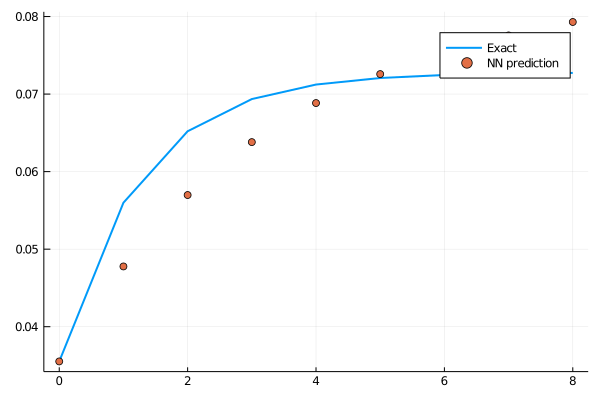

loss: 0.00134:  38%|███████████████▍                         |  ETA: 0:01:27

0.0013067316f0

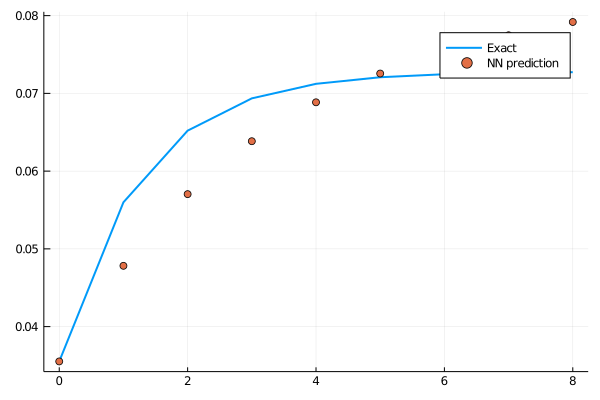

loss: 0.00131:  38%|███████████████▋                         |  ETA: 0:01:26

0.0012782618f0

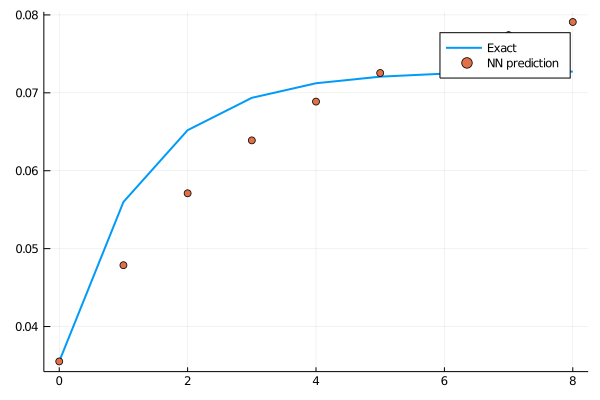

loss: 0.00128:  38%|███████████████▊                         |  ETA: 0:01:25

0.0012504859f0

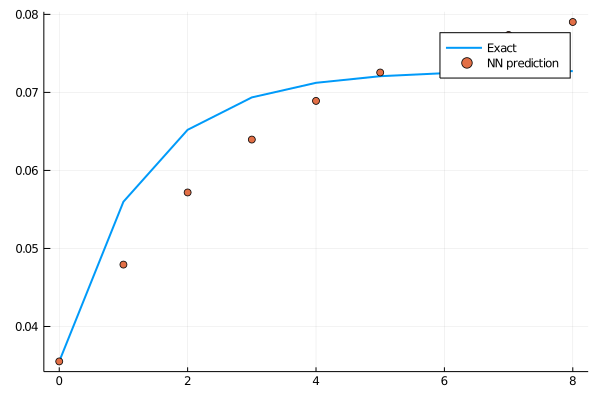

loss: 0.00125:  39%|███████████████▉                         |  ETA: 0:01:24

0.0012232616f0

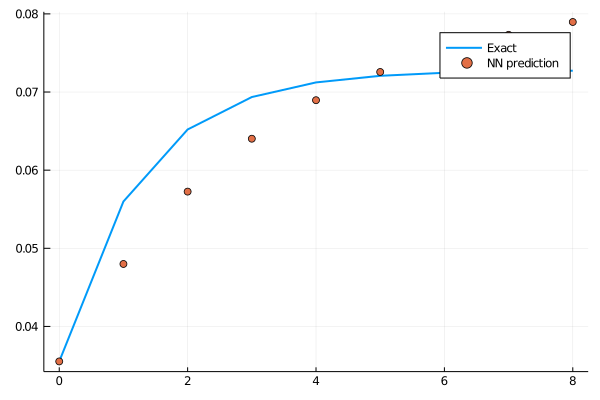

loss: 0.00122:  39%|████████████████                         |  ETA: 0:01:23

0.0011965157f0

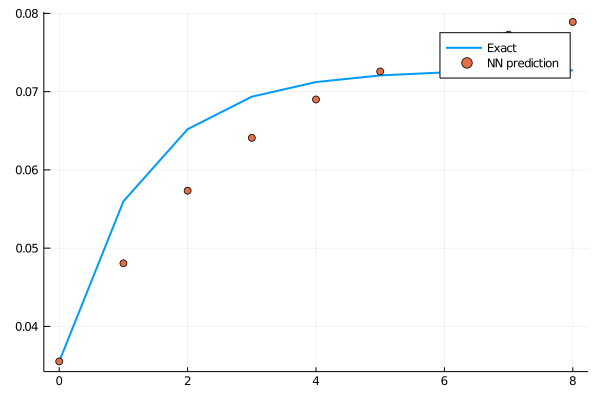

loss: 0.0012:  39%|████████████████▏                        |  ETA: 0:01:22

0.001170272f0

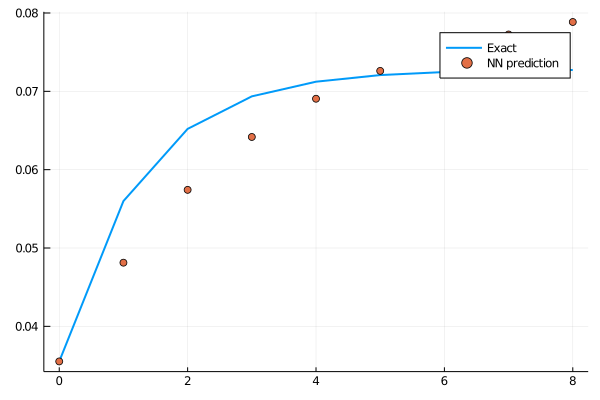

loss: 0.00117:  40%|████████████████▎                        |  ETA: 0:01:21

0.0011446362f0

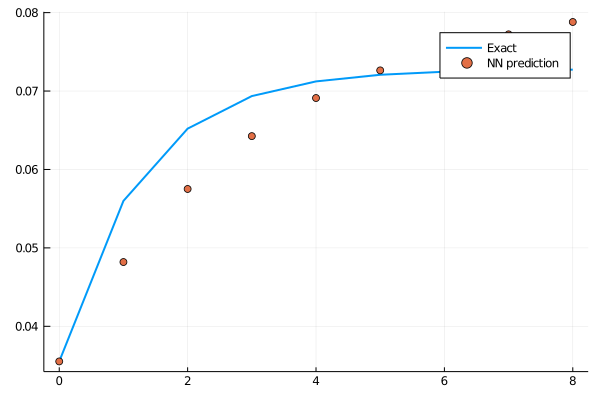

loss: 0.00114:  40%|████████████████▍                        |  ETA: 0:01:20

0.0011196256f0

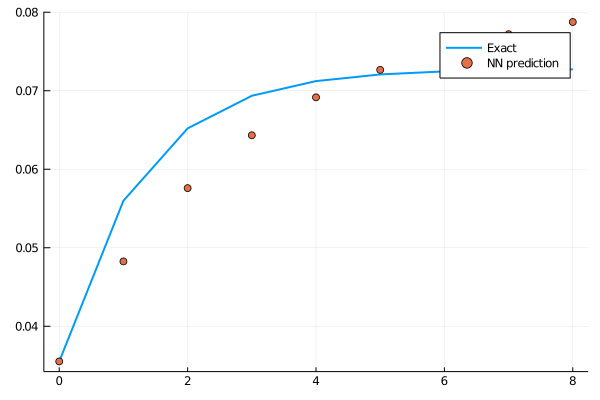

loss: 0.00112:  40%|████████████████▌                        |  ETA: 0:01:19

0.001095181f0

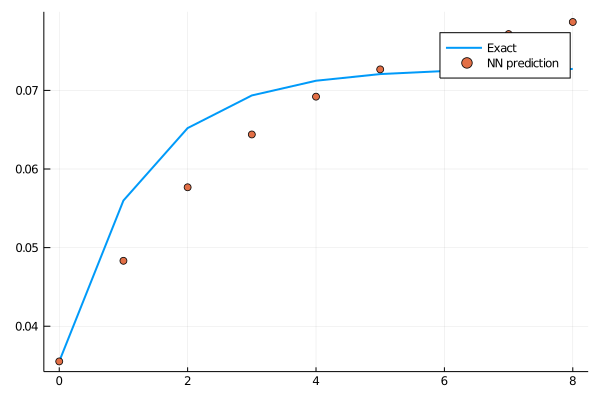

loss: 0.0011:  41%|████████████████▋                        |  ETA: 0:01:19

0.0010712369f0

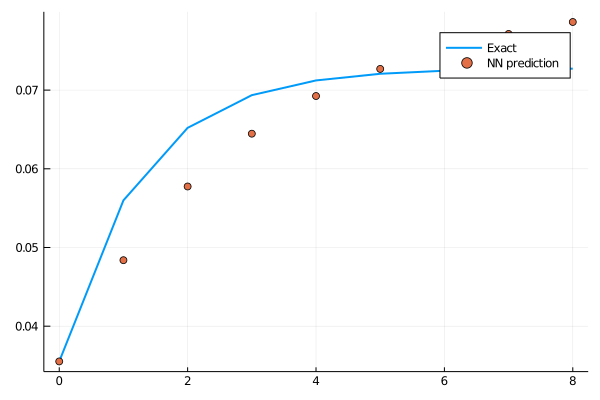

loss: 0.00107:  41%|████████████████▊                        |  ETA: 0:01:18

0.001047753f0

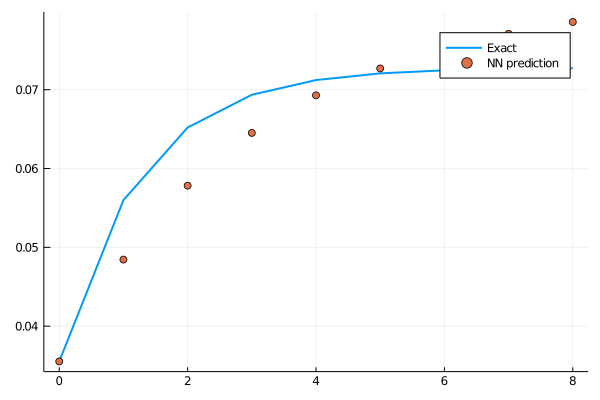

loss: 0.00105:  41%|████████████████▉                        |  ETA: 0:01:17

0.0010247569f0

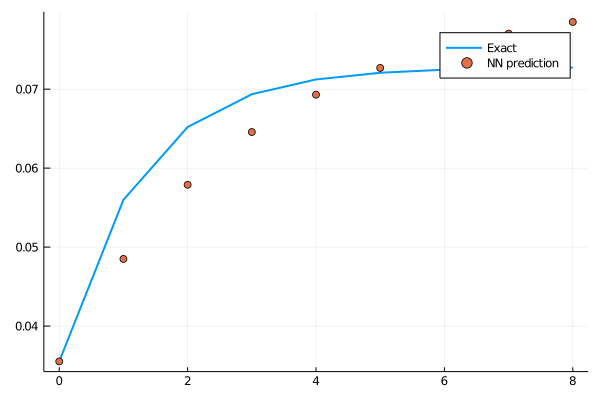

loss: 0.00102:  42%|█████████████████                        |  ETA: 0:01:16

0.0010023162f0

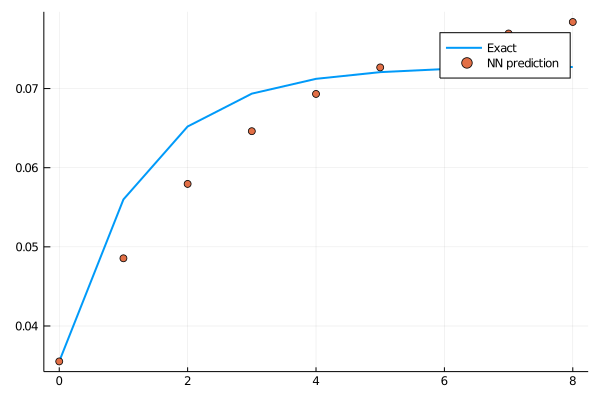

loss: 0.001:  42%|█████████████████▎                       |  ETA: 0:01:15

0.0009804231f0

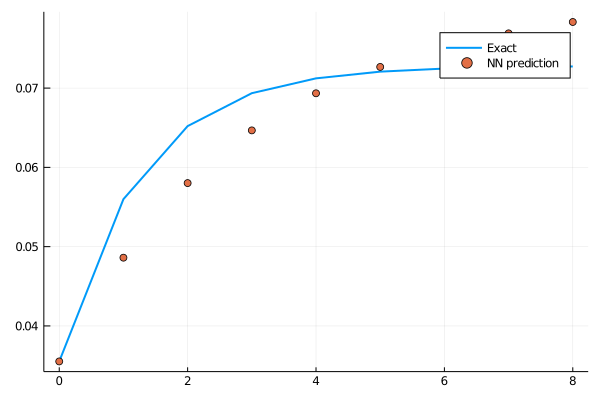

loss: 0.00098:  42%|█████████████████▍                       |  ETA: 0:01:14

0.0009589899f0

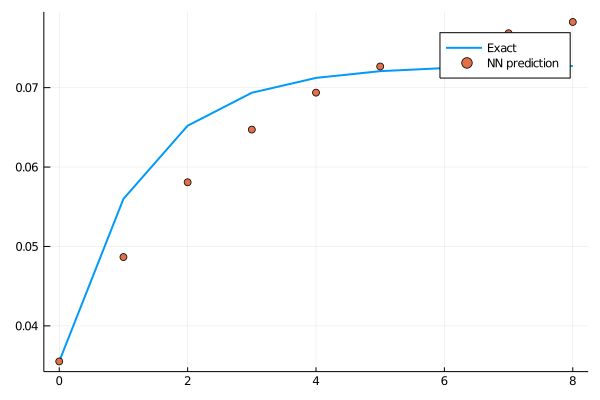

loss: 0.000959:  43%|█████████████████▌                       |  ETA: 0:01:14

0.0009379909f0

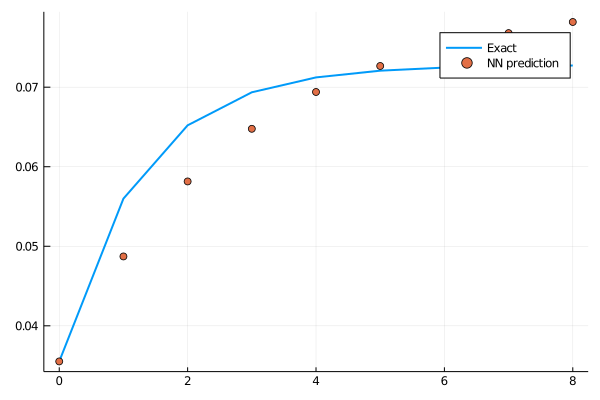

loss: 0.000938:  43%|█████████████████▋                       |  ETA: 0:01:13

0.0009174594f0

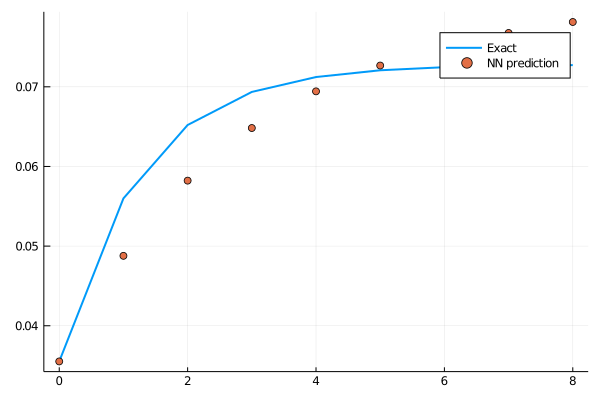

loss: 0.000917:  43%|█████████████████▊                       |  ETA: 0:01:12

0.00089739147f0

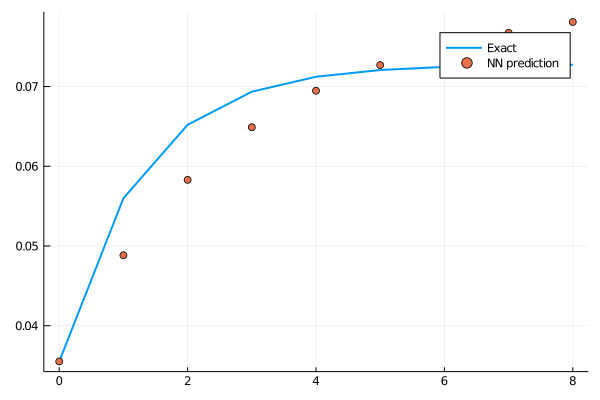

loss: 0.000897:  44%|█████████████████▉                       |  ETA: 0:01:11

0.0008777839f0

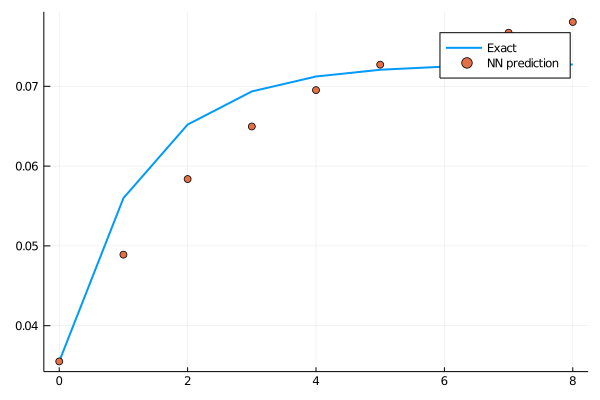

loss: 0.000878:  44%|██████████████████                       |  ETA: 0:01:10

0.00085862534f0

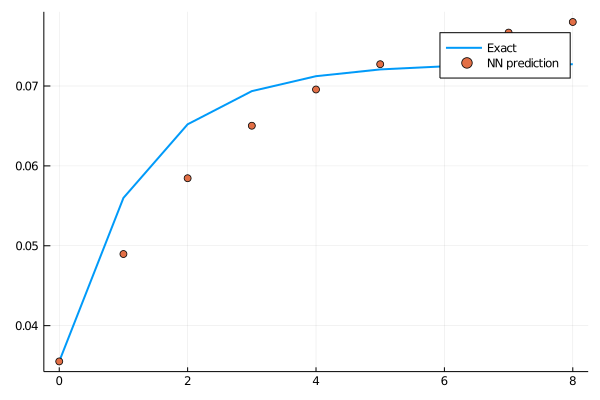

loss: 0.000859:  44%|██████████████████▏                      |  ETA: 0:01:10

0.0008398916f0

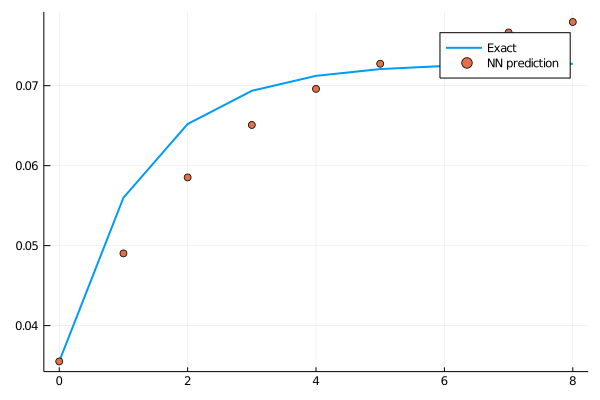

loss: 0.00084:  45%|██████████████████▎                      |  ETA: 0:01:09

0.0008215656f0

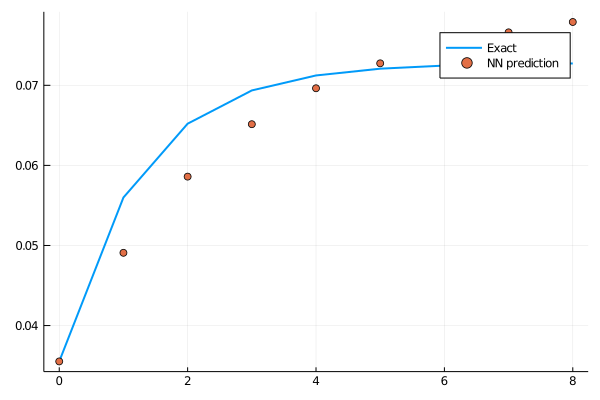

loss: 0.000822:  45%|██████████████████▌                      |  ETA: 0:01:08

0.0008036418f0

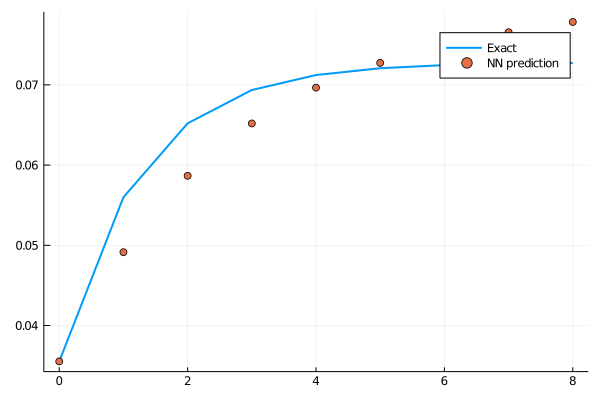

loss: 0.000804:  45%|██████████████████▋                      |  ETA: 0:01:08

0.0007861344f0

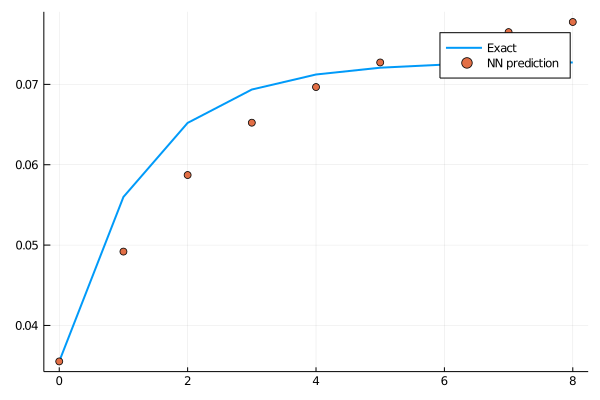

loss: 0.000786:  46%|██████████████████▊                      |  ETA: 0:01:07

0.00076902757f0

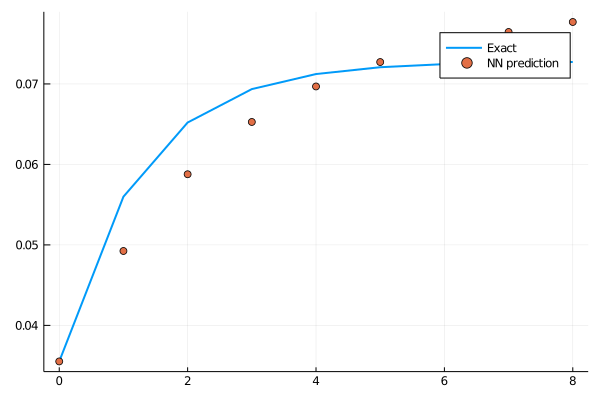

loss: 0.000769:  46%|██████████████████▉                      |  ETA: 0:01:06

0.00075230637f0

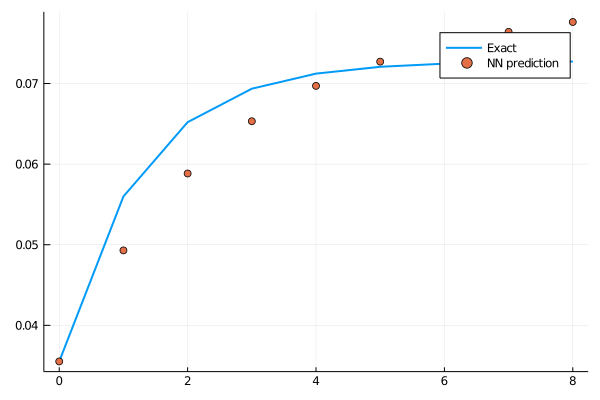

loss: 0.000752:  46%|███████████████████                      |  ETA: 0:01:05

0.0007359643f0

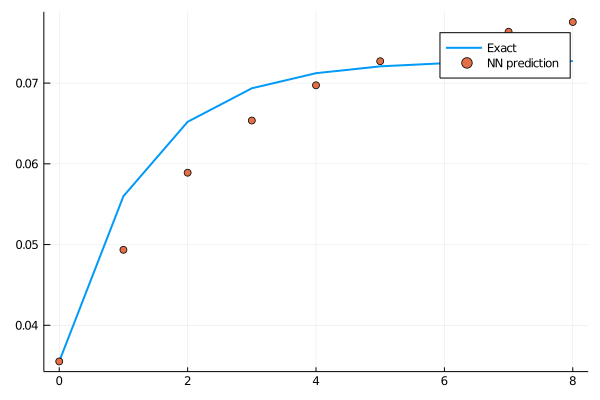

loss: 0.000736:  47%|███████████████████▏                     |  ETA: 0:01:05

0.0007199875f0

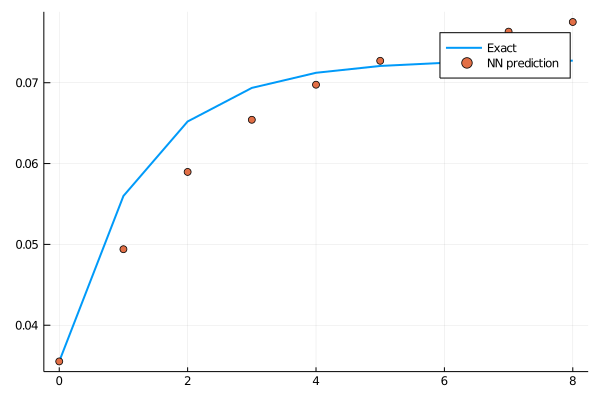

loss: 0.00072:  47%|███████████████████▎                     |  ETA: 0:01:04

0.00070436345f0

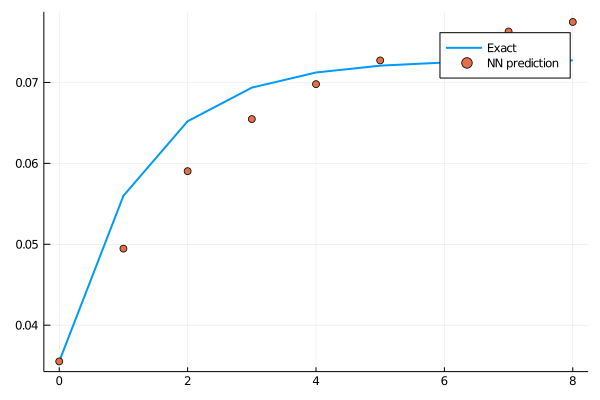

loss: 0.000704:  47%|███████████████████▍                     |  ETA: 0:01:03

0.00068909914f0

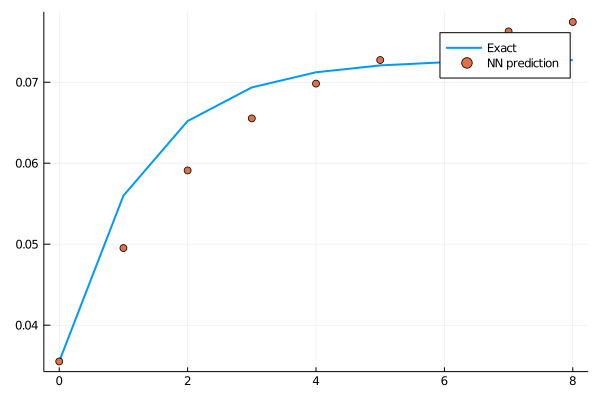

loss: 0.000689:  48%|███████████████████▌                     |  ETA: 0:01:03

0.0006741892f0

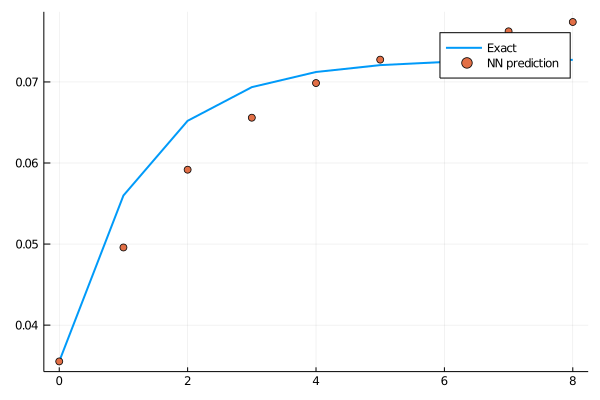

loss: 0.000674:  48%|███████████████████▋                     |  ETA: 0:01:02

0.0006596184f0

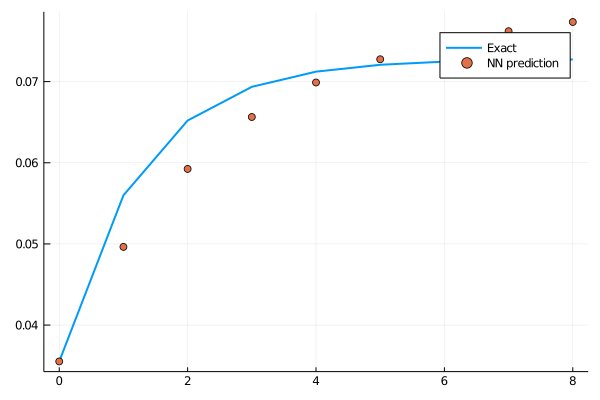

loss: 0.00066:  48%|███████████████████▊                     |  ETA: 0:01:01

0.0006453731f0

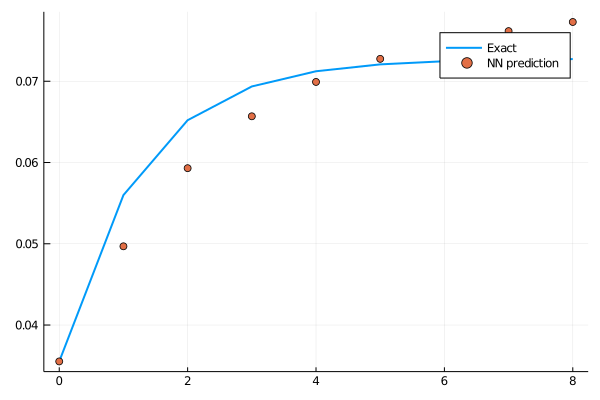

loss: 0.000645:  49%|███████████████████▉                     |  ETA: 0:01:01

0.0006314465f0

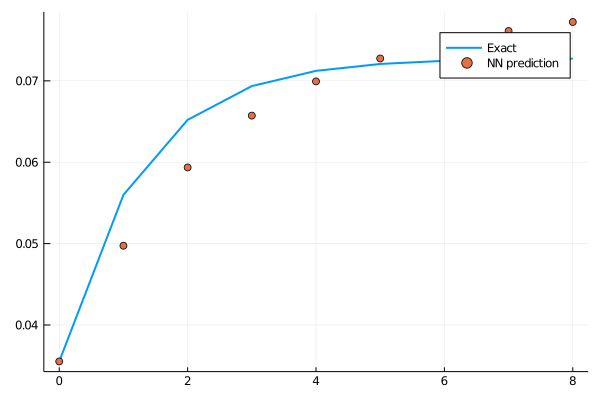

loss: 0.000631:  49%|████████████████████▏                    |  ETA: 0:01:00

0.00061783864f0

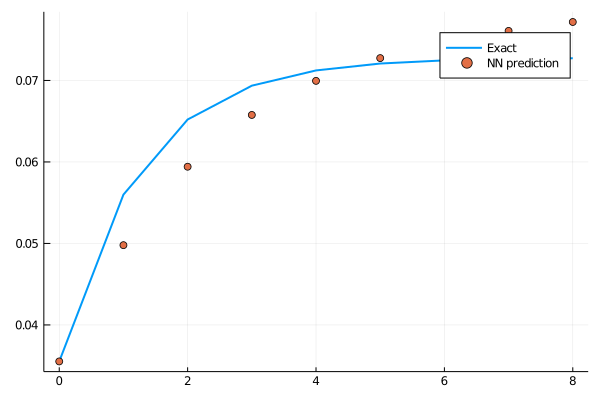

loss: 0.000618:  49%|████████████████████▎                    |  ETA: 0:01:00

0.0006045416f0

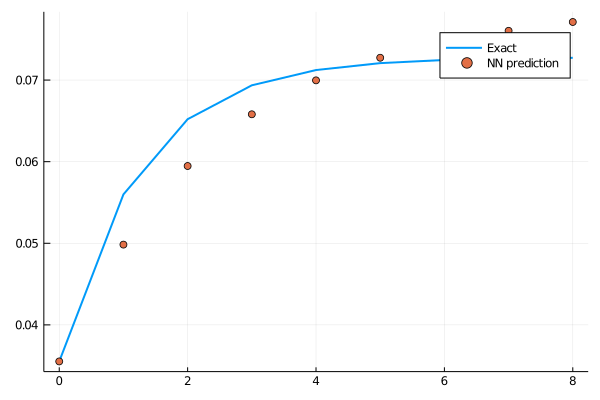

loss: 0.000605:  50%|████████████████████▍                    |  ETA: 0:00:59

0.0005915513f0

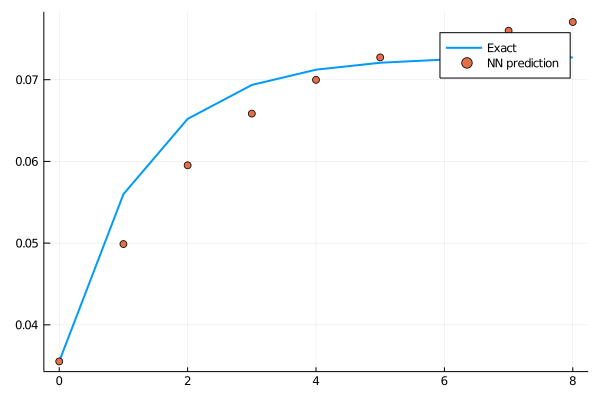

loss: 0.000592:  50%|████████████████████▌                    |  ETA: 0:00:58

0.000578851f0

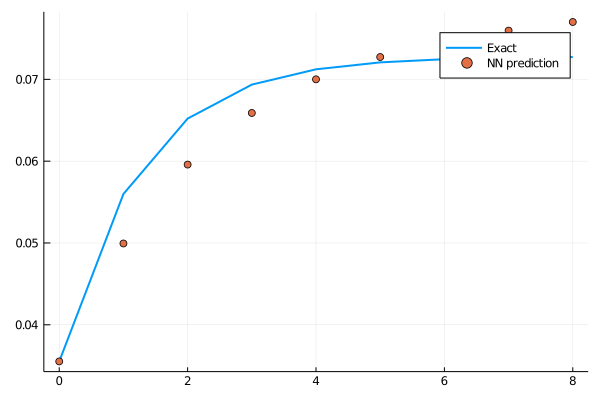

loss: 0.000579:  50%|████████████████████▋                    |  ETA: 0:00:58

0.00056643673f0

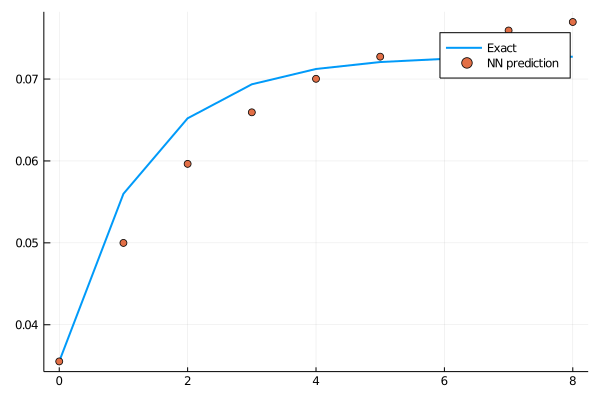

loss: 0.000566:  51%|████████████████████▊                    |  ETA: 0:00:57

0.0005543044f0

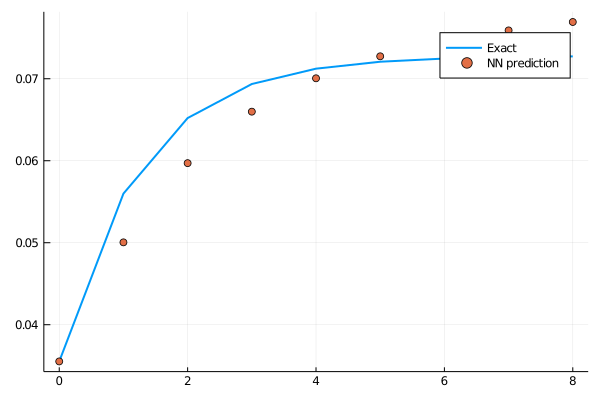

loss: 0.000554:  51%|████████████████████▉                    |  ETA: 0:00:56

0.0005424485f0

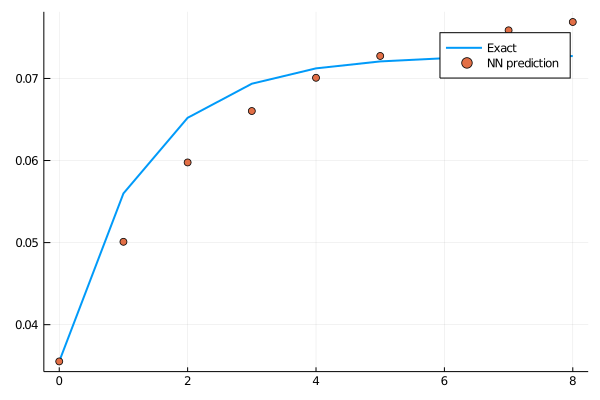

loss: 0.000542:  51%|█████████████████████                    |  ETA: 0:00:56

0.0005308639f0

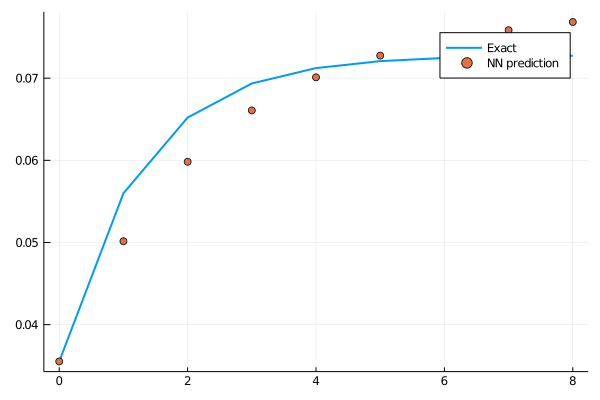

loss: 0.000531:  52%|█████████████████████▏                   |  ETA: 0:00:55

0.0005195373f0

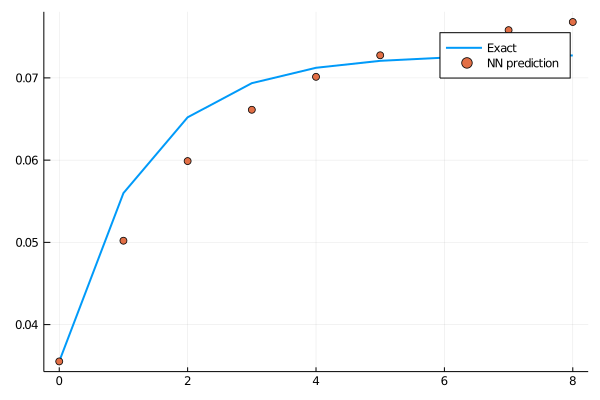

loss: 0.00052:  52%|█████████████████████▍                   |  ETA: 0:00:55

0.0005084712f0

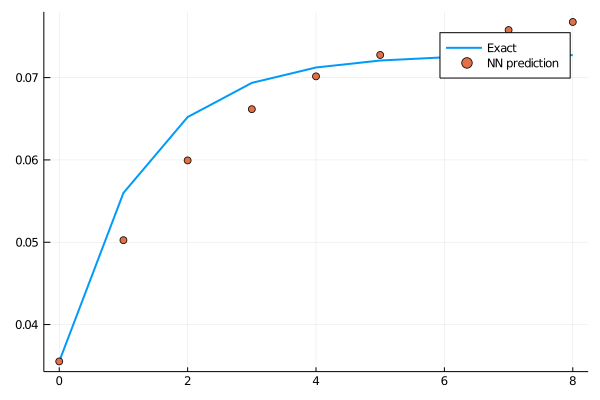

loss: 0.000508:  52%|█████████████████████▌                   |  ETA: 0:00:54

0.00049765396f0

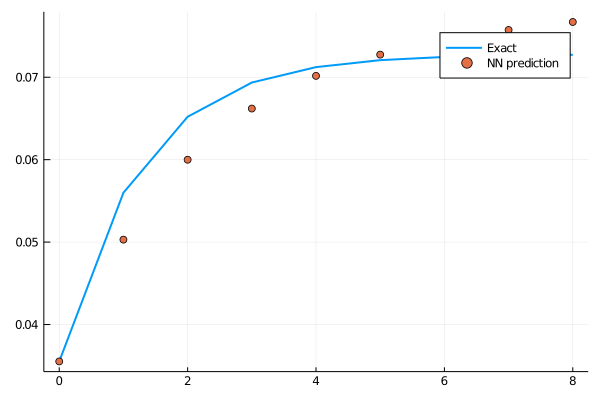

loss: 0.000498:  53%|█████████████████████▋                   |  ETA: 0:00:54

0.00048707903f0

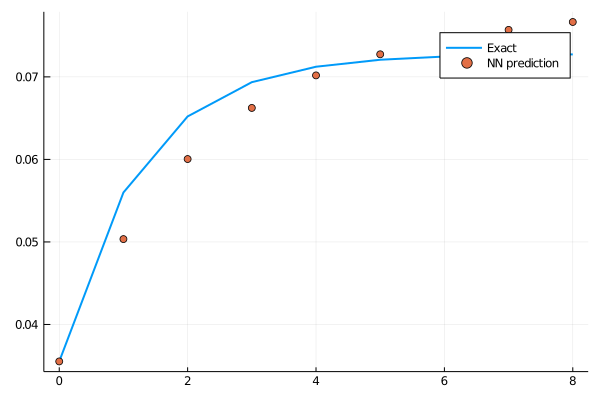

loss: 0.000487:  53%|█████████████████████▊                   |  ETA: 0:00:53

0.00047674443f0

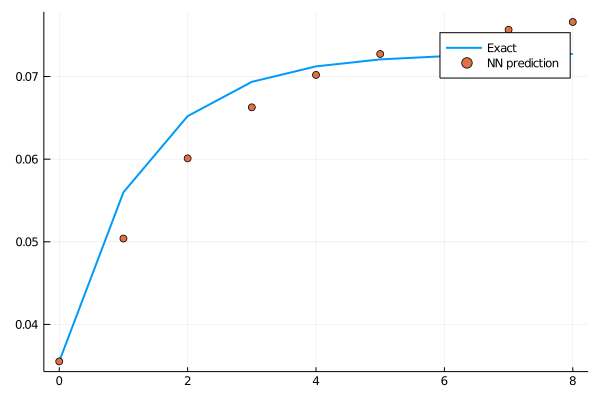

loss: 0.000477:  53%|█████████████████████▉                   |  ETA: 0:00:52

0.00046664482f0

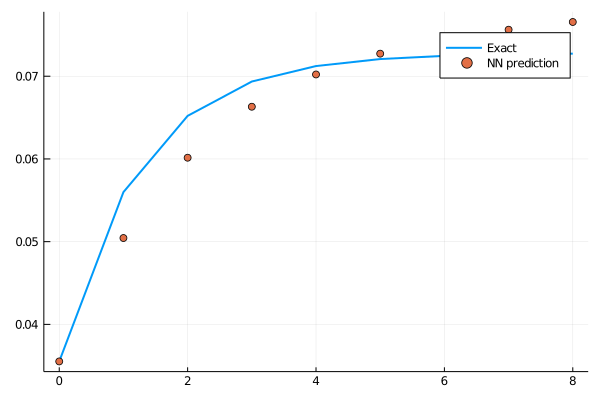

loss: 0.000467:  54%|██████████████████████                   |  ETA: 0:00:52

0.00045677135f0

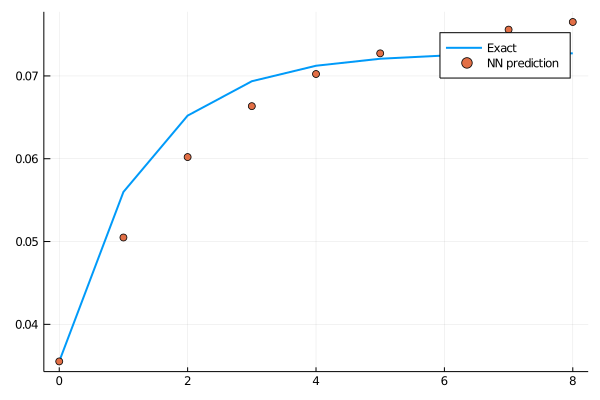

loss: 0.000457:  54%|██████████████████████▏                  |  ETA: 0:00:51

0.00044712116f0

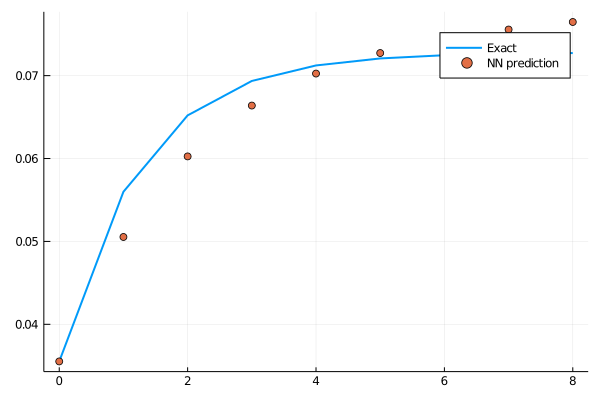

loss: 0.000447:  54%|██████████████████████▎                  |  ETA: 0:00:51

0.00043768622f0

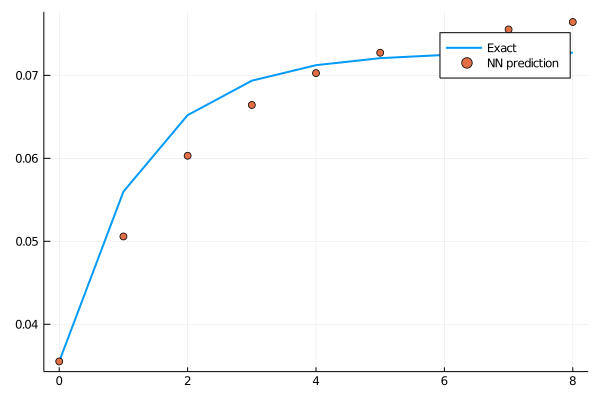

loss: 0.000438:  55%|██████████████████████▍                  |  ETA: 0:00:50

0.00042846444f0

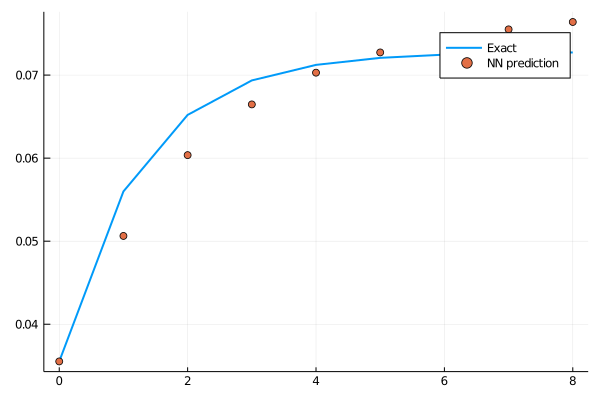

loss: 0.000428:  55%|██████████████████████▌                  |  ETA: 0:00:50

0.0004194477f0

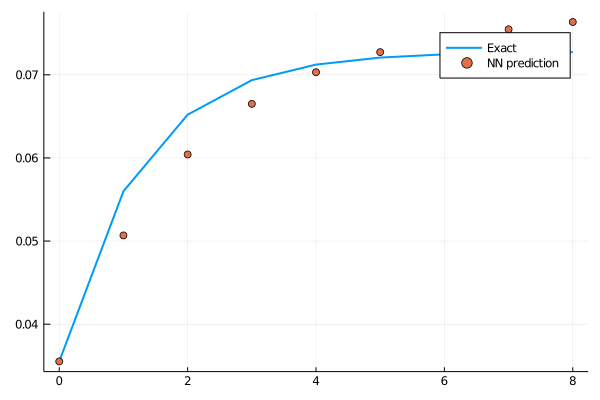

loss: 0.000419:  55%|██████████████████████▋                  |  ETA: 0:00:49

0.0004106371f0

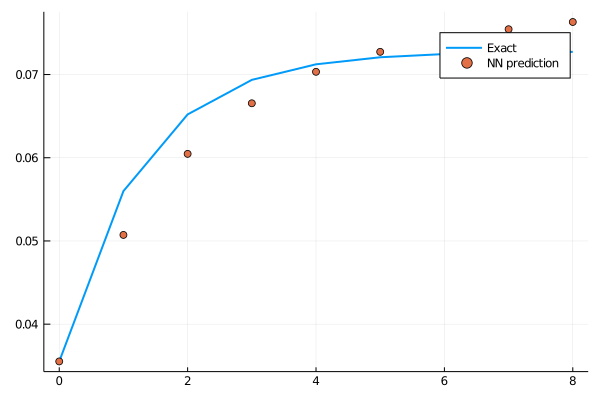

loss: 0.000411:  56%|██████████████████████▊                  |  ETA: 0:00:49

0.0004020218f0

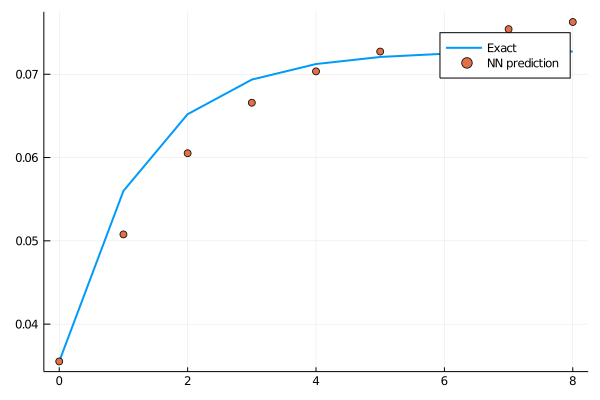

loss: 0.000402:  56%|███████████████████████                  |  ETA: 0:00:48

0.00039359787f0

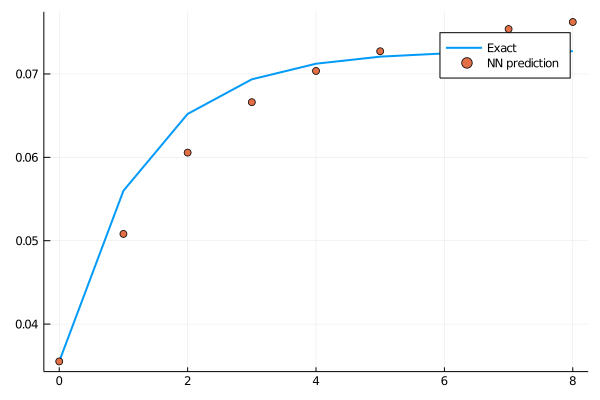

loss: 0.000394:  56%|███████████████████████▏                 |  ETA: 0:00:48

0.0003853631f0

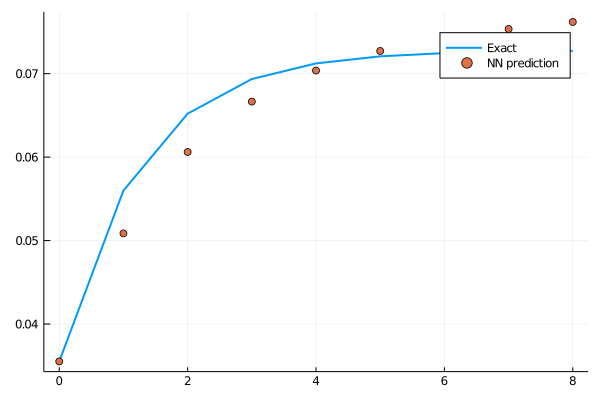

loss: 0.000385:  57%|███████████████████████▎                 |  ETA: 0:00:47

0.00037731172f0

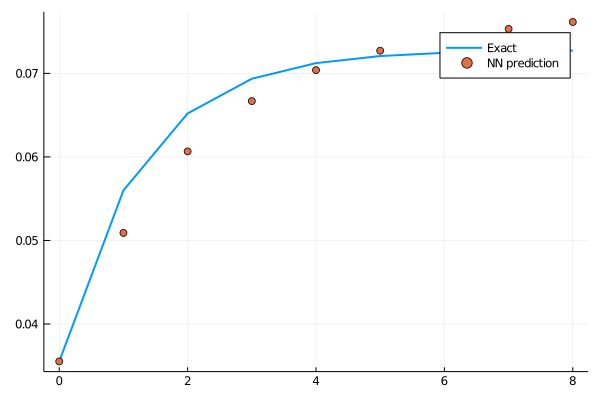

loss: 0.000377:  57%|███████████████████████▍                 |  ETA: 0:00:47

0.0003694413f0

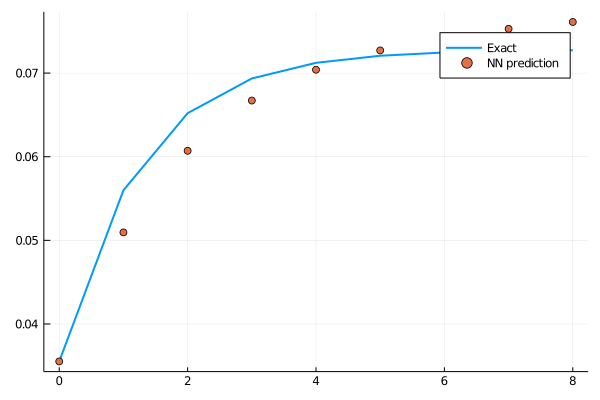

loss: 0.000369:  57%|███████████████████████▌                 |  ETA: 0:00:46

0.0003617448f0

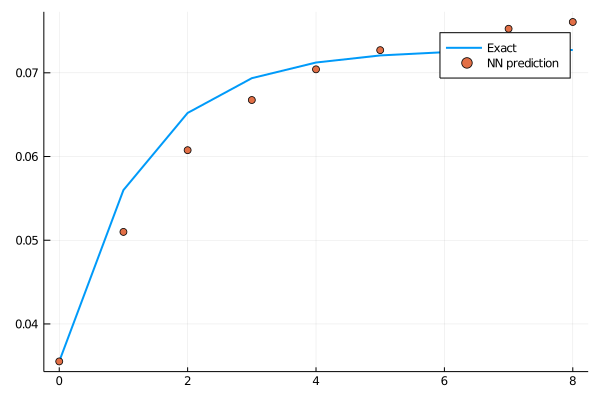

loss: 0.000362:  58%|███████████████████████▋                 |  ETA: 0:00:46

0.00035421917f0

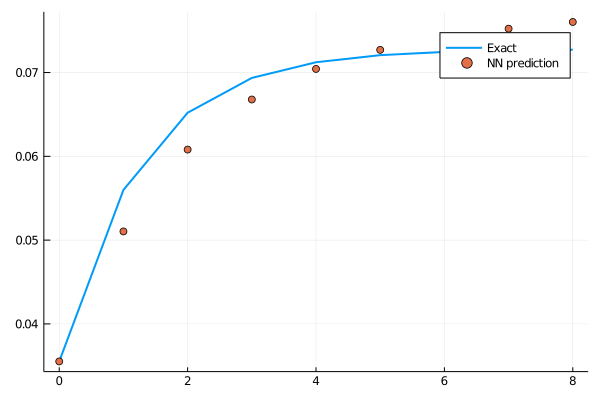

loss: 0.000354:  58%|███████████████████████▊                 |  ETA: 0:00:45

0.00034686038f0

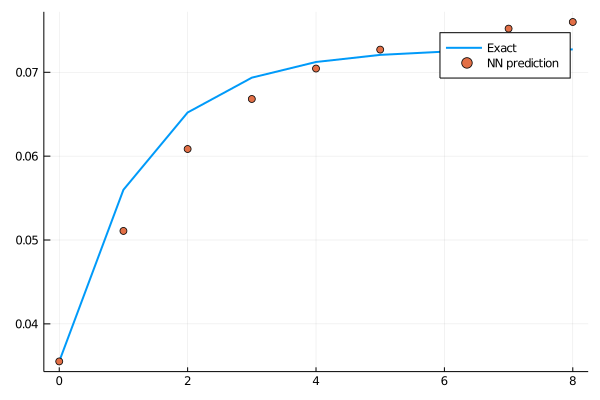

loss: 0.000347:  58%|███████████████████████▉                 |  ETA: 0:00:45

0.00033966568f0

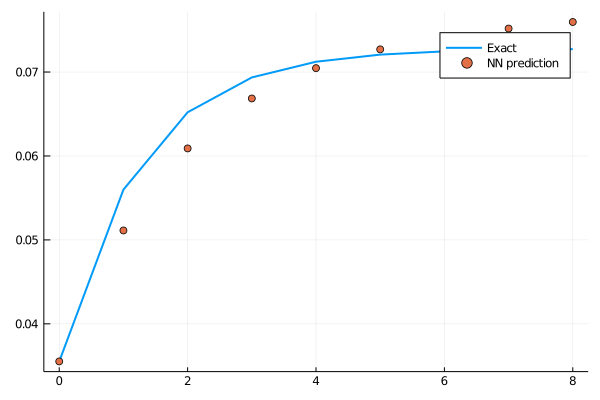

loss: 0.00034:  59%|████████████████████████                 |  ETA: 0:00:44

0.00033262916f0

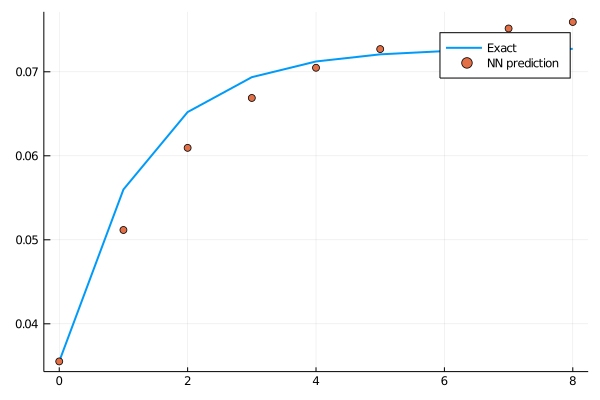

loss: 0.000333:  59%|████████████████████████▎                |  ETA: 0:00:44

0.0003257489f0

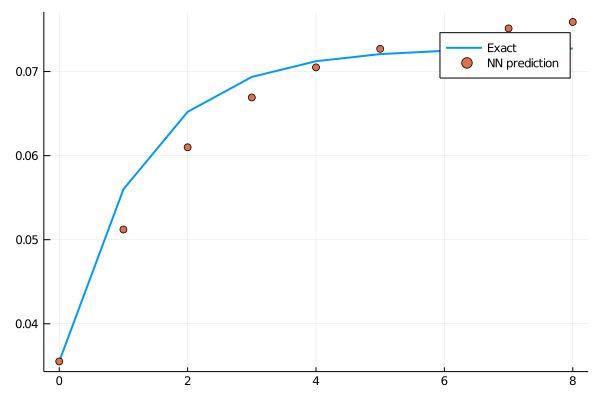

loss: 0.000326:  59%|████████████████████████▍                |  ETA: 0:00:43

0.00031901975f0

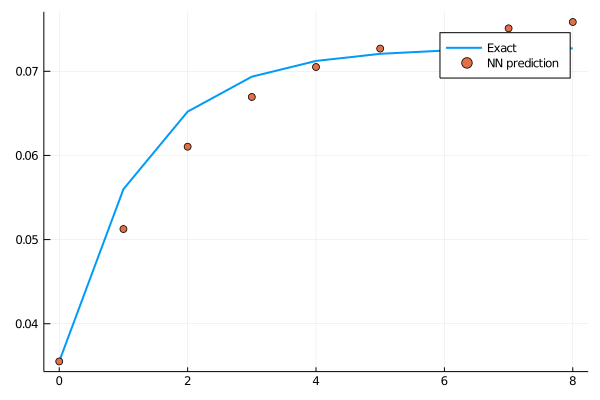

loss: 0.000319:  60%|████████████████████████▍                |  ETA: 0:00:43

0.0003124403f0

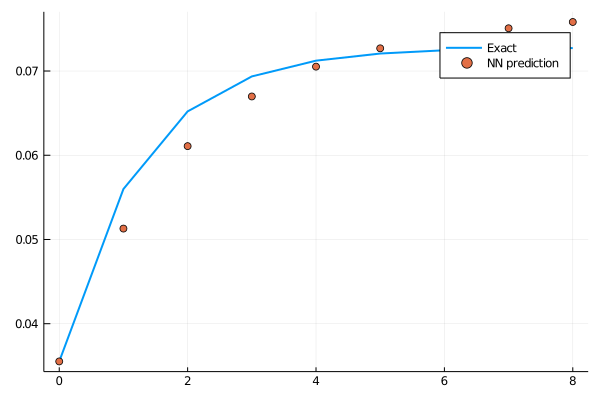

loss: 0.000312:  60%|████████████████████████▋                |  ETA: 0:00:42

0.00030600416f0

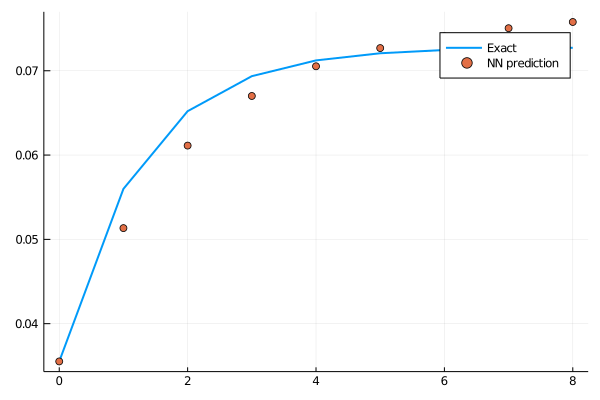

loss: 0.000306:  60%|████████████████████████▊                |  ETA: 0:00:42

0.00029970857f0

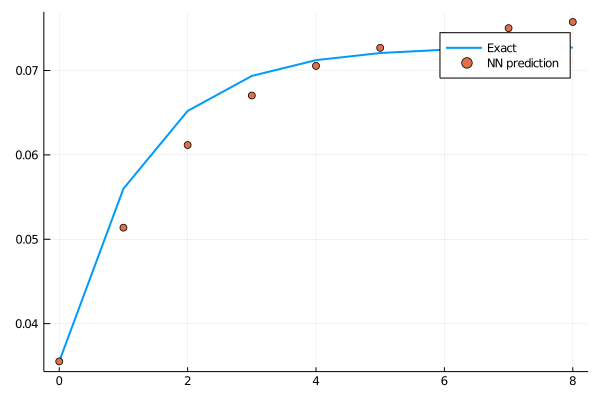

loss: 0.0003:  61%|████████████████████████▉                |  ETA: 0:00:41

0.00029355325f0

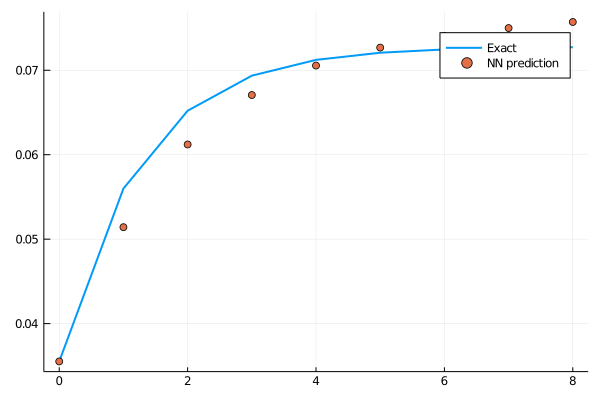

loss: 0.000294:  61%|█████████████████████████                |  ETA: 0:00:41

0.00028753153f0

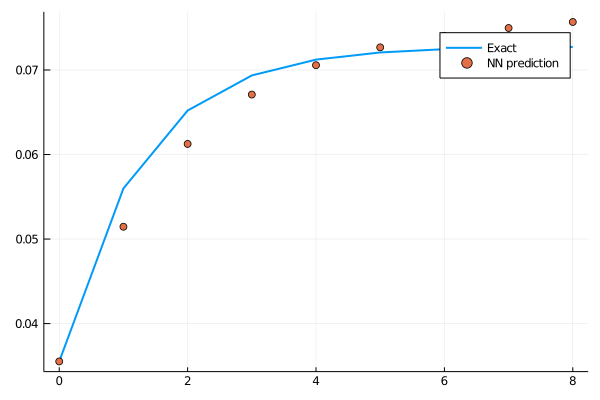

loss: 0.000288:  61%|█████████████████████████▏               |  ETA: 0:00:40

0.00028164117f0

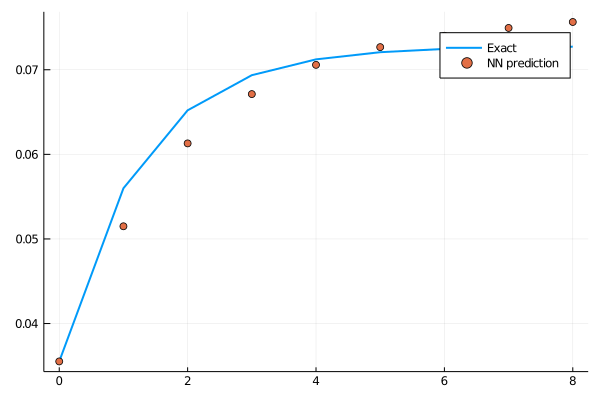

loss: 0.000282:  62%|█████████████████████████▎               |  ETA: 0:00:40

0.00027588158f0

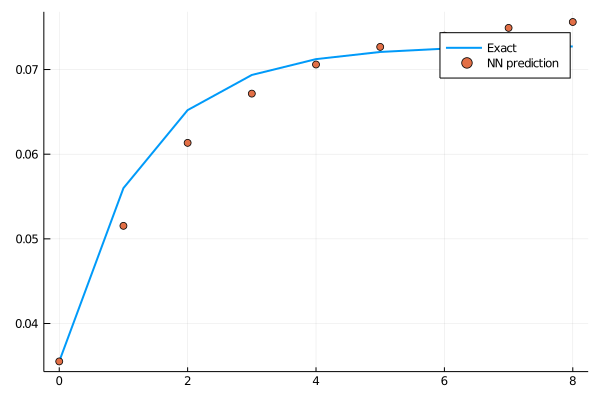

loss: 0.000276:  62%|█████████████████████████▍               |  ETA: 0:00:39

0.000270247f0

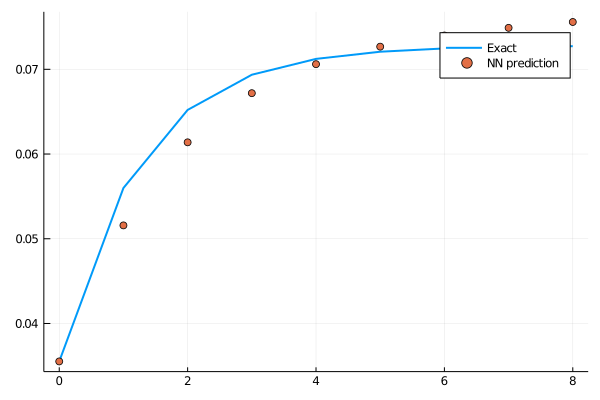

loss: 0.00027:  62%|█████████████████████████▌               |  ETA: 0:00:39

0.00026473295f0

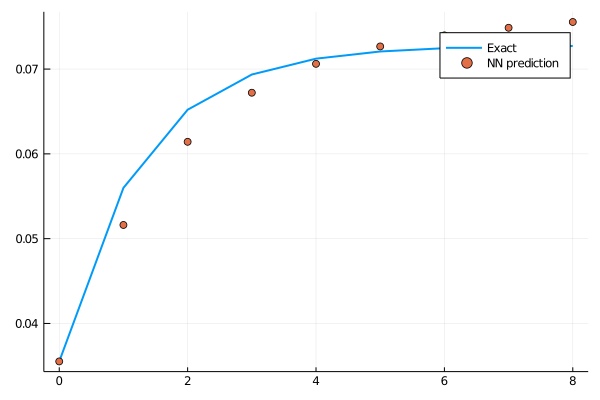

loss: 0.000265:  63%|█████████████████████████▋               |  ETA: 0:00:39

0.00025934118f0

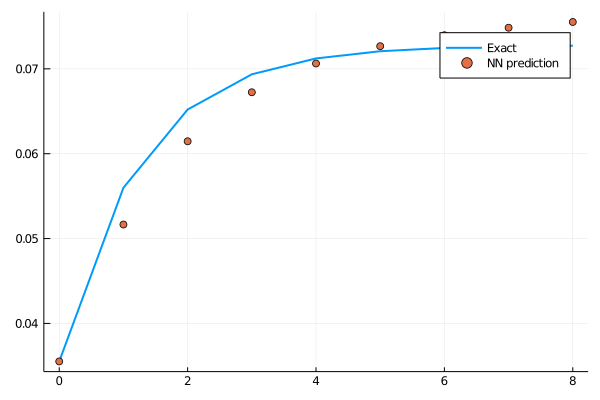

loss: 0.000259:  63%|█████████████████████████▉               |  ETA: 0:00:38

0.00025406535f0

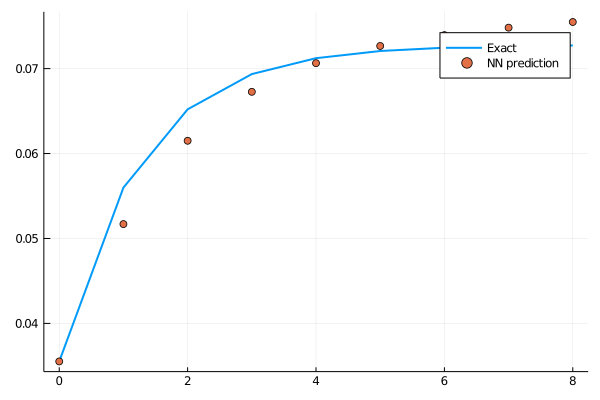

loss: 0.000254:  63%|██████████████████████████               |  ETA: 0:00:38

0.0002489039f0

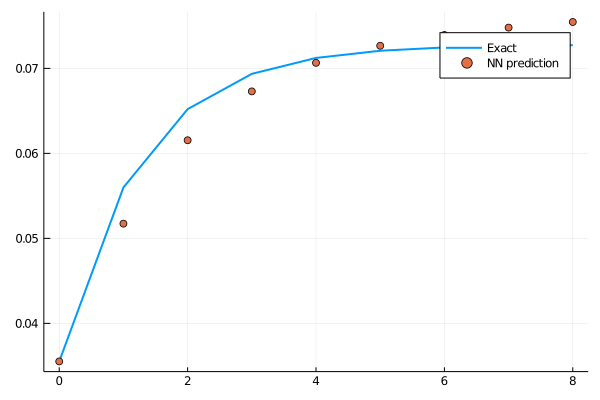

loss: 0.000249:  64%|██████████████████████████▏              |  ETA: 0:00:37

0.00024385366f0

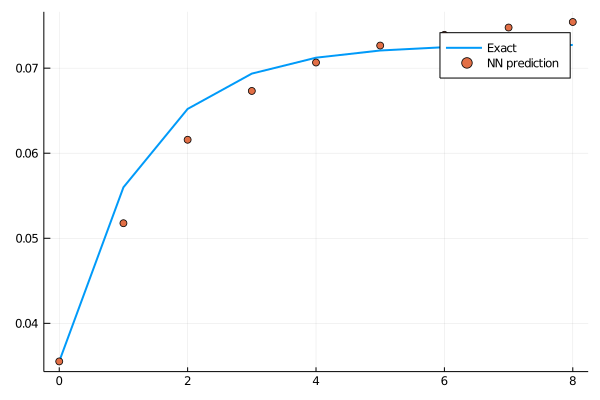

loss: 0.000244:  64%|██████████████████████████▎              |  ETA: 0:00:37

0.00023891337f0

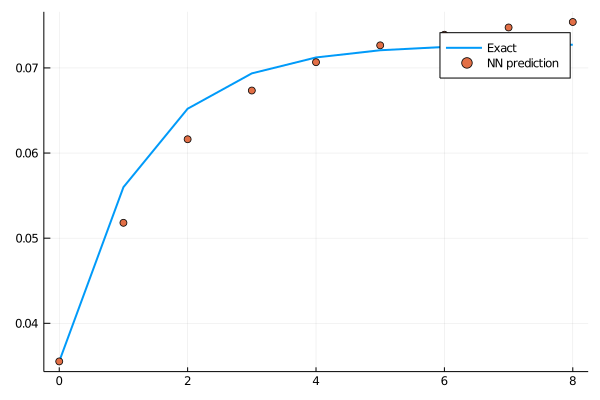

loss: 0.000239:  64%|██████████████████████████▍              |  ETA: 0:00:36

0.00023407865f0

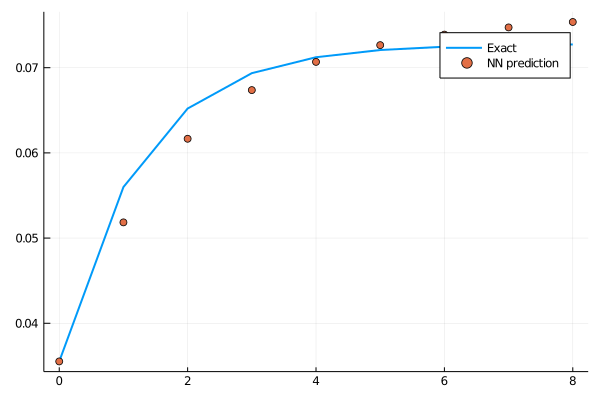

loss: 0.000234:  65%|██████████████████████████▌              |  ETA: 0:00:36

0.0002293491f0

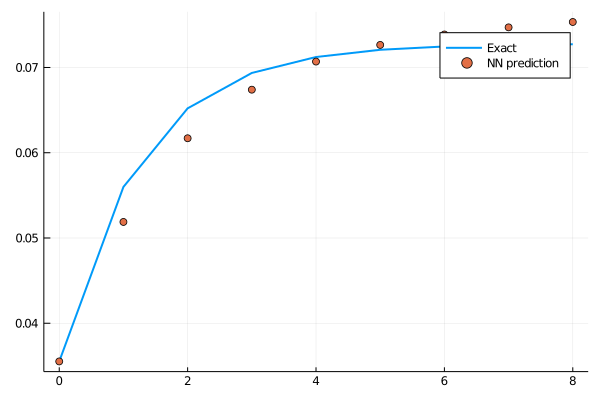

loss: 0.000229:  65%|██████████████████████████▋              |  ETA: 0:00:35

0.00022472112f0

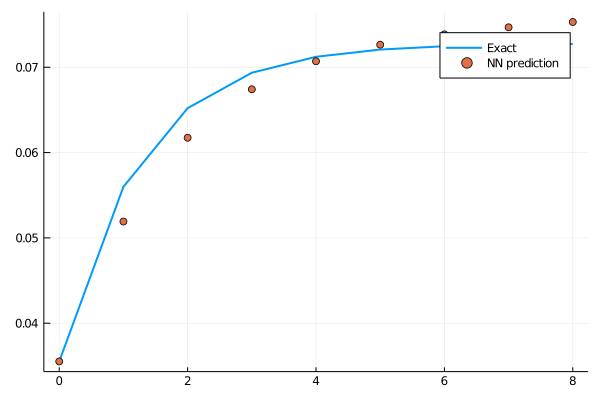

loss: 0.000225:  65%|██████████████████████████▊              |  ETA: 0:00:35

0.00022019271f0

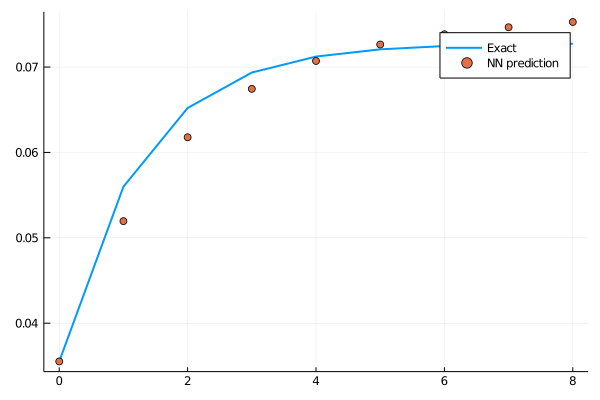

loss: 0.00022:  66%|██████████████████████████▉              |  ETA: 0:00:35

0.00021576135f0

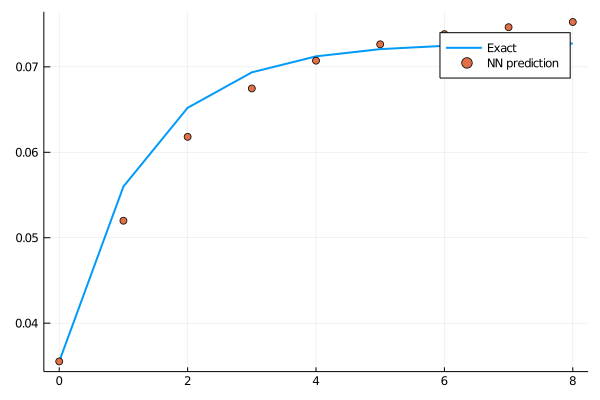

loss: 0.000216:  66%|███████████████████████████              |  ETA: 0:00:34

0.00021142511f0

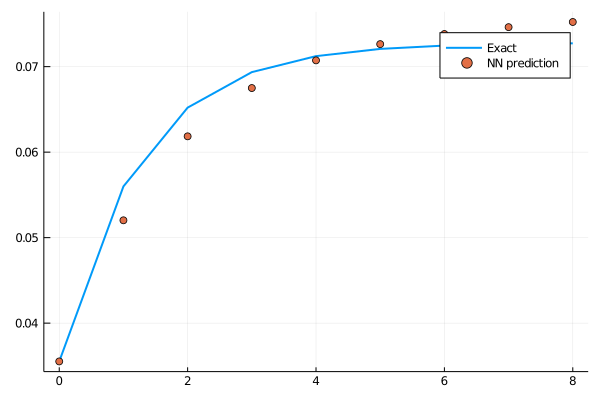

loss: 0.000211:  66%|███████████████████████████▏             |  ETA: 0:00:34

0.00020718049f0

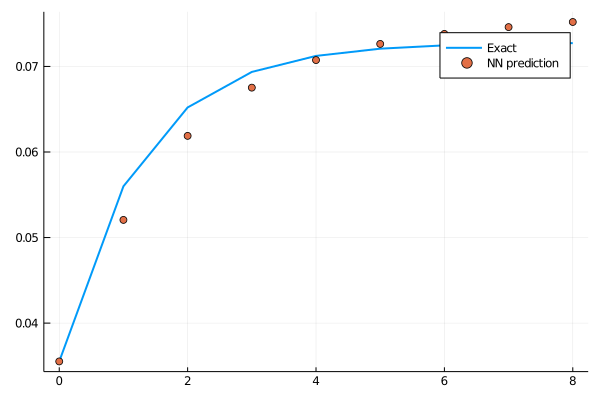

loss: 0.000207:  67%|███████████████████████████▎             |  ETA: 0:00:33

0.00020302717f0

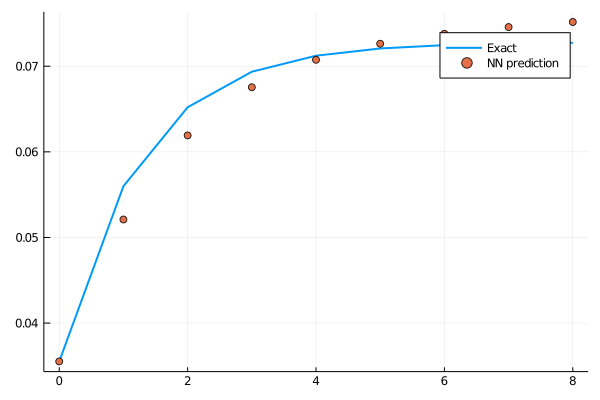

loss: 0.000203:  67%|███████████████████████████▌             |  ETA: 0:00:33

0.0001989633f0

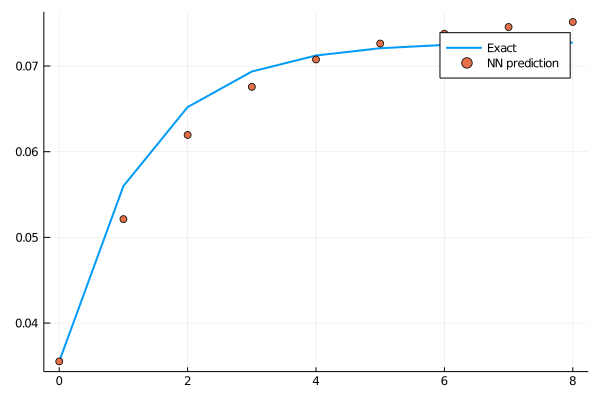

loss: 0.000199:  67%|███████████████████████████▋             |  ETA: 0:00:32

0.00019498325f0

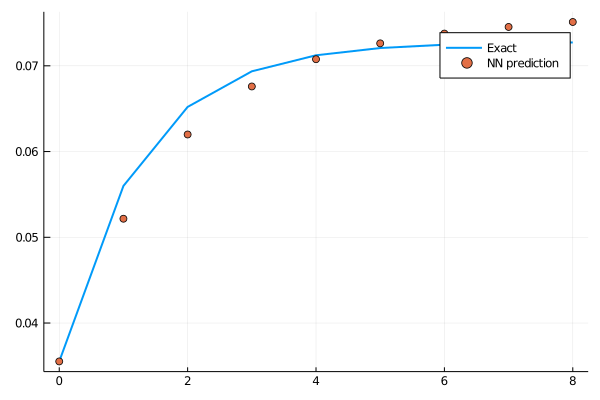

loss: 0.000195:  68%|███████████████████████████▊             |  ETA: 0:00:32

0.00019108933f0

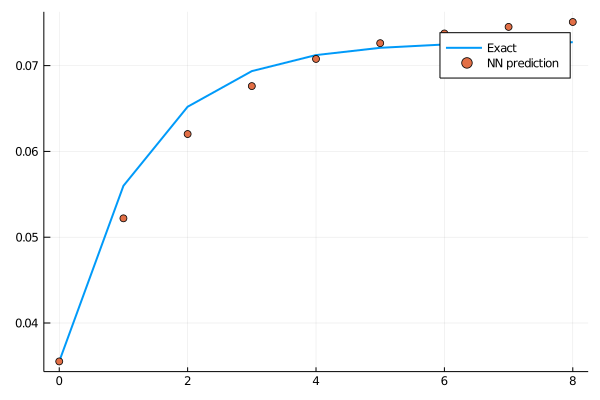

loss: 0.000191:  68%|███████████████████████████▉             |  ETA: 0:00:32

0.00018727765f0

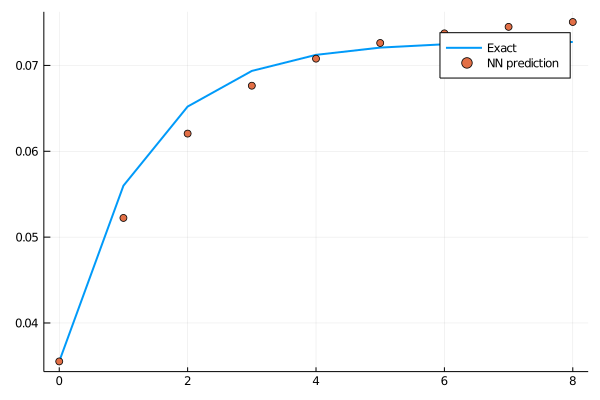

loss: 0.000187:  68%|████████████████████████████             |  ETA: 0:00:31

0.0001835482f0

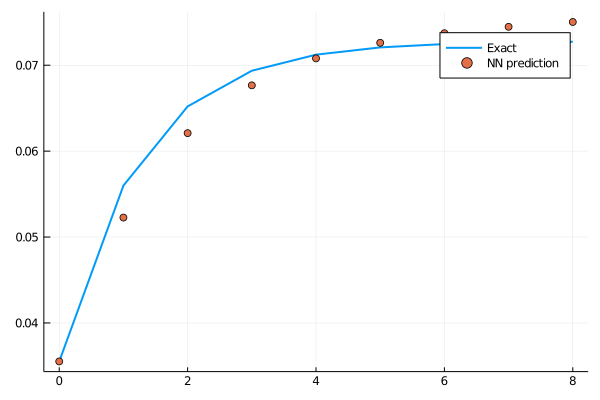

loss: 0.000184:  69%|████████████████████████████▏            |  ETA: 0:00:31

0.0001798966f0

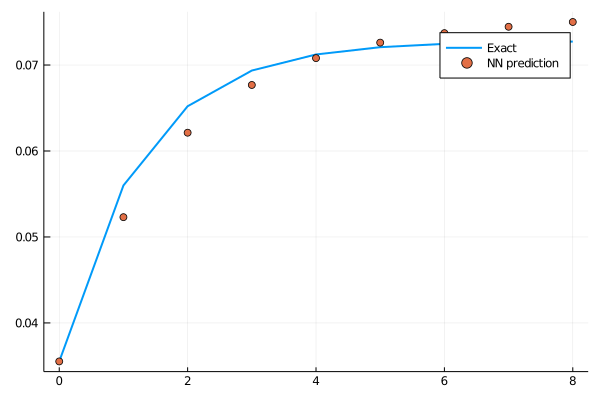

loss: 0.00018:  69%|████████████████████████████▎            |  ETA: 0:00:30

0.00017632071f0

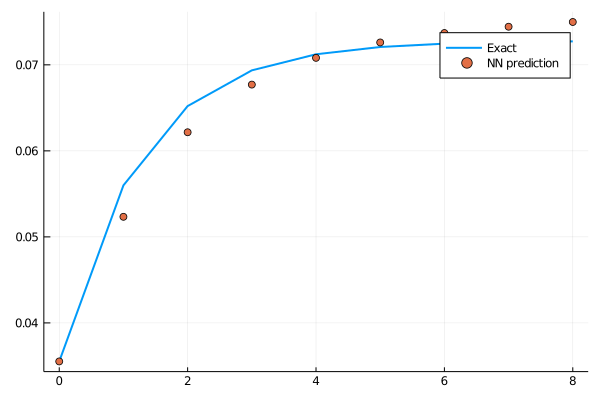

loss: 0.000176:  69%|████████████████████████████▍            |  ETA: 0:00:30

0.00017282055f0

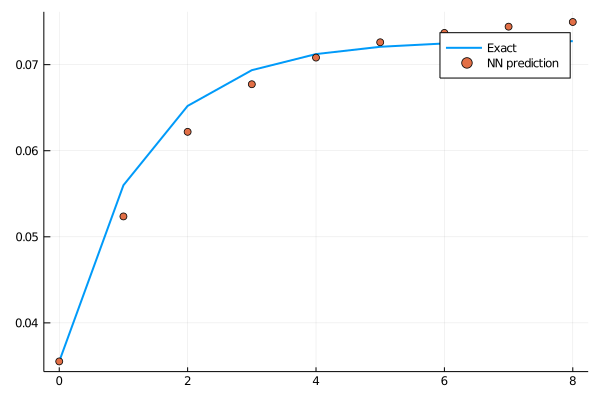

loss: 0.000173:  70%|████████████████████████████▌            |  ETA: 0:00:30

0.000169395f0

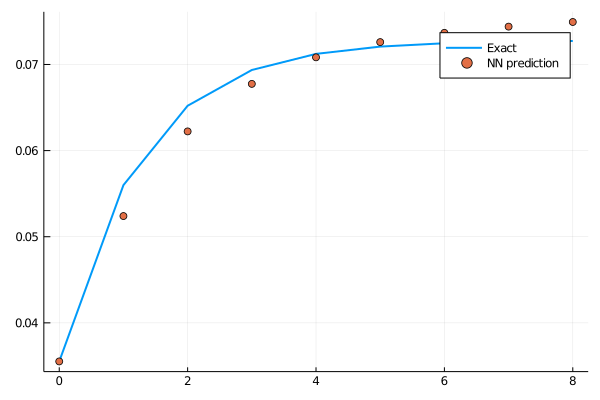

loss: 0.000169:  70%|████████████████████████████▊            |  ETA: 0:00:29

0.00016604237f0

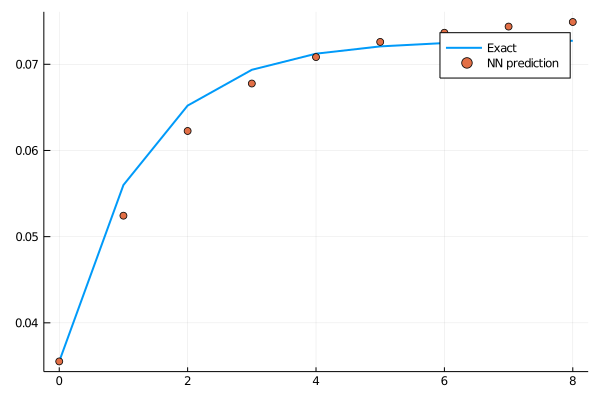

loss: 0.000166:  70%|████████████████████████████▉            |  ETA: 0:00:29

0.00016275662f0

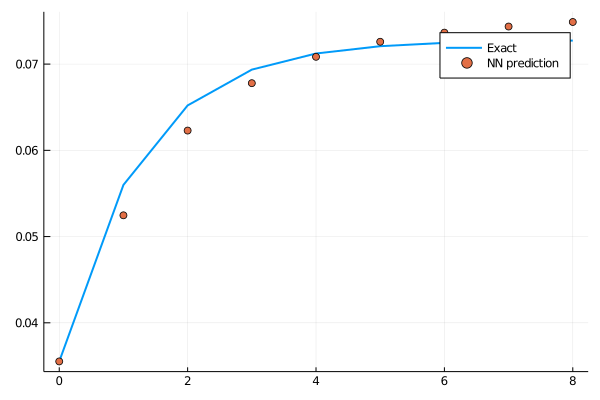

loss: 0.000163:  71%|█████████████████████████████            |  ETA: 0:00:29

0.00015954385f0

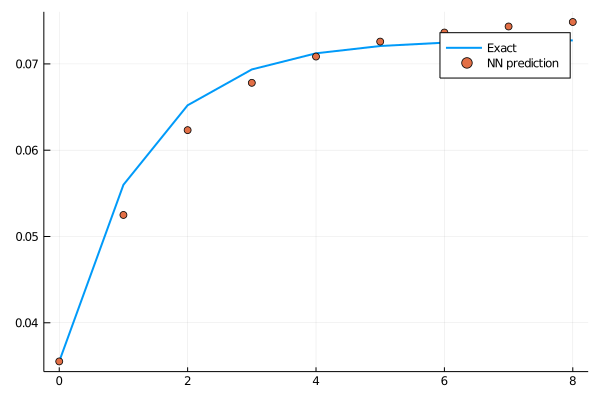

loss: 0.00016:  71%|█████████████████████████████▏           |  ETA: 0:00:28

0.00015639602f0

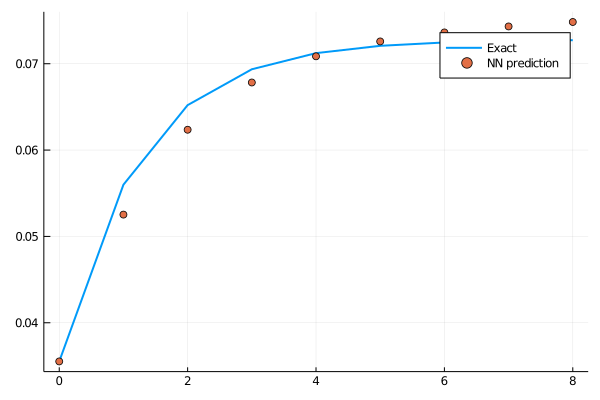

loss: 0.000156:  71%|█████████████████████████████▎           |  ETA: 0:00:28

0.0001533156f0

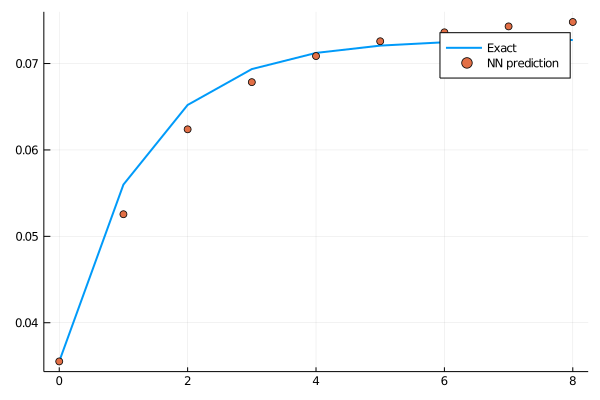

loss: 0.000153:  72%|█████████████████████████████▍           |  ETA: 0:00:27

0.00015029828f0

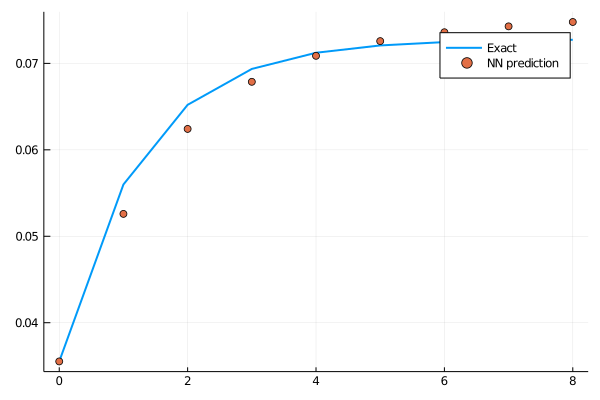

loss: 0.00015:  72%|█████████████████████████████▌           |  ETA: 0:00:27

0.00014734478f0

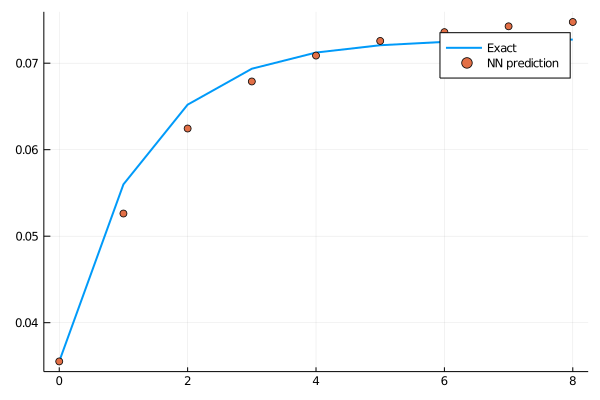

loss: 0.000147:  72%|█████████████████████████████▋           |  ETA: 0:00:27

0.00014445257f0

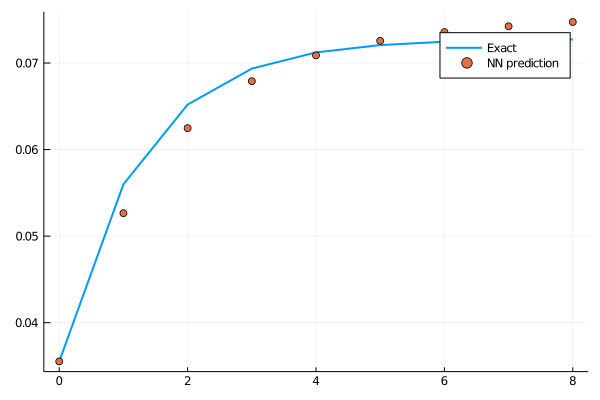

loss: 0.000144:  73%|█████████████████████████████▊           |  ETA: 0:00:26

0.00014161857f0

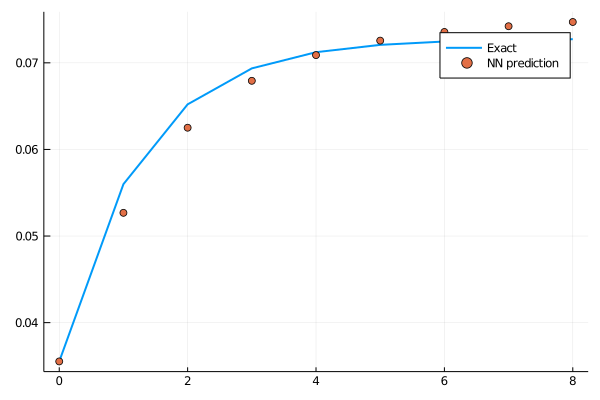

loss: 0.000142:  73%|█████████████████████████████▉           |  ETA: 0:00:26

0.0001388461f0

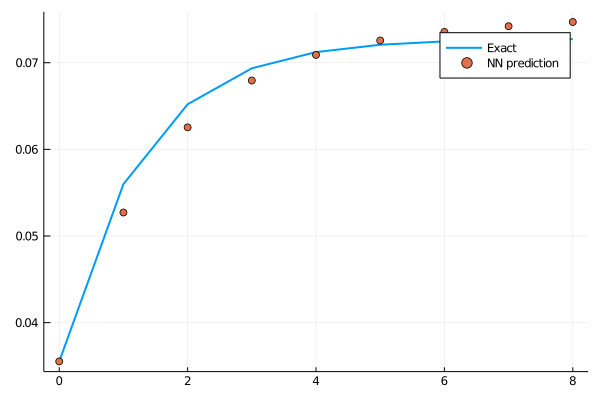

loss: 0.000139:  73%|██████████████████████████████           |  ETA: 0:00:25

0.00013613308f0

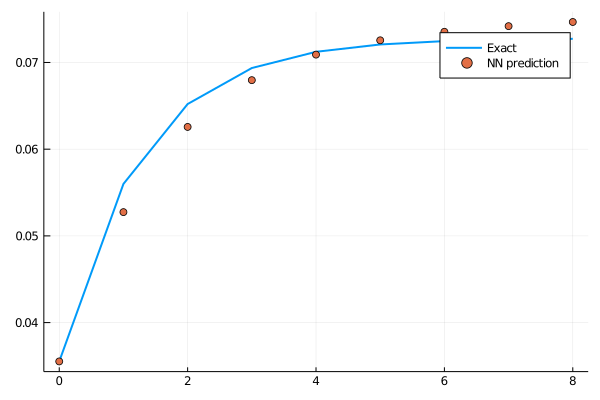

loss: 0.000136:  74%|██████████████████████████████▏          |  ETA: 0:00:25

0.00013348077f0

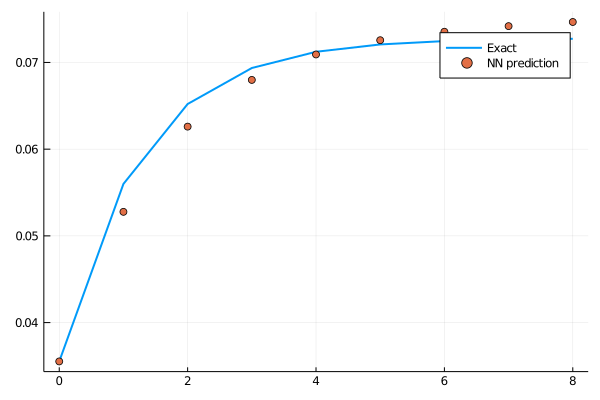

loss: 0.000133:  74%|██████████████████████████████▍          |  ETA: 0:00:25

0.00013089129f0

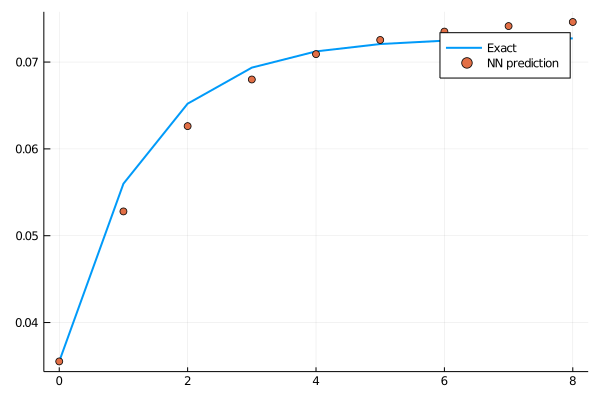

loss: 0.000131:  74%|██████████████████████████████▌          |  ETA: 0:00:24

0.0001283808f0

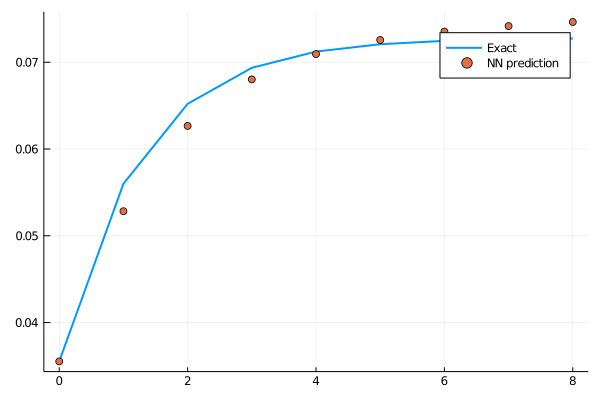

loss: 0.000128:  75%|██████████████████████████████▋          |  ETA: 0:00:24

0.00012598274f0

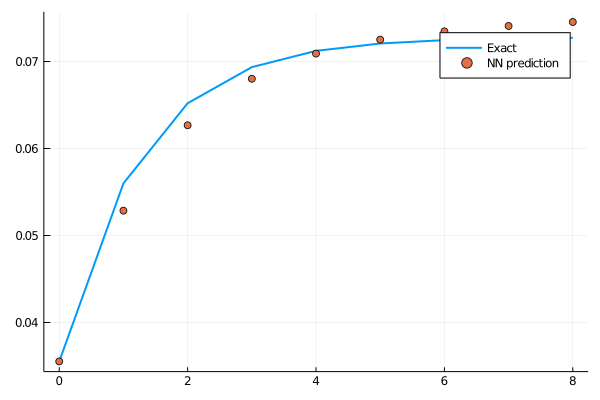

loss: 0.000126:  75%|██████████████████████████████▊          |  ETA: 0:00:24

0.00012378815f0

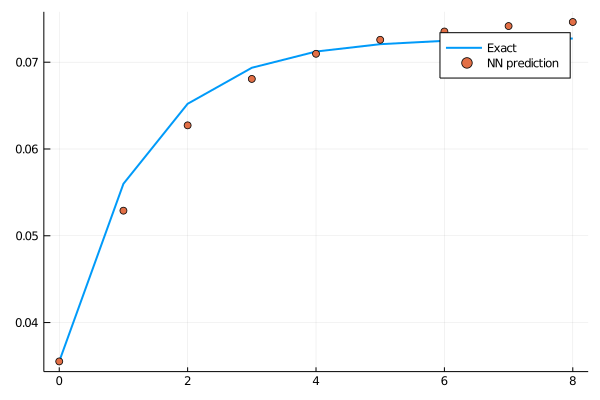

loss: 0.000124:  75%|██████████████████████████████▉          |  ETA: 0:00:23

0.000122034944f0

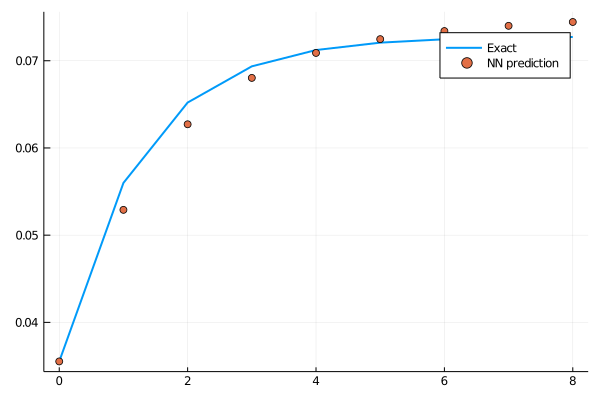

loss: 0.000122:  76%|███████████████████████████████          |  ETA: 0:00:23

0.000121352066f0

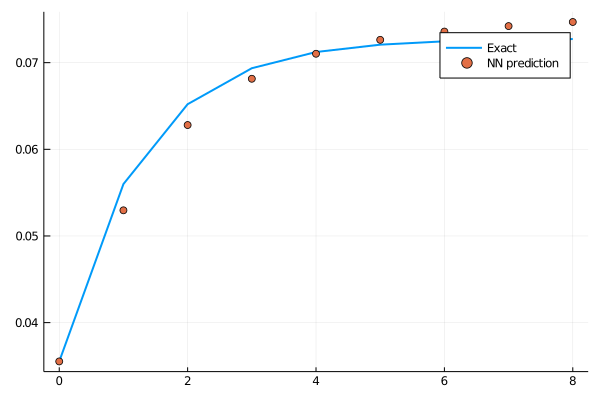

loss: 0.000121:  76%|███████████████████████████████▏         |  ETA: 0:00:22

0.00012333781f0

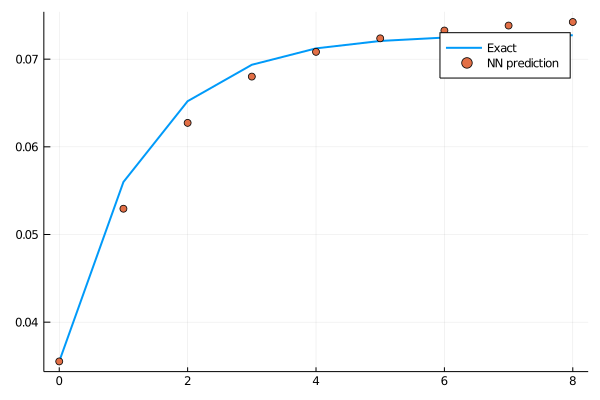

loss: 0.000123:  76%|███████████████████████████████▎         |  ETA: 0:00:22

0.00013188252f0

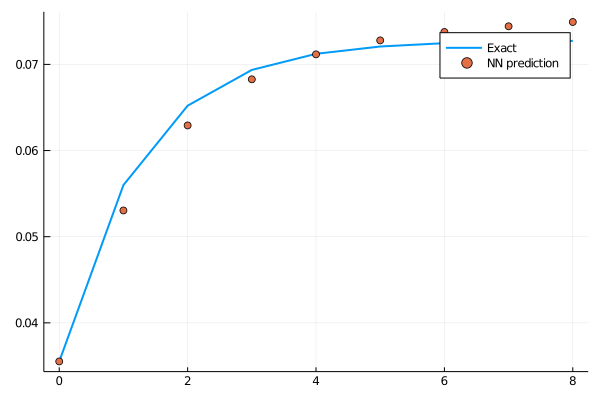

loss: 0.000132:  77%|███████████████████████████████▍         |  ETA: 0:00:22

0.00015445985f0

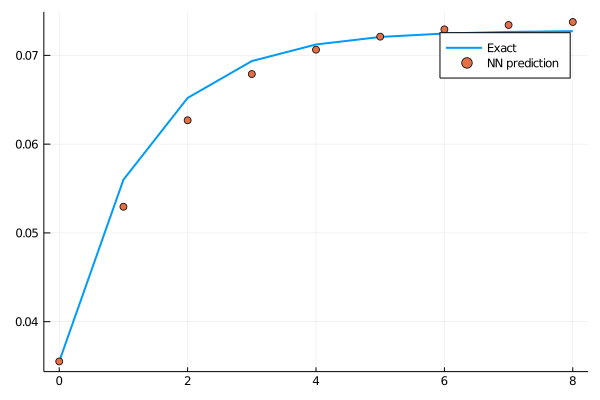

loss: 0.000154:  77%|███████████████████████████████▋         |  ETA: 0:00:21

0.00020086818f0

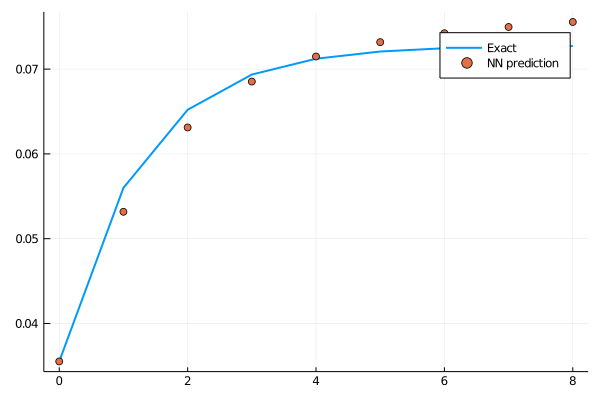

loss: 0.000201:  77%|███████████████████████████████▊         |  ETA: 0:00:21

0.00027340747f0

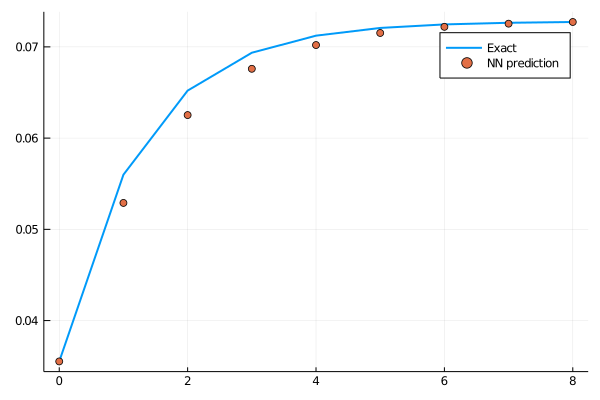

loss: 0.000273:  78%|███████████████████████████████▉         |  ETA: 0:00:21

0.00038052915f0

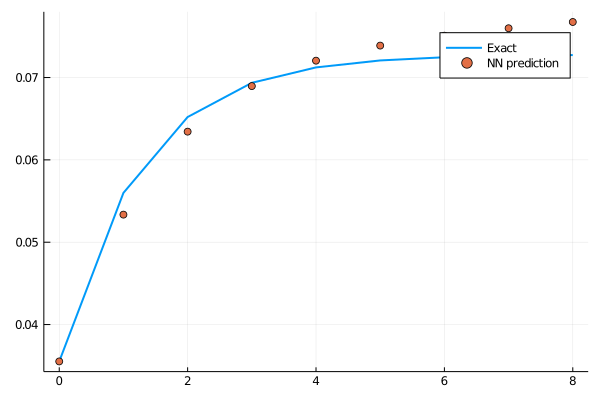

loss: 0.000381:  78%|████████████████████████████████         |  ETA: 0:00:20

0.00053509185f0

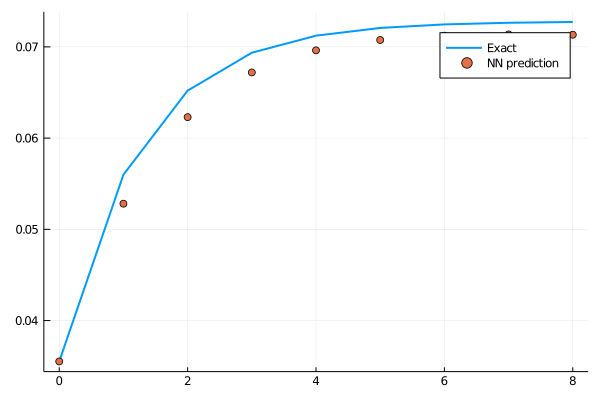

loss: 0.000535:  78%|████████████████████████████████▏        |  ETA: 0:00:20

0.0007323697f0

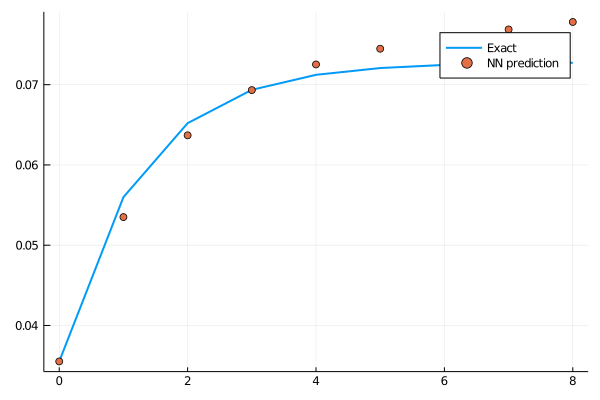

loss: 0.000732:  79%|████████████████████████████████▎        |  ETA: 0:00:20

0.00085346936f0

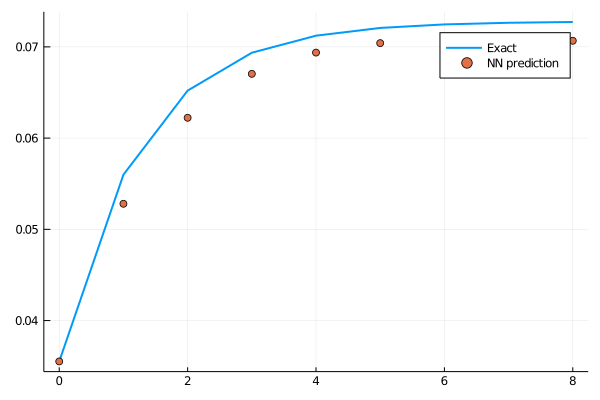

loss: 0.000853:  79%|████████████████████████████████▍        |  ETA: 0:00:19

0.0007409601f0

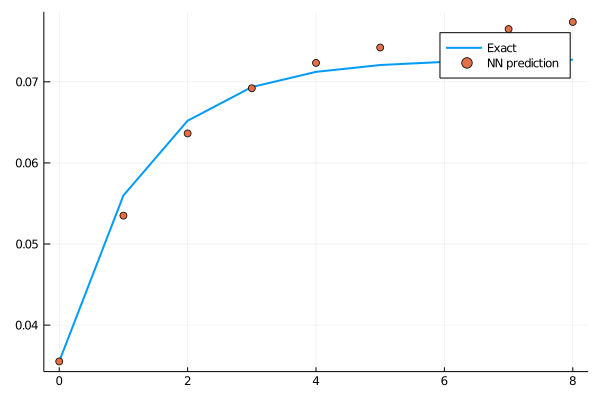

loss: 0.000741:  79%|████████████████████████████████▌        |  ETA: 0:00:19

0.00039891707f0

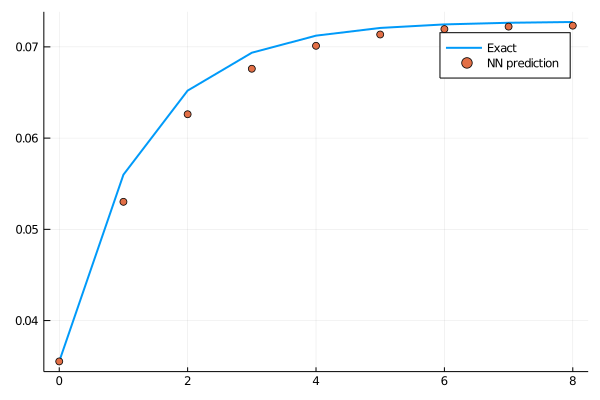

loss: 0.000399:  80%|████████████████████████████████▋        |  ETA: 0:00:19

0.00012544762f0

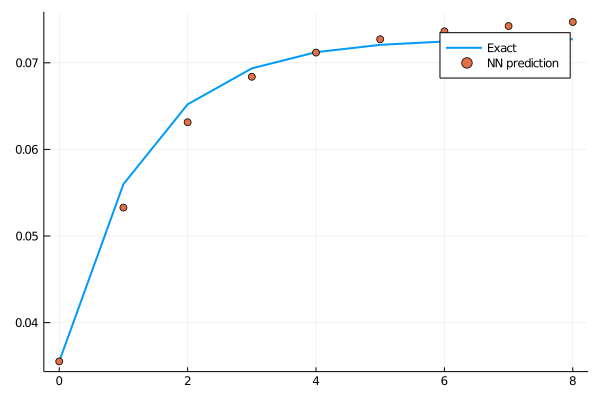

loss: 0.000125:  80%|████████████████████████████████▊        |  ETA: 0:00:18

0.00016310345f0

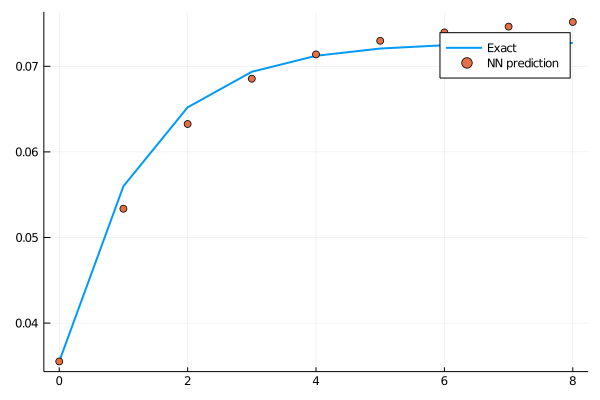

loss: 0.000163:  80%|████████████████████████████████▉        |  ETA: 0:00:18

0.00036756674f0

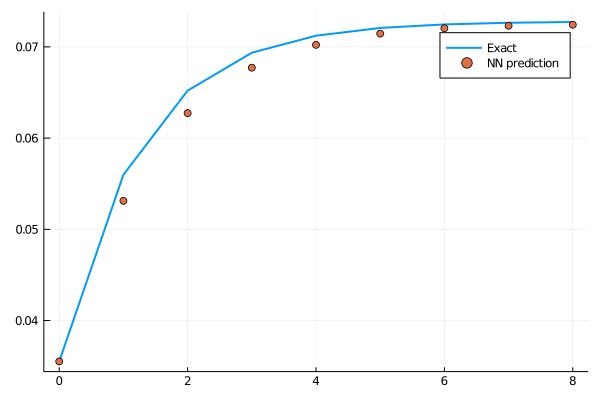

loss: 0.000368:  81%|█████████████████████████████████        |  ETA: 0:00:18

0.000401281f0

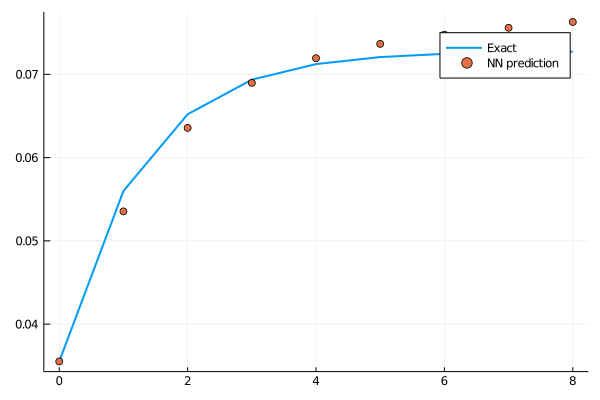

loss: 0.000401:  81%|█████████████████████████████████▎       |  ETA: 0:00:17

0.00020844389f0

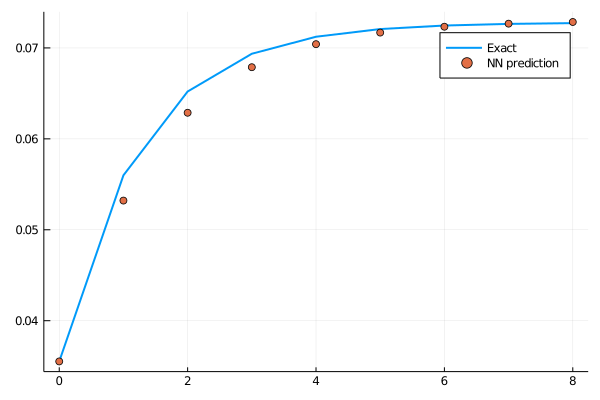

loss: 0.000208:  81%|█████████████████████████████████▍       |  ETA: 0:00:17

9.130194f-5

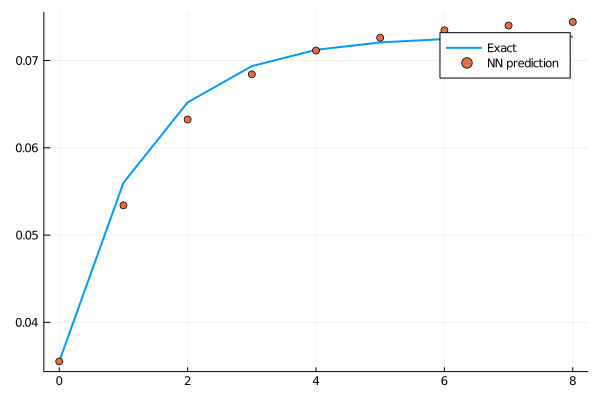

loss: 9.13e-05:  82%|█████████████████████████████████▌       |  ETA: 0:00:17

0.00018944273f0

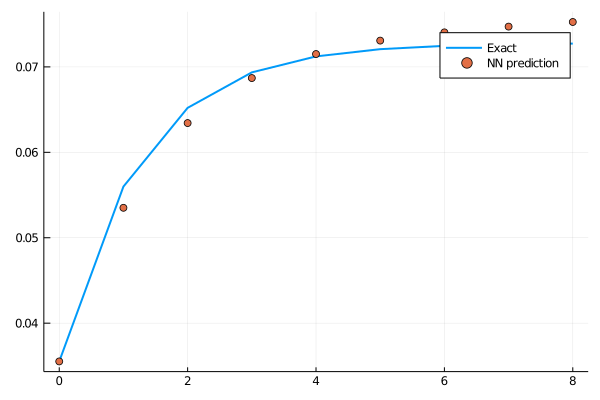

loss: 0.000189:  82%|█████████████████████████████████▋       |  ETA: 0:00:16

0.00027161237f0

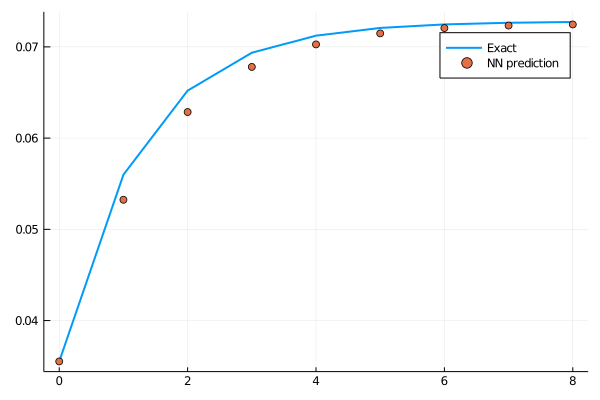

loss: 0.000272:  82%|█████████████████████████████████▊       |  ETA: 0:00:16

0.00017810002f0

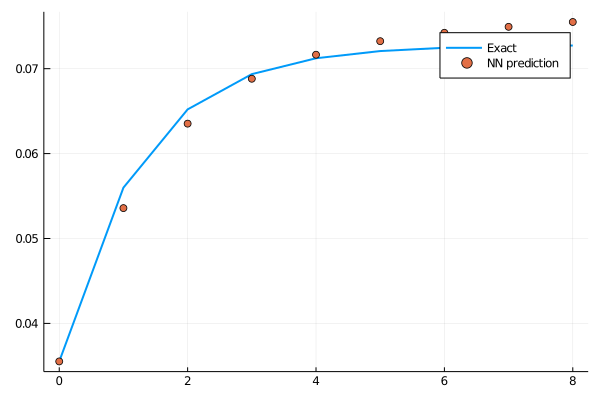

loss: 0.000178:  83%|█████████████████████████████████▉       |  ETA: 0:00:16

8.52316f-5

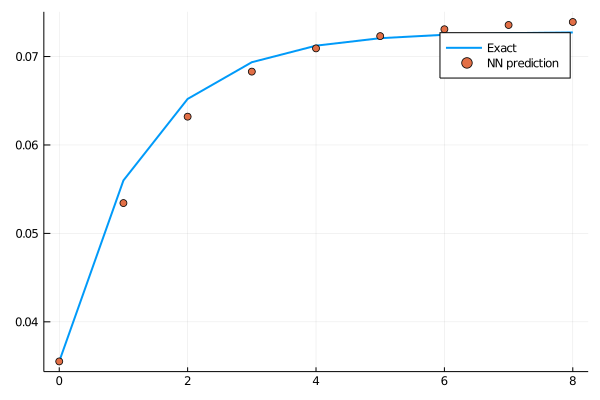

loss: 8.52e-05:  83%|██████████████████████████████████       |  ETA: 0:00:15

0.00014004312f0

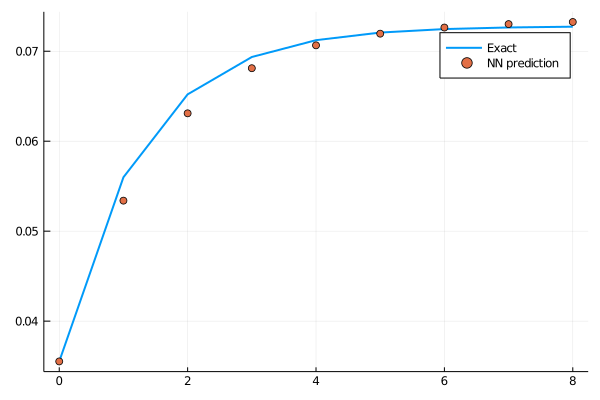

loss: 0.00014:  83%|██████████████████████████████████▏      |  ETA: 0:00:15

0.0001933276f0

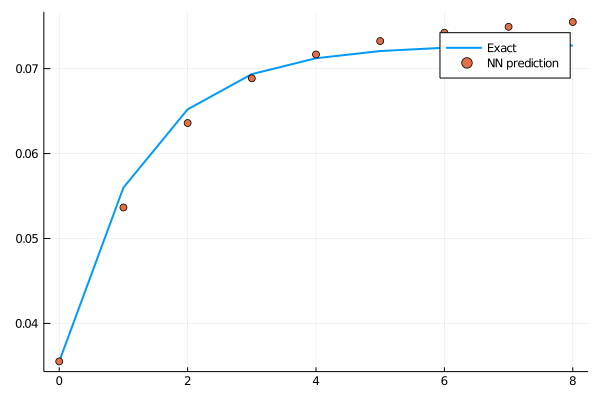

loss: 0.000193:  84%|██████████████████████████████████▎      |  ETA: 0:00:15

0.00012869961f0

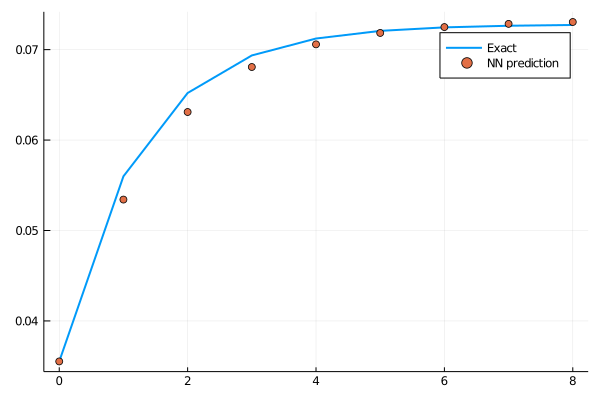

loss: 0.000129:  84%|██████████████████████████████████▌      |  ETA: 0:00:14

7.868051f-5

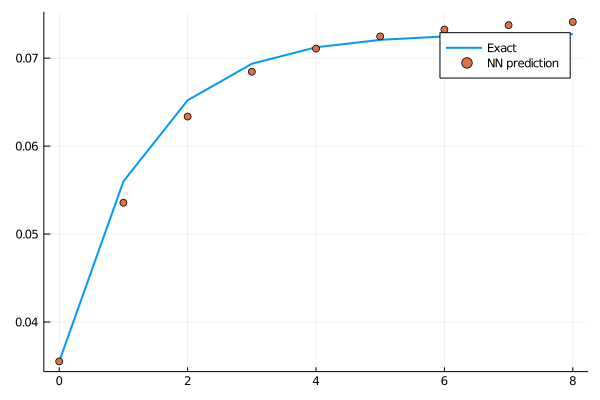

loss: 7.87e-05:  84%|██████████████████████████████████▋      |  ETA: 0:00:14

0.00012354723f0

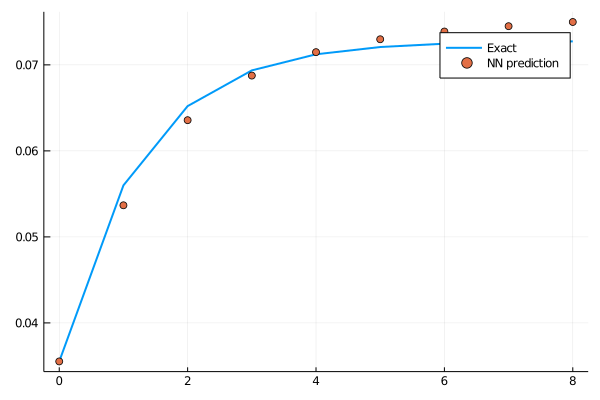

loss: 0.000124:  85%|██████████████████████████████████▋      |  ETA: 0:00:14

0.0001429706f0

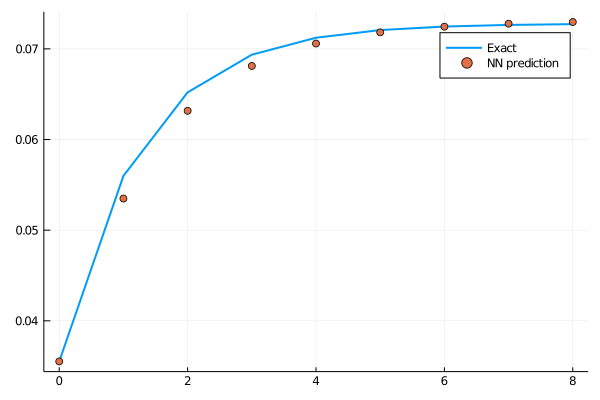

loss: 0.000143:  85%|██████████████████████████████████▉      |  ETA: 0:00:13

9.137623f-5

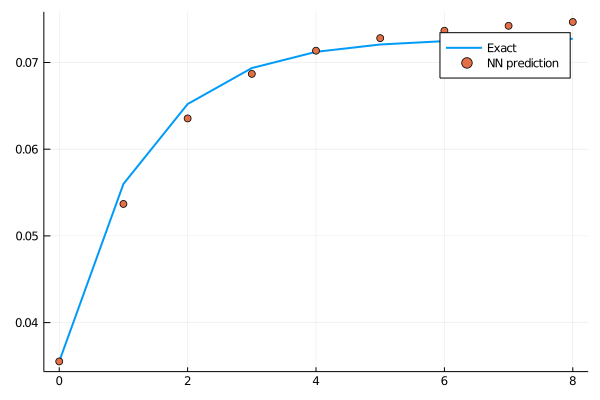

loss: 9.14e-05:  85%|███████████████████████████████████      |  ETA: 0:00:13

7.590154f-5

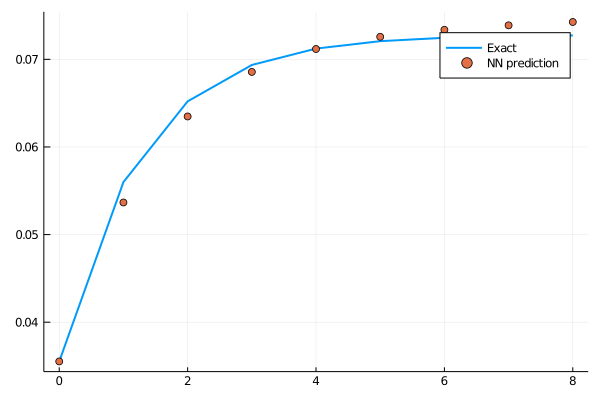

loss: 7.59e-05:  86%|███████████████████████████████████▏     |  ETA: 0:00:13

0.00011151266f0

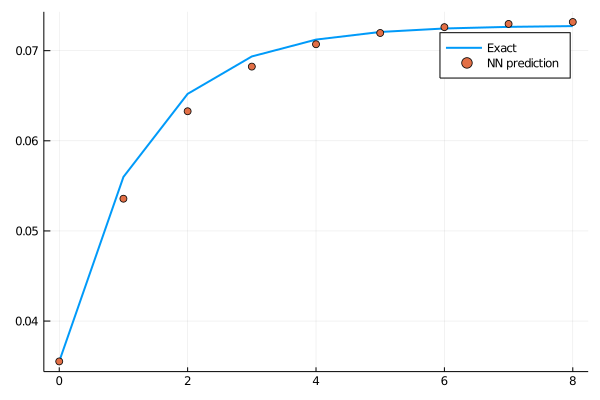

loss: 0.000112:  86%|███████████████████████████████████▎     |  ETA: 0:00:12

0.00010647352f0

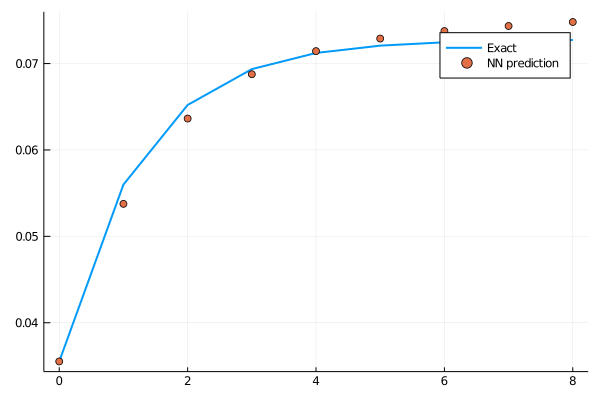

loss: 0.000106:  86%|███████████████████████████████████▍     |  ETA: 0:00:12

7.03961f-5

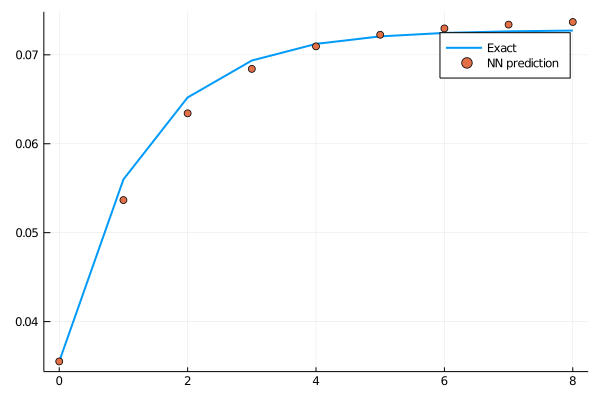

loss: 7.04e-05:  87%|███████████████████████████████████▌     |  ETA: 0:00:12

7.6053366f-5

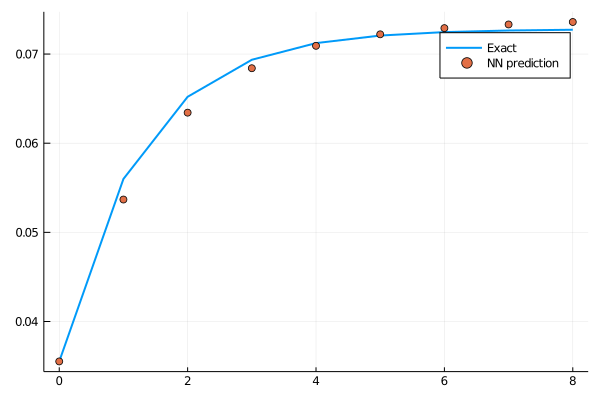

loss: 7.61e-05:  87%|███████████████████████████████████▋     |  ETA: 0:00:11

9.670535f-5

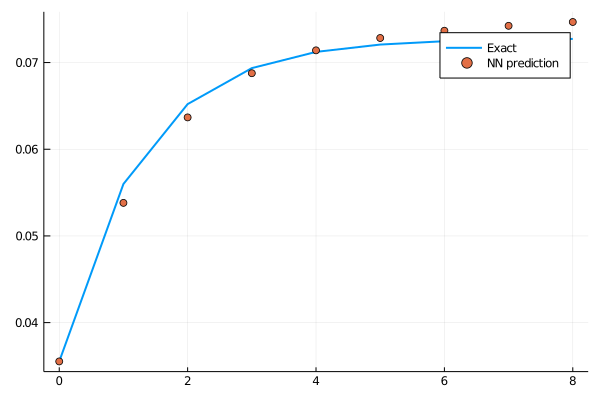

loss: 9.67e-05:  87%|███████████████████████████████████▊     |  ETA: 0:00:11

8.009326f-5

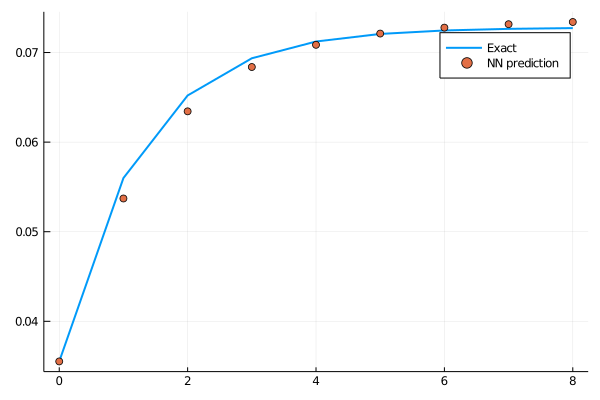

loss: 8.01e-05:  88%|███████████████████████████████████▉     |  ETA: 0:00:11

6.178617f-5

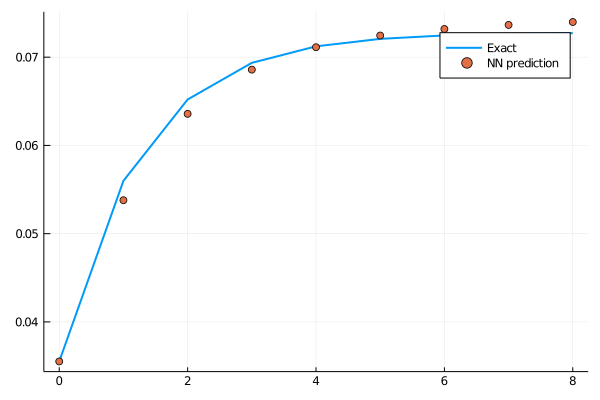

loss: 6.18e-05:  88%|████████████████████████████████████▏    |  ETA: 0:00:11

7.4294396f-5

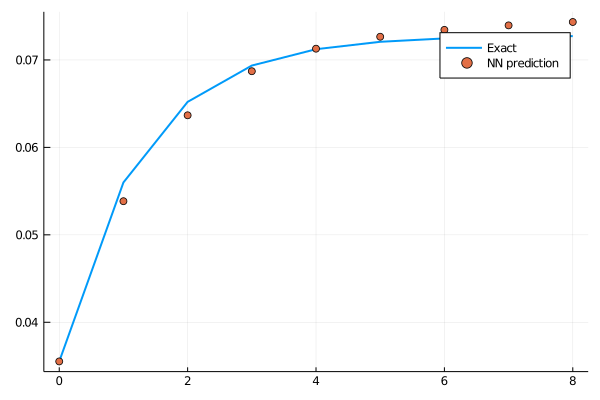

loss: 7.43e-05:  88%|████████████████████████████████████▎    |  ETA: 0:00:10

8.025102f-5

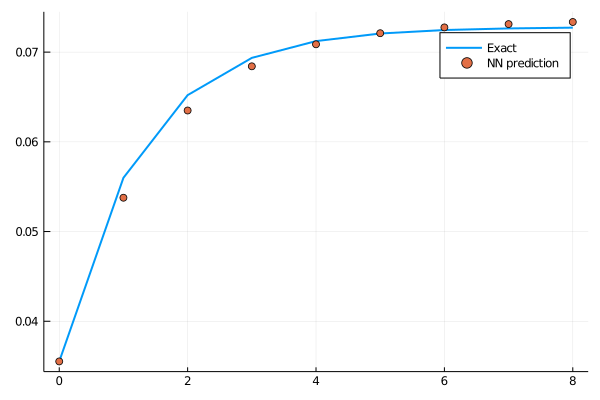

loss: 8.03e-05:  89%|████████████████████████████████████▍    |  ETA: 0:00:10

6.3677435f-5

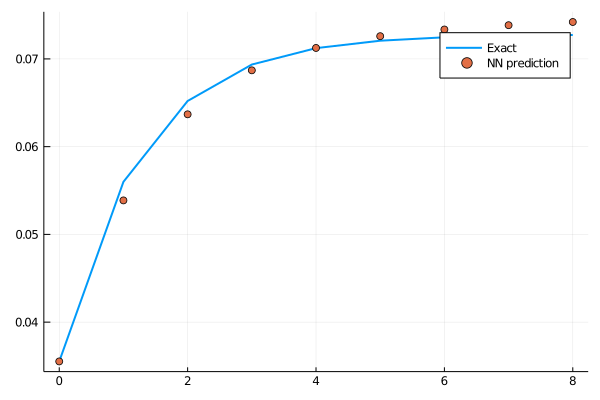

loss: 6.37e-05:  89%|████████████████████████████████████▌    |  ETA: 0:00:10

5.8860358f-5

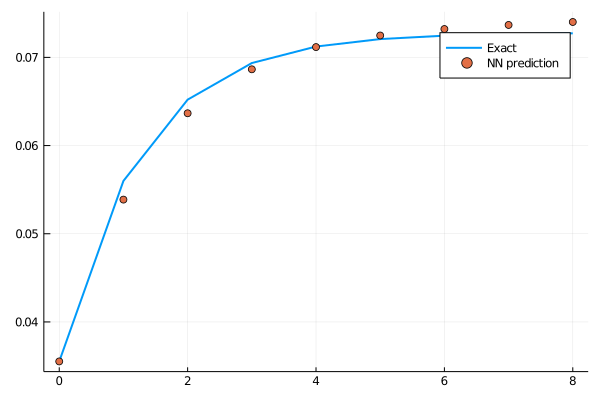

loss: 5.89e-05:  89%|████████████████████████████████████▋    |  ETA: 0:00:09

6.921178f-5

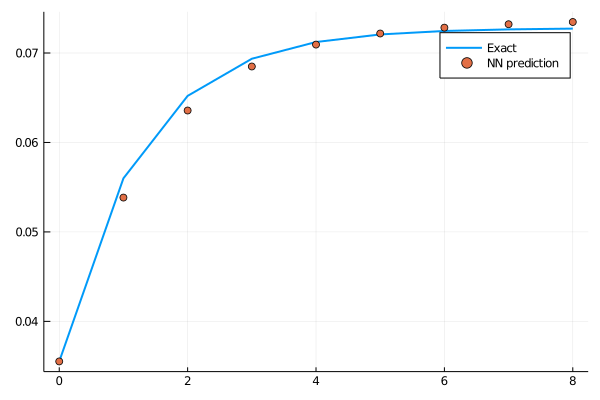

loss: 6.92e-05:  90%|████████████████████████████████████▊    |  ETA: 0:00:09

6.6344604f-5

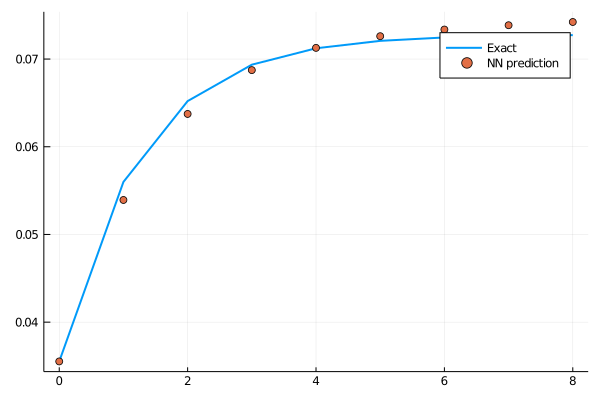

loss: 6.63e-05:  90%|████████████████████████████████████▉    |  ETA: 0:00:09

5.4866552f-5

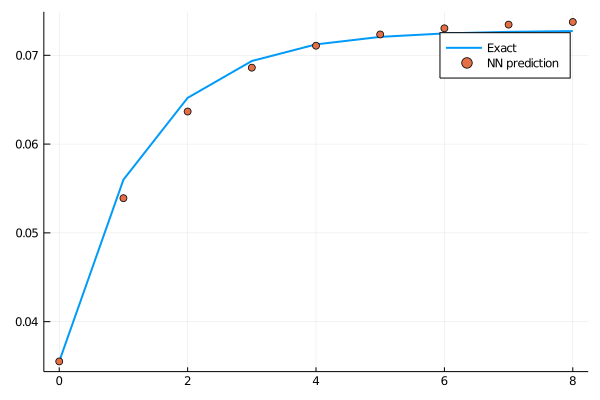

loss: 5.49e-05:  90%|█████████████████████████████████████    |  ETA: 0:00:08

5.63555f-5

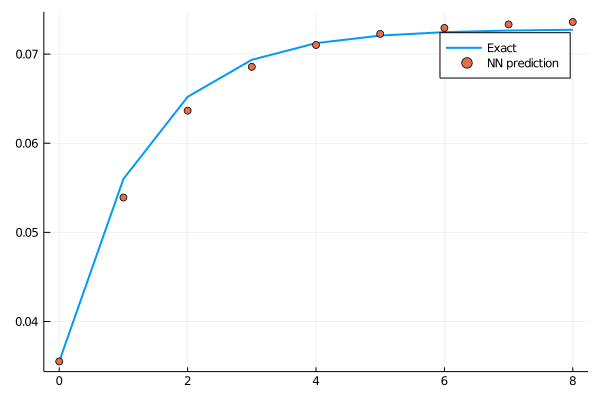

loss: 5.64e-05:  91%|█████████████████████████████████████▏   |  ETA: 0:00:08

6.184499f-5

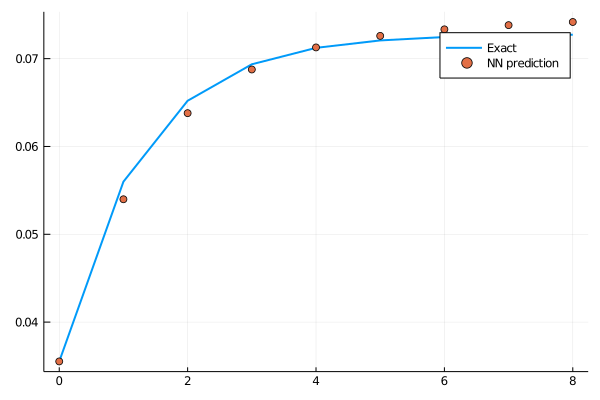

loss: 6.18e-05:  91%|█████████████████████████████████████▎   |  ETA: 0:00:08

5.6314573f-5

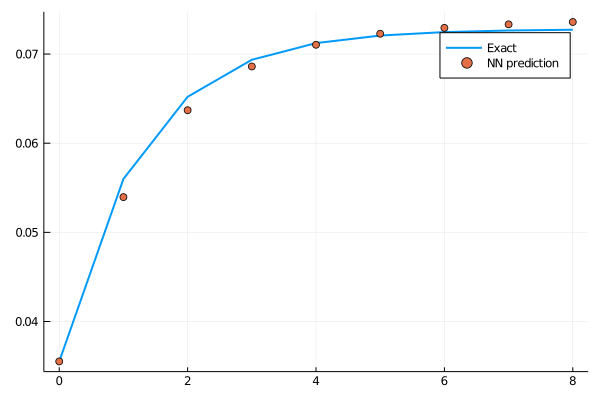

loss: 5.63e-05:  91%|█████████████████████████████████████▍   |  ETA: 0:00:08

5.0278944f-5

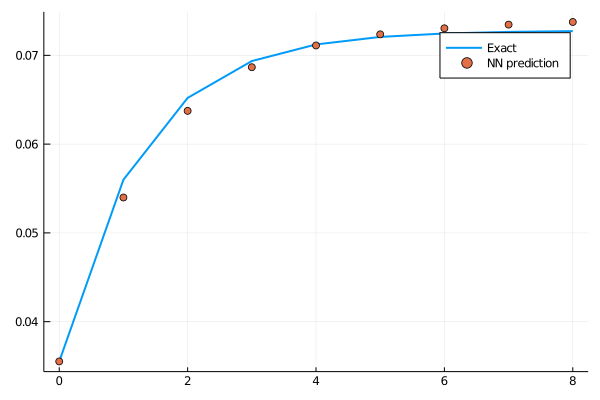

loss: 5.03e-05:  92%|█████████████████████████████████████▌   |  ETA: 0:00:07

5.3073425f-5

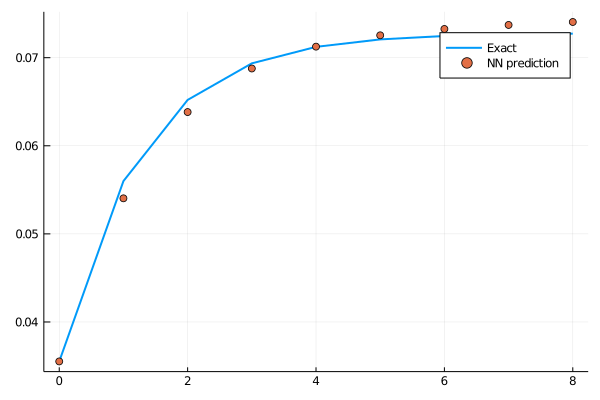

loss: 5.31e-05:  92%|█████████████████████████████████████▊   |  ETA: 0:00:07

5.4458313f-5

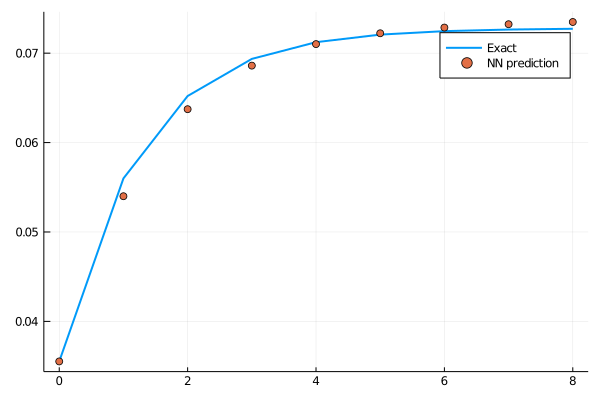

loss: 5.45e-05:  92%|█████████████████████████████████████▉   |  ETA: 0:00:07

4.942861f-5

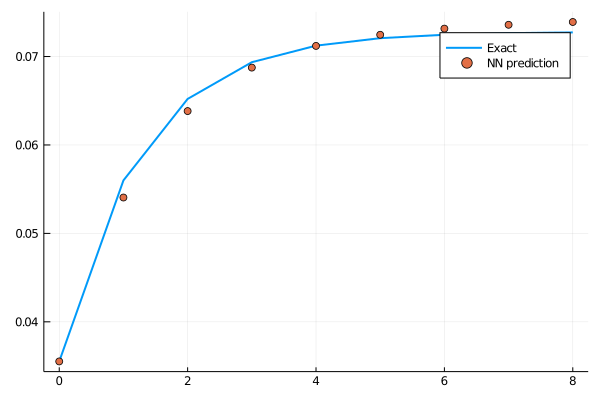

loss: 4.94e-05:  93%|██████████████████████████████████████   |  ETA: 0:00:06

4.697937f-5

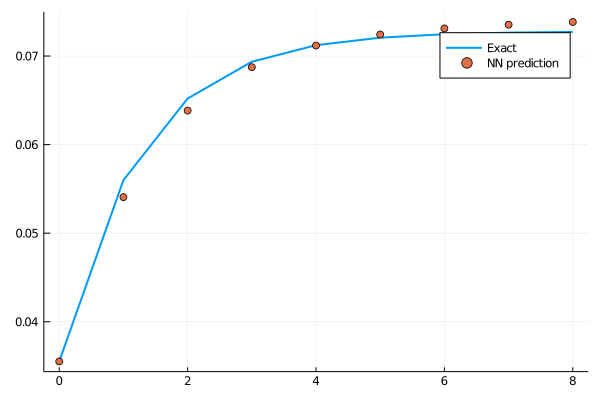

loss: 4.7e-05:  93%|██████████████████████████████████████▏  |  ETA: 0:00:06

4.9158098f-5

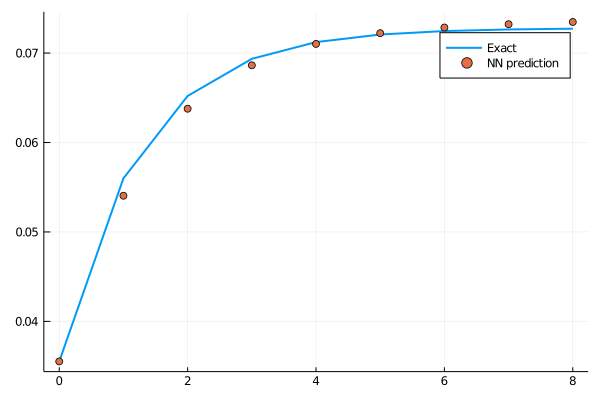

loss: 4.92e-05:  93%|██████████████████████████████████████▎  |  ETA: 0:00:06

4.848213f-5

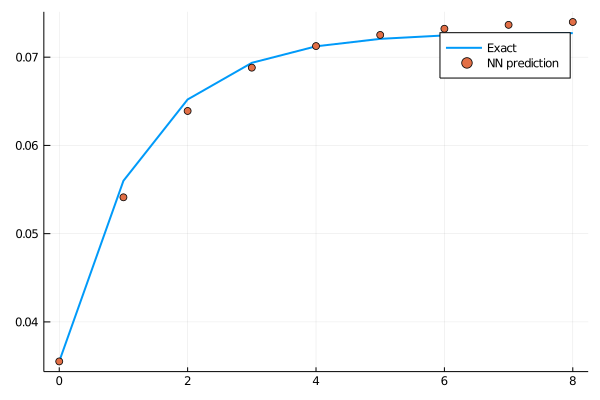

loss: 4.85e-05:  94%|██████████████████████████████████████▍  |  ETA: 0:00:05

4.4732853f-5

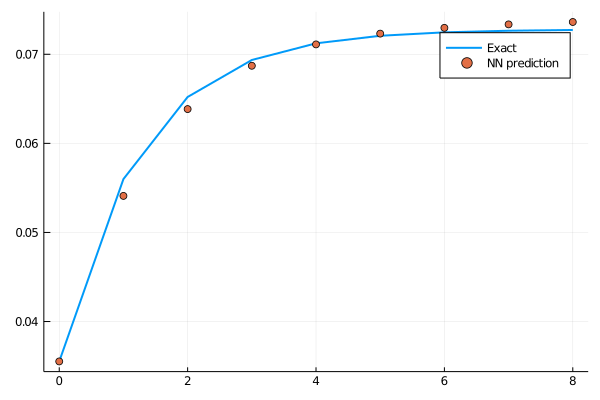

loss: 4.47e-05:  94%|██████████████████████████████████████▌  |  ETA: 0:00:05

4.3855496f-5

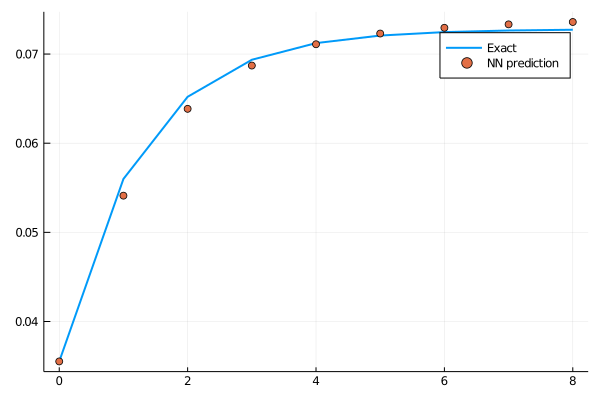

loss: 4.39e-05:  94%|██████████████████████████████████████▋  |  ETA: 0:00:05

4.5040048f-5

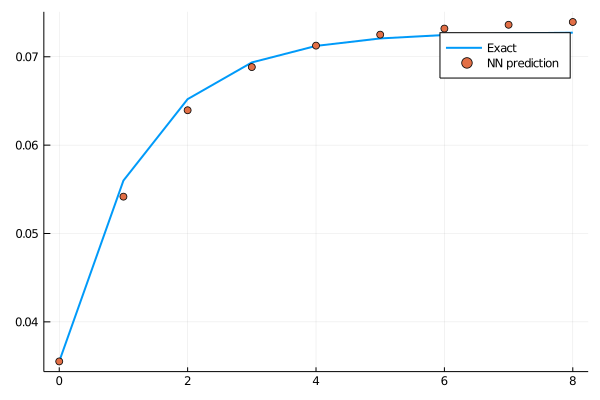

loss: 4.5e-05:  95%|██████████████████████████████████████▊  |  ETA: 0:00:05

4.3691336f-5

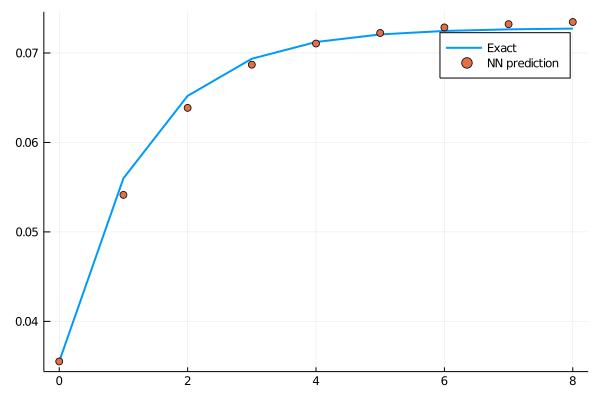

loss: 4.37e-05:  95%|███████████████████████████████████████  |  ETA: 0:00:04

4.113097f-5

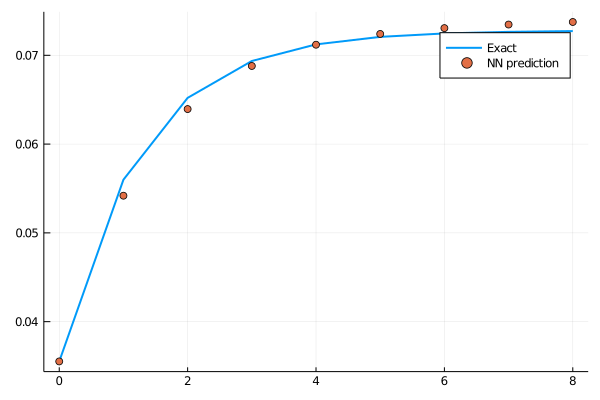

loss: 4.11e-05:  95%|███████████████████████████████████████▏ |  ETA: 0:00:04

4.0842086f-5

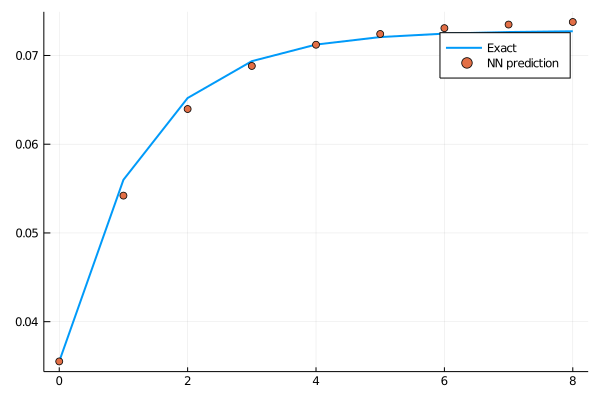

loss: 4.08e-05:  96%|███████████████████████████████████████▎ |  ETA: 0:00:04

4.134498f-5

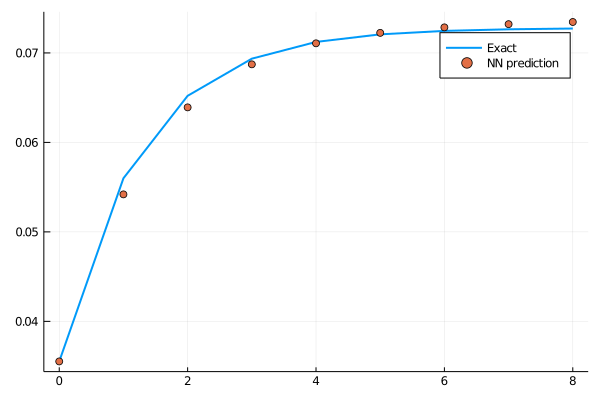

loss: 4.13e-05:  96%|███████████████████████████████████████▍ |  ETA: 0:00:03

3.9976883f-5

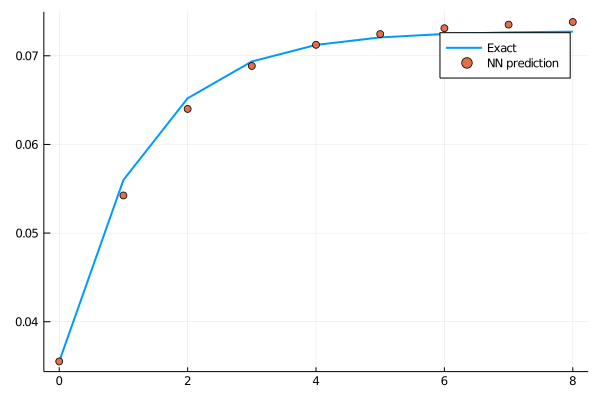

loss: 4e-05:  96%|███████████████████████████████████████▌ |  ETA: 0:00:03

3.8149083f-5

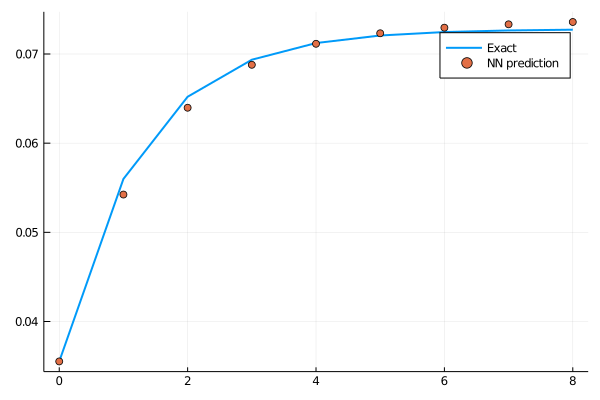

loss: 3.81e-05:  97%|███████████████████████████████████████▋ |  ETA: 0:00:03

3.7943457f-5

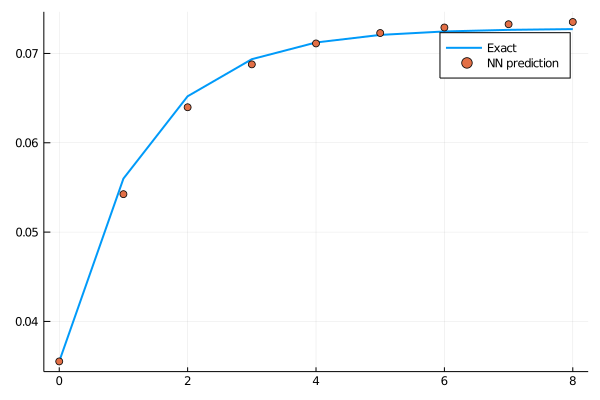

loss: 3.79e-05:  97%|███████████████████████████████████████▊ |  ETA: 0:00:03

3.8141618f-5

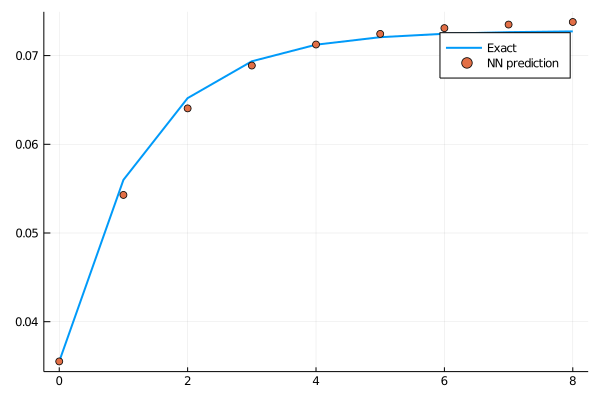

loss: 3.81e-05:  97%|███████████████████████████████████████▉ |  ETA: 0:00:02

3.714442f-5

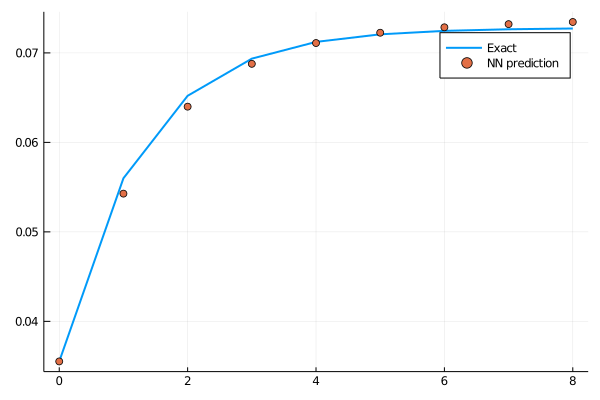

loss: 3.71e-05:  98%|████████████████████████████████████████ |  ETA: 0:00:02

3.6013716f-5

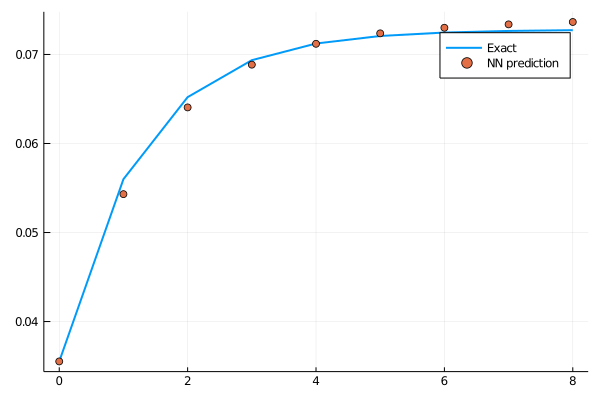

loss: 3.6e-05:  98%|████████████████████████████████████████▏|  ETA: 0:00:02

3.612766f-5

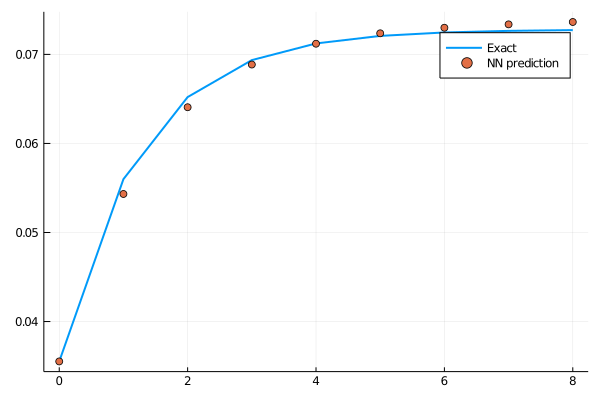

loss: 3.61e-05:  98%|████████████████████████████████████████▎|  ETA: 0:00:01

3.6832877f-5

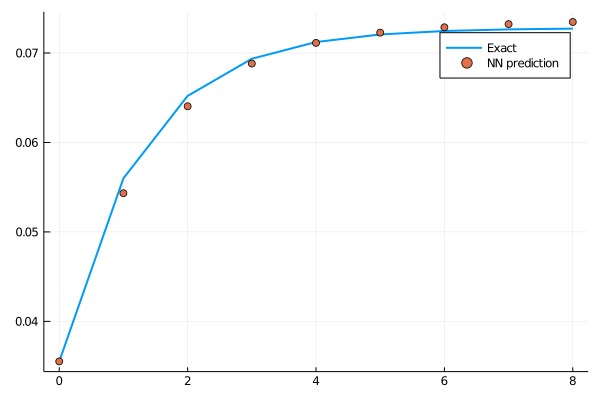

loss: 3.68e-05:  99%|████████████████████████████████████████▍|  ETA: 0:00:01

3.7356764f-5

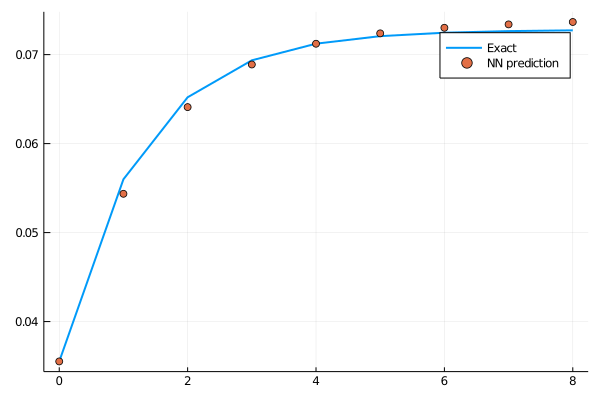

loss: 3.74e-05:  99%|████████████████████████████████████████▋|  ETA: 0:00:01

3.888352f-5

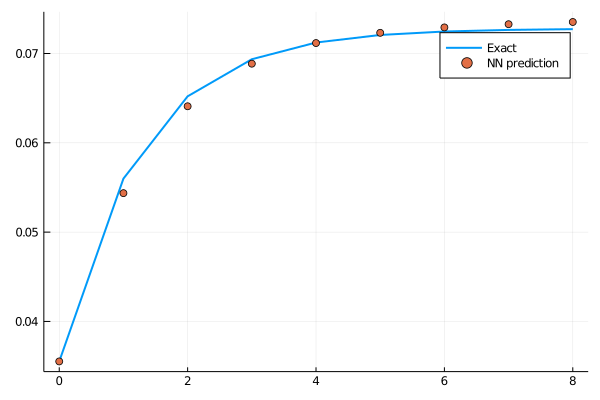

loss: 3.89e-05:  99%|████████████████████████████████████████▊|  ETA: 0:00:01

4.3481366f-5

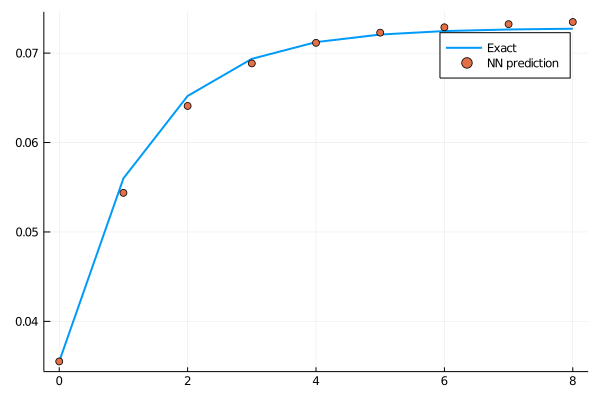

loss: 4.35e-05: 100%|████████████████████████████████████████▉|  ETA: 0:00:00

5.2953703f-5

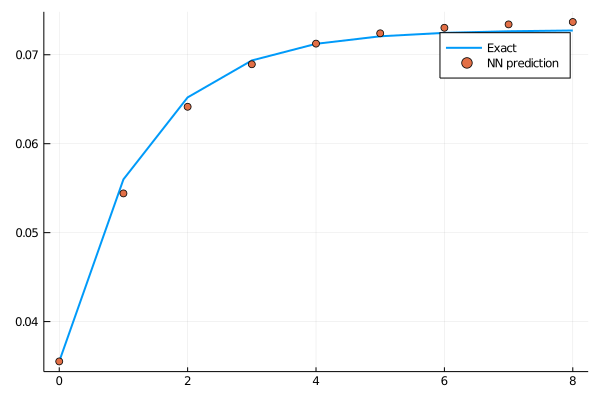

loss: 5.3e-05: 100%|█████████████████████████████████████████| Time: 0:01:23


3.6013716f-5

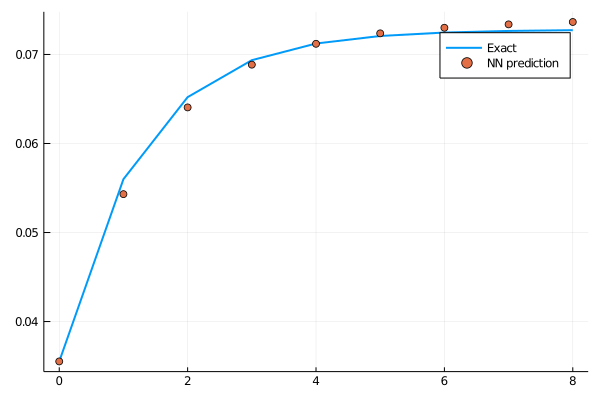

 * Status: failure (reached maximum number of iterations)

 * Candidate solution
    Minimizer: [1.00e-01, 1.11e-01, -5.00e-02,  ...]
    Minimum:   5.295370e-05

 * Found with
    Algorithm:     ADAM
    Initial Point: [9.33e-02, 1.17e-01, -5.33e-02,  ...]

 * Convergence measures
    |x - x'|               = NaN ≰ 0.0e+00
    |x - x'|/|x'|          = NaN ≰ 0.0e+00
    |f(x) - f(x')|         = NaN ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = NaN ≰ 0.0e+00
    |g(x)|                 = NaN ≰ 0.0e+00

 * Work counters
    Seconds run:   84  (vs limit Inf)
    Iterations:    300
    f(x) calls:    300
    ∇f(x) calls:   300


In [13]:
res = DiffEqFlux.sciml_train(loss_n_ode, n_ode.p, ADAM(), cb=cb, maxiters=300)

Improve the training results with BFGS optimizer

7.098503f-5

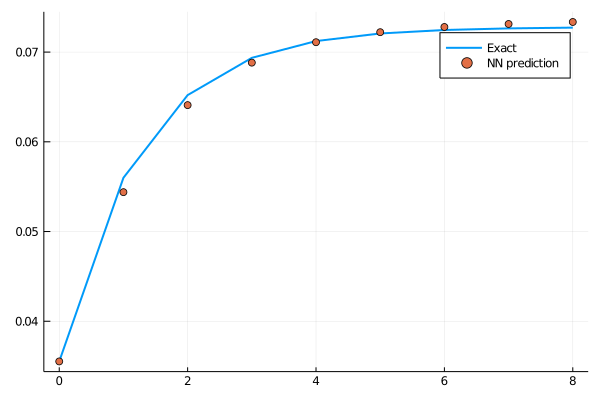

3.164566f-5

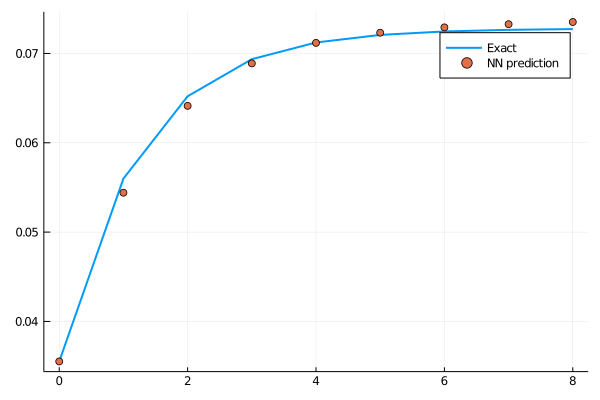

3.1111624f-5

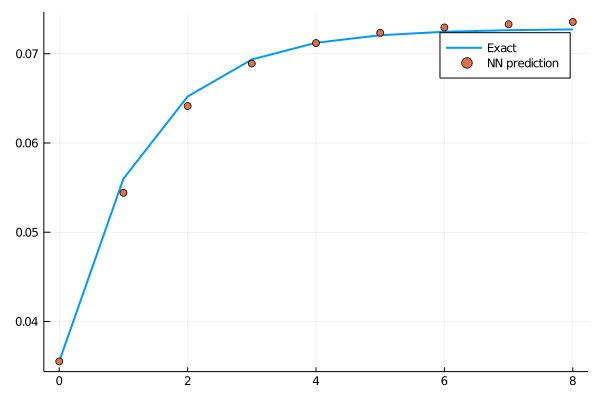

3.1054853f-5

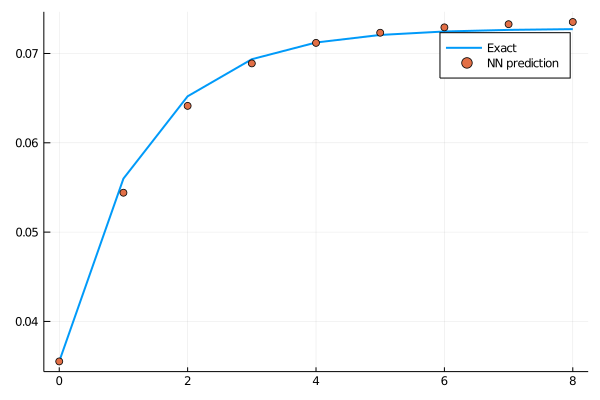

3.104842f-5

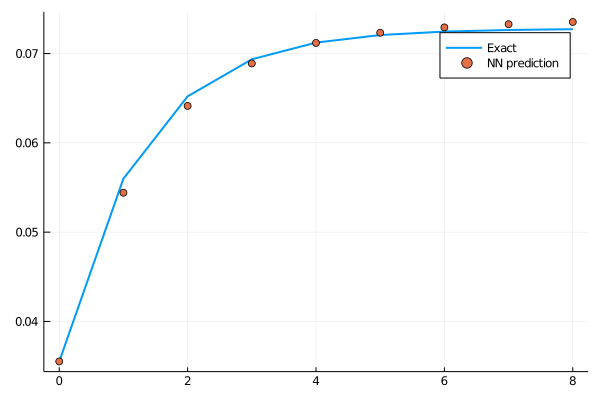

3.104767f-5

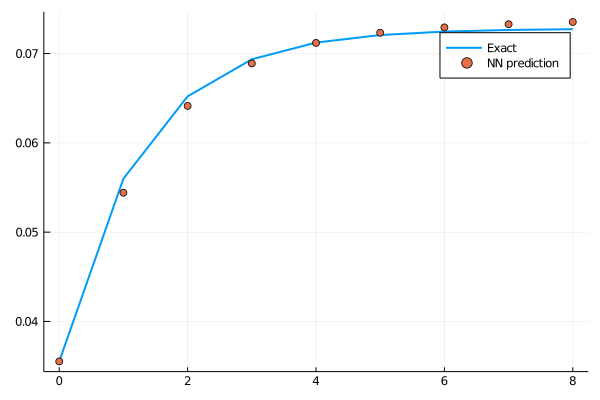

3.1047668f-5

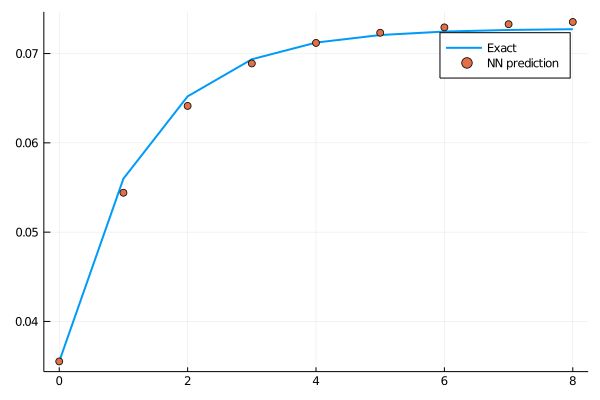

3.1047286f-5

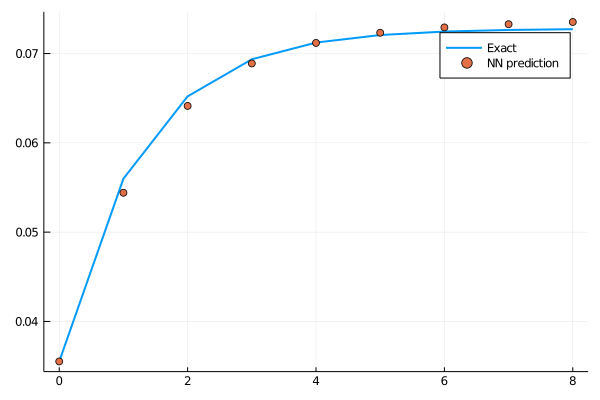

3.104648f-5

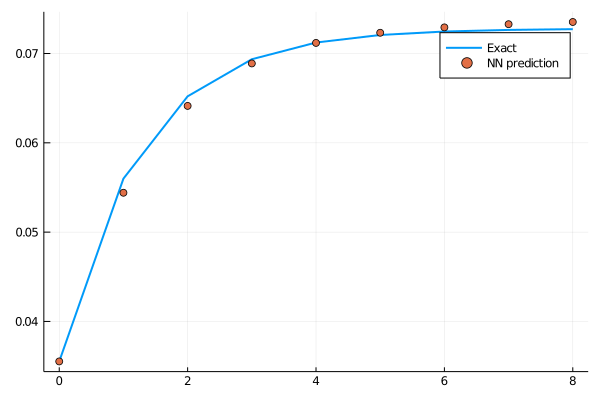

3.104626f-5

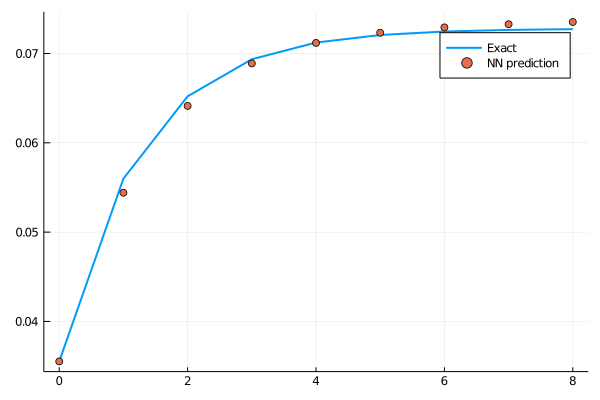

3.104346f-5

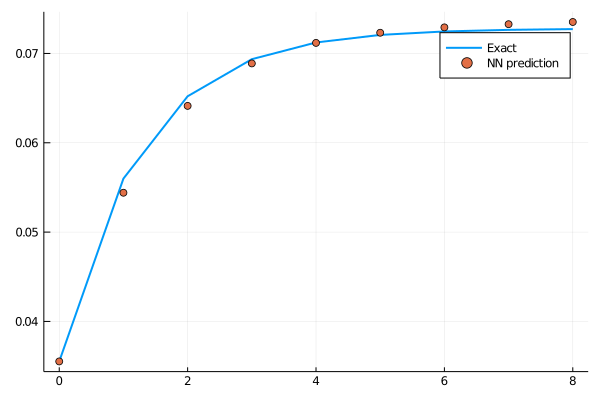

3.1023472f-5

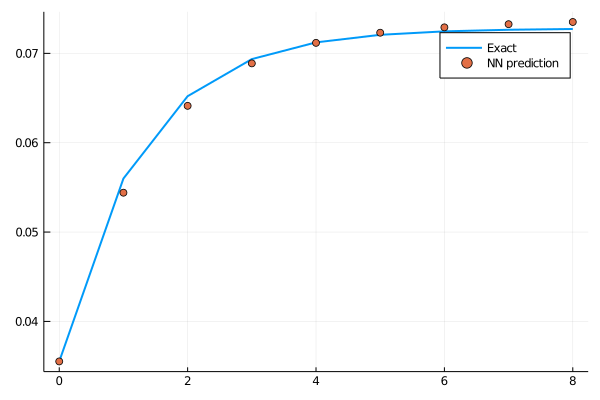

3.0875108f-5

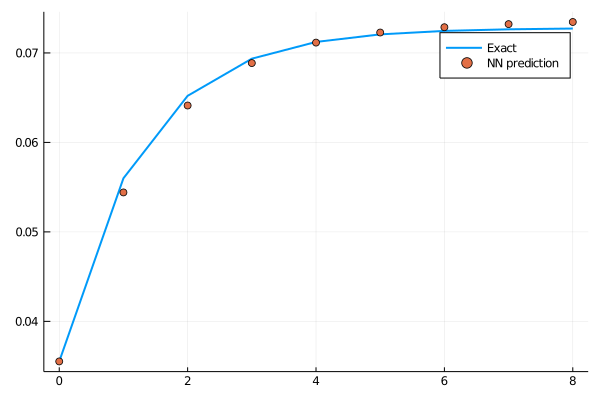

2.871113f-5

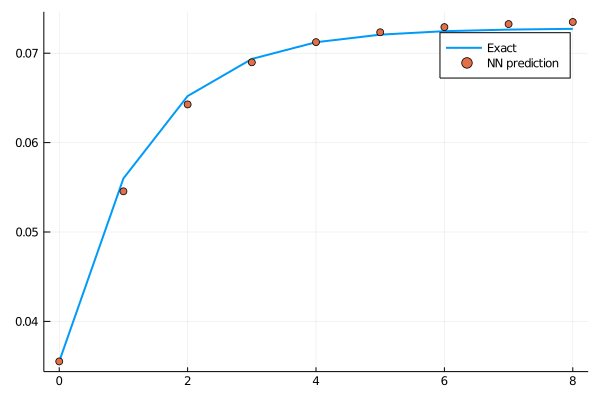

1.9168272f-5

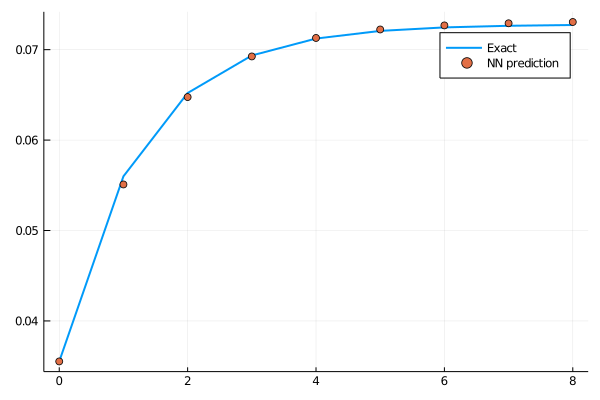

5.5116975f-6

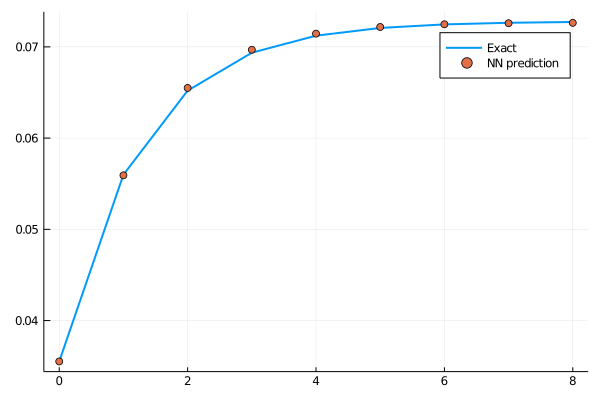

3.833125f-6

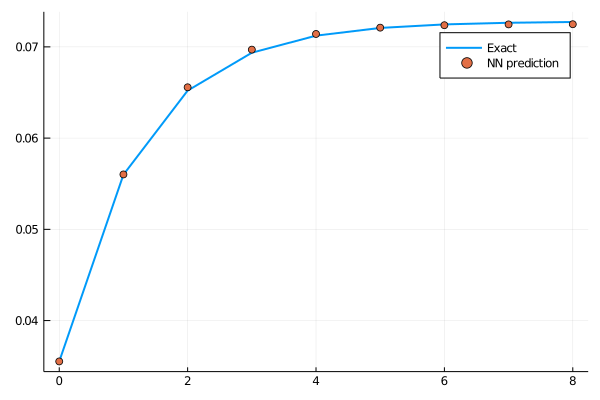

3.705894f-6

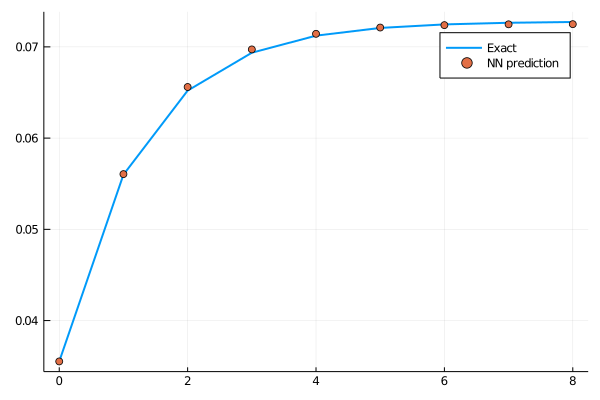

3.6908073f-6

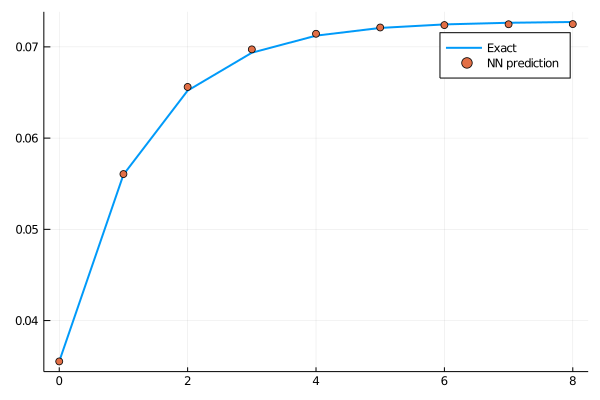

3.6888491f-6

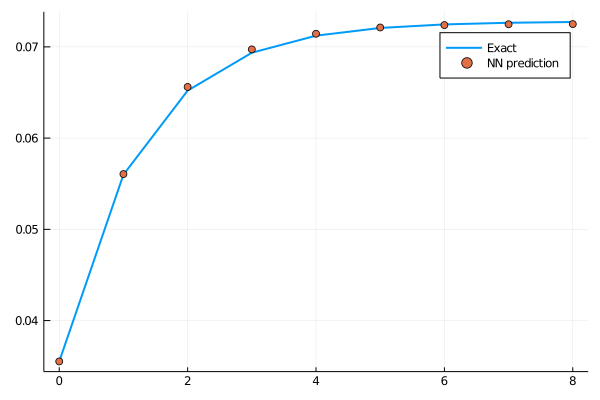

3.6886206f-6

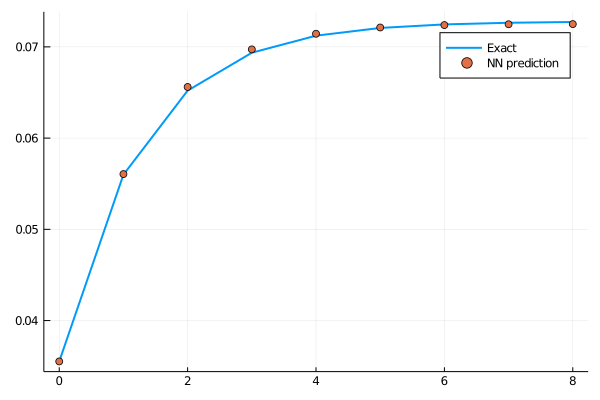

3.6886222f-6

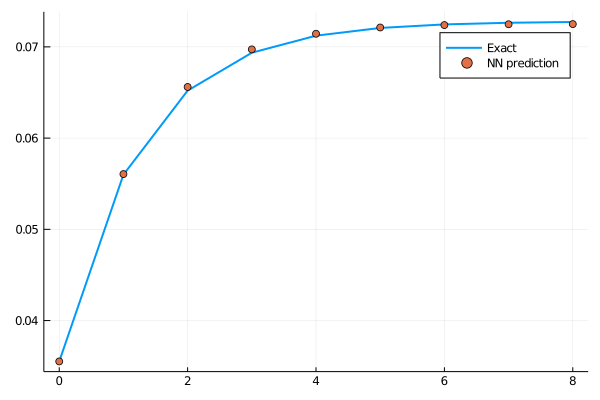

 * Status: failure (objective increased between iterations)

 * Candidate solution
    Minimizer: [1.00e-01, 1.11e-01, -5.00e-02,  ...]
    Minimum:   3.688621e-06

 * Found with
    Algorithm:     L-BFGS
    Initial Point: [1.00e-01, 1.11e-01, -5.00e-02,  ...]

 * Convergence measures
    |x - x'|               = 7.45e-09 ≰ 0.0e+00
    |x - x'|/|x'|          = 2.59e-08 ≰ 0.0e+00
    |f(x) - f(x')|         = 1.59e-12 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 4.31e-07 ≰ 0.0e+00
    |g(x)|                 = 4.32e-05 ≰ 1.0e-08

 * Work counters
    Seconds run:   15  (vs limit Inf)
    Iterations:    21
    f(x) calls:    107
    ∇f(x) calls:   107


In [14]:
res = DiffEqFlux.sciml_train(loss_n_ode, res.minimizer, LBFGS(), cb=cb, maxiters=200)

PDF at final instant

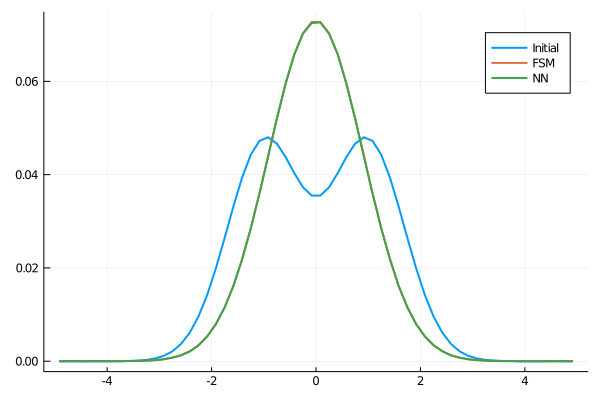

In [15]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,1], lw=2, label="Initial")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,end], lw=2, label="FSM")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D, res.minimizer).u[end], lw=2, label="NN")

Trajectories of PDF

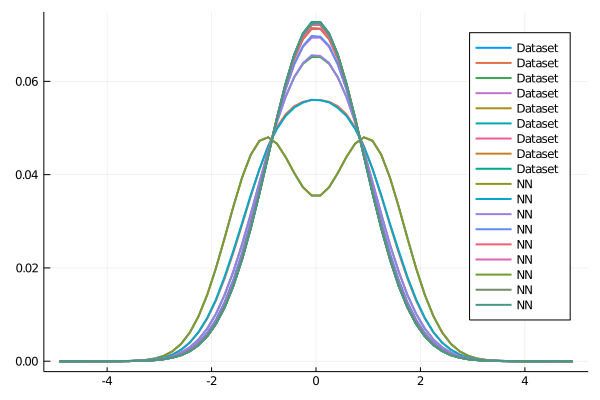

In [16]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,:], lw=2, label="Dataset")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D, res.minimizer).u[:], lw=2, label="NN")

From different given initial value, e.g. Maxwellian

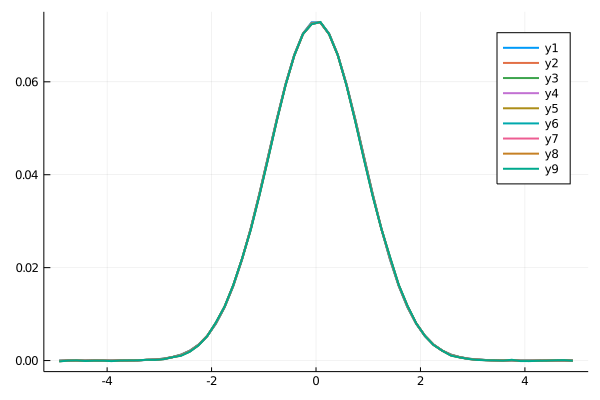

In [17]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(M0_1D, res.minimizer).u[:], lw=2)

In [19]:
using BenchmarkTools

In [21]:
@benchmark n_ode(M0_1D, res.minimizer)

BenchmarkTools.Trial: 
  memory estimate:  22.48 MiB
  allocs estimate:  1793
  --------------
  minimum time:     2.847 ms (0.00% GC)
  median time:      4.955 ms (0.00% GC)
  mean time:        5.803 ms (20.94% GC)
  maximum time:     17.925 ms (67.53% GC)
  --------------
  samples:          858
  evals/sample:     1

In [23]:
@benchmark solve(prob, Tsit5(), saveat=tRange) |> Array

BenchmarkTools.Trial: 
  memory estimate:  23.49 GiB
  allocs estimate:  182034
  --------------
  minimum time:     11.507 s (6.72% GC)
  median time:      11.507 s (6.72% GC)
  mean time:        11.507 s (6.72% GC)
  maximum time:     11.507 s (6.72% GC)
  --------------
  samples:          1
  evals/sample:     1